# Categorical Features

In [2]:
data = [
               {'price': 850000, 'rooms': 4, 'neighborhood': 'Queen Anne'},
               {'price': 700000, 'rooms': 3, 'neighborhood': 'Fremont'},
               {'price': 650000, 'rooms': 3, 'neighborhood': 'Wallingford'},
               {'price': 600000, 'rooms': 2, 'neighborhood': 'Fremont'}
]

In [3]:
from sklearn.feature_extraction import DictVectorizer 

vec = DictVectorizer(sparse=False, dtype=int) 
vec.fit_transform(data)

array([[     0,      1,      0, 850000,      4],
       [     1,      0,      0, 700000,      3],
       [     0,      0,      1, 650000,      3],
       [     1,      0,      0, 600000,      2]], dtype=int64)

In [5]:
vec.transform([{'neighborhood': 'Fremont'}])

array([[1, 0, 0, 0, 0]])

In [6]:
vec.get_feature_names()

['neighborhood=Fremont',
 'neighborhood=Queen Anne',
 'neighborhood=Wallingford',
 'price',
 'rooms']

In [7]:
# если категорий тысячи:
vec = DictVectorizer(sparse=True, dtype=int)
vec.fit_transform(data)

<4x5 sparse matrix of type '<class 'numpy.int64'>'
	with 12 stored elements in Compressed Sparse Row format>

In [8]:
# sklearn.preprocessing.OneHotEncoder
# sklearn.feature_extraction.FeatureHasher

## Text Features

In [9]:
sample = [
    'problem of evil',
    'evil queen',
    'horizon problem'
]

In [10]:
from sklearn.feature_extraction.text import CountVectorizer
vec = CountVectorizer()
X = vec.fit_transform(sample)
X

<3x5 sparse matrix of type '<class 'numpy.int64'>'
	with 7 stored elements in Compressed Sparse Row format>

In [11]:
import pandas as pd
pd.DataFrame(
    X.toarray(), 
    columns=vec.get_feature_names()
)

,evil,horizon,of,problem,queen
0,1,0,1,1,0
1,1,0,0,0,1
2,0,1,0,1,0


## term frequency–inverse document frequency (TF–IDF)

In [13]:
# для того чтобы редкие слова становлись важными

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer 

vec = TfidfVectorizer()
X = vec.fit_transform(sample)
pd.DataFrame(X.toarray(), columns=vec.get_feature_names())

,evil,horizon,of,problem,queen
0,0.517856,0.000000,0.680919,0.517856,0.000000
1,0.605349,0.000000,0.000000,0.000000,0.795961
2,0.000000,0.795961,0.000000,0.605349,0.000000


## Image Features

In [15]:
# будет позже

## Derived Features

In [16]:
# например полиномы. А так - любое преобразование входных признаков

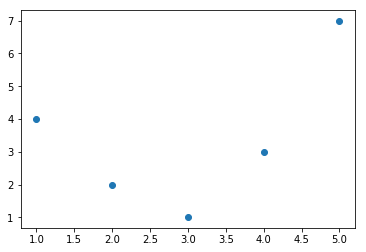

In [19]:
# полиномы:
%matplotlib inline 
import numpy as np
import matplotlib.pyplot as plt

x = np.array([1, 2, 3, 4, 5])
y = np.array([4, 2, 1, 3, 7])
plt.scatter(x, y);

In [20]:
# попробуем обучить линейную регрессию, но будет говно

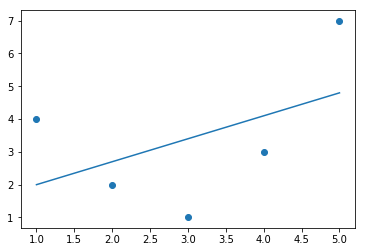

In [21]:
from sklearn.linear_model import LinearRegression 
X = x[:, np.newaxis]

model = LinearRegression().fit(X, y)
yfit = model.predict(X)

plt.scatter(x, y)
plt.plot(x, yfit);

In [22]:
# добавим полином:
from sklearn.preprocessing import PolynomialFeatures 
poly = PolynomialFeatures(degree=3, include_bias=False) 
X2 = poly.fit_transform(X)
print(X2)

[[  1.   1.   1.]
 [  2.   4.   8.]
 [  3.   9.  27.]
 [  4.  16.  64.]
 [  5.  25. 125.]]


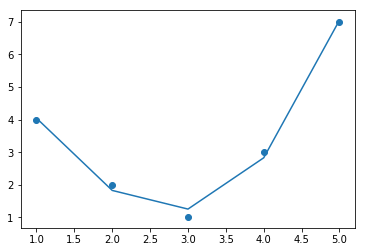

In [23]:
model = LinearRegression().fit(X2, y)
yfit = model.predict(X2)
plt.scatter(x, y)
plt.plot(x, yfit);

# но вообще тема не раскрыта

## Imputation of Missing Data

In [26]:
# закрываем Nan

In [27]:
from numpy import nan 
X = np.array([[nan,0, 3],
              [3, 7, 9], 
              [3, 5, 2], 
              [4, nan,6], 
              [8, 8, 1]])
y = np.array([14, 16, -1,  8, -5])

The sophisticated approaches tend to be very application-specific, and we won’t dive into them here. For a baseline imputation approach, using the mean, median, or most frequent value, Scikit-Learn provides the Imputer class:

In [28]:
from sklearn.preprocessing import Imputer 

imp = Imputer(strategy='mean')
X2 = imp.fit_transform(X)
X2

array([[4.5, 0. , 3. ],
       [3. , 7. , 9. ],
       [3. , 5. , 2. ],
       [4. , 5. , 6. ],
       [8. , 8. , 1. ]])

## Feature Pipelines

In [29]:
from sklearn.pipeline import make_pipeline
model = make_pipeline(
    Imputer(strategy='mean'), 
    PolynomialFeatures(degree=2),
    LinearRegression())

model.fit(X, y) # X with missing values, from above print(y)
print(model.predict(X))

[14. 16. -1.  8. -5.]


# In Depth: Naive Bayes Classification

In [31]:
# быстрый, простой, плохо настраиваемый

## Bayesian Classification

In [35]:
%%html 
<img src='imgs/bayes.png'>

все что тут нужно - это модель, которая сможет расчитать P(L | feature)

такие модели называются генеративными, потому что они генерируют гипотетический случайный процесс, который мог бы создать такие данные

The general version of such a training step is a very difficult task, but we can make it simpler through the use of some simplifying assumptions about the form of this model.
This is where the “naive” in “naive Bayes” comes in: if we make very naive assumptions about the generative model for each label, we can find a rough approximation of the generative model for each class, and then proceed with the Bayesian classification. Different types of naive Bayes classifiers rest on different naive assumptions about the data, and we will examine a few of these in the following sections. We begin with the standard imports:

в общем мы предполагаем какое распределение у данных и "примеряем его"

In [37]:
%matplotlib inline 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set()

## Gaussian Naive Bayes

In [39]:
# the assumption is that data from each label is drawn from a simple Gaus‐ sian distribution

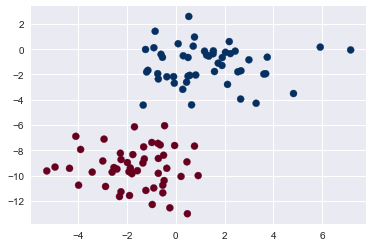

In [40]:
from sklearn.datasets import make_blobs
X, y = make_blobs(
    100, 
    2, 
    centers=2, 
    random_state=2, 
    cluster_std=1.5) 

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='RdBu');

такую модель можно обучить найдя mean и std для каждого label

In [42]:
%%html 
<img src='imgs/g_bayes.png'>

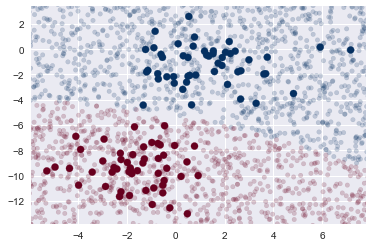

In [44]:
from sklearn.naive_bayes import GaussianNB 

# тренеруем
model = GaussianNB()
model.fit(X, y);

# генерим новые данные
rng = np.random.RandomState(0)
Xnew = [-6, -14] + [14, 18] * rng.rand(2000, 2)
ynew = model.predict(Xnew)

# смотрим
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='RdBu')
lim = plt.axis()
plt.scatter(Xnew[:, 0], Xnew[:, 1], c=ynew, s=20, cmap='RdBu', alpha=0.2)
plt.axis(lim);

In [47]:
# в случаее с байесовскими методами в predict_proba мы действительно получаем апостериорные вероятности
yprob = model.predict_proba(Xnew)
yprob[-8:].round(2)

array([[0.89, 0.11],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [0.  , 1.  ],
       [0.15, 0.85]])

## Multinomial Naive Bayes

The multinomial distribution describes the probability of observing counts among a number of categories, and thus multinomial naive Bayes is most appropriate for features that represent counts or count rates.

In [49]:
# Example: Classifying text
from sklearn.datasets import fetch_20newsgroups

data = fetch_20newsgroups()
data.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [50]:
# упростим задачу выбрав пару категорий
categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics']

train = fetch_20newsgroups(subset='train', categories=categories)
test = fetch_20newsgroups(subset='test', categories=categories)

In [51]:
print(train.data[5])

From: dmcgee@uluhe.soest.hawaii.edu (Don McGee)
Subject: Federal Hearing
Originator: dmcgee@uluhe
Organization: School of Ocean and Earth Science and Technology
Distribution: usa
Lines: 10


Fact or rumor....?  Madalyn Murray O'Hare an atheist who eliminated the
use of the bible reading and prayer in public schools 15 years ago is now
going to appear before the FCC with a petition to stop the reading of the
Gospel on the airways of America.  And she is also campaigning to remove
Christmas programs, songs, etc from the public schools.  If it is true
then mail to Federal Communications Commission 1919 H Street Washington DC
20054 expressing your opposition to her request.  Reference Petition number

2493.



In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer 
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline

model = make_pipeline(TfidfVectorizer(), MultinomialNB())

In [53]:
model.fit(train.data, train.target)
labels = model.predict(test.data)

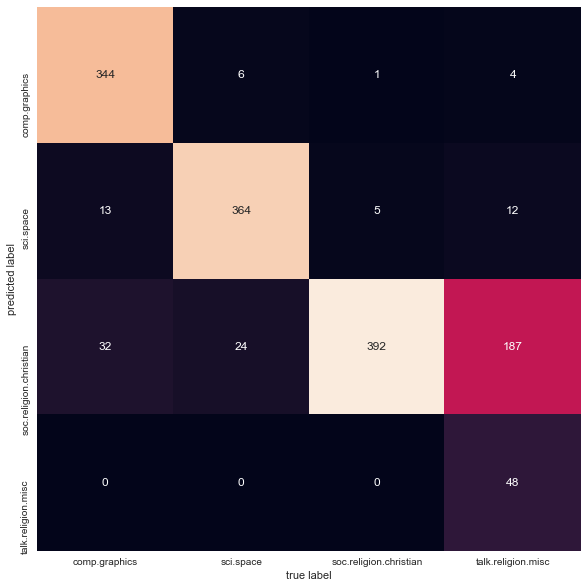

In [55]:
from sklearn.metrics import confusion_matrix

plt.rcParams['figure.figsize'] = 15, 10

mat = confusion_matrix(test.target, labels)
sns.heatmap(
    mat.T, 
    square=True, 
    annot=True, 
    fmt='d', 
    cbar=False,
    xticklabels=train.target_names, 
    yticklabels=train.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [57]:
# тепреь можно предсказывать категорию любой строки:
def predict_category(s, train=train, model=model): 
    pred = model.predict([s])
    return train.target_names[pred[0]]

In [58]:
predict_category('sending a payload to the ISS')

'sci.space'

In [59]:
predict_category('determining the screen resolution')

'comp.graphics'

# a very naive algorithm, when used carefully and trained on a large set of high-dimensional data, can be surprisingly effective

### When to Use Naive Bayes

Чем он хорош:
* They are extremely fast for both training and prediction
* They provide straightforward probabilistic prediction
* They are often very easily interpretable
* They have very few (if any) tunable parameters

поэтому можно использовать, когда:
* When the naive assumptions actually match the data (very rare in practice)
* For very well-separated categories, when model complexity is less important
* For very high-dimensional data, when model complexity is less important

# In Depth: Linear Regression

# Linear Regression from scratch

In [190]:
# y = m*x + b

нам нужны метод наименьших квадратов или градиентный спуск

# Метод наименьших квадратов

In [212]:
%%html
<img src='imgs/lr2.png'>

In [194]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline


dataset = pd.read_csv('data/lr_from_scratch.csv')
print(dataset.shape)
dataset.head()

(237, 4)


,Gender,Age Range,Head Size(cm^3),Brain Weight(grams)
0,1,1,4512,1530
1,1,1,3738,1297
2,1,1,4261,1335
3,1,1,3777,1282
4,1,1,4177,1590


In [209]:
X = dataset['Head Size(cm^3)']
y = dataset['Brain Weight(grams)']
Y = dataset['Brain Weight(grams)']

In [208]:
X.shape, y.shape

((237,), (237,))

In [197]:
# mean of our inputs and outputs
x_mean = np.mean(X)
y_mean = np.mean(y)

In [198]:
#total number of values
n = len(X)

In [200]:
#total number of values
n = len(X)

# using the formula to calculate the b1 and b0
numerator = 0
denominator = 0

for i in range(n):
    numerator += (X[i] - x_mean) * (y[i] - y_mean)
    denominator += (X[i] - x_mean) ** 2
    
b1 = numerator / denominator
b0 = y_mean - (b1 * x_mean)

#printing the coefficient
print(b1, b0)

0.26342933948939945 325.57342104944223


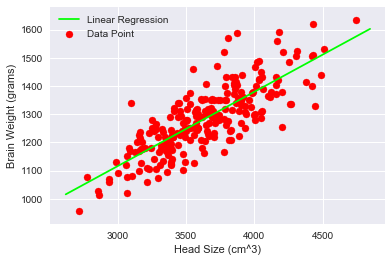

In [210]:
#plotting values 
x_max = np.max(X) + 100
x_min = np.min(X) - 100

#calculating line values of x and y
x = np.linspace(x_min, x_max, 1000)
y = b0 + b1 * x

#plotting line 
plt.plot(x, y, color='#00ff00', label='Linear Regression')

#plot the data point
plt.scatter(X, Y, color='#ff0000', label='Data Point')

# x-axis label
plt.xlabel('Head Size (cm^3)')

#y-axis label
plt.ylabel('Brain Weight (grams)')
plt.legend()
plt.show()

# Градиентный спуск

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly

%matplotlib inline

import plotly.plotly as py
import matplotlib.pyplot as plt
from matplotlib import style

In [2]:
df = pd.read_csv('data/housingdata.csv', header=None)
df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.9,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.9,9.14,21.6


In [3]:
housing_colnames = [
    'CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV'
]
df.columns = housing_colnames
df.head(2)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.9,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.9,9.14,21.6


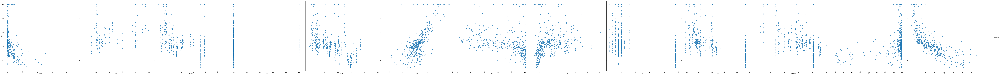

In [4]:
g = sns.PairGrid(df,
                 y_vars=['MEDV'], 
                 x_vars=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT'],
                 palette='RdBu_r',
                 height=10
                )
g.map(plt.scatter, alpha=0.8)
g.add_legend();

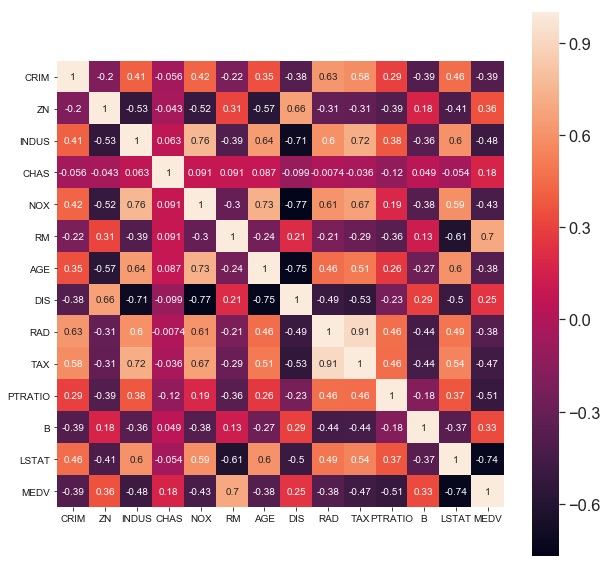

In [5]:
fig = plt.subplots(figsize = (10,10))
sns.set(font_scale=1.5)
sns.heatmap(df.corr(), square = True, cbar=True, annot=True, annot_kws={'size': 10})
plt.show()

In [6]:
%%html
<img src='imgs/gd.png'>

In [16]:
def predictPrice(x, theta):
    return np.dot(x, theta)

def calculateCost(x,theta,Y):
    prediction = predictPrice(x, theta)
    return ((prediction - Y) ** 2).mean() / 2

In [68]:
df.values[:, :2]

array([[  6.32000000e-03,   1.80000000e+01],
       [  2.73100000e-02,   0.00000000e+00],
       [  2.72900000e-02,   0.00000000e+00],
       ..., 
       [  6.07600000e-02,   0.00000000e+00],
       [  1.09590000e-01,   0.00000000e+00],
       [  4.74100000e-02,   0.00000000e+00]])

In [73]:
def fabline(x,theta,Y):
    """Plot a line from slope and intercept"""
    y_vals = predictPrice(x,theta)

    plt.xlim(0, 20)
    plt.ylim(-10, 60)

    plt.xlabel('No. of Rooms in the house')
    plt.ylabel('Price of house')

    plt.gca().set_aspect(0.1, adjustable='datalim')
    plt.plot(x, Y,'.', x, y_vals, '-')

    plt.show()

In [78]:
def abline(x,theta,Y):
    """Plot a line from slope and intercept"""
    y_vals = predictPrice(x,theta)

    plt.xlim(0, 20)
    plt.ylim(-10, 60)

    plt.xlabel('No. of Rooms in the house')
    plt.ylabel('Price of house')

    plt.gca().set_aspect(0.1, adjustable='datalim')
    plt.plot(x[:, 1], Y,'.', x[:, 1], y_vals, '-')

    plt.show()

In [23]:
predictor = df["RM"]
np.column_stack((np.ones(len(predictor)), predictor))

array([[ 1.   ,  6.575],
       [ 1.   ,  6.421],
       [ 1.   ,  7.185],
       ..., 
       [ 1.   ,  6.976],
       [ 1.   ,  6.794],
       [ 1.   ,  6.03 ]])

In [75]:
def gradientDescentLinearRegression(alpha=0.047,iter=5000):
    theta0 = []
    theta1 = []
    costs = []
    predictor = df["RM"]
    
    x = np.column_stack((np.ones(len(predictor)), predictor))
    Y = df["MEDV"]
    
    theta = np.zeros(2)
    
    for i in range(iter):
        pred = predictPrice(x, theta)
        t0 = theta[0] - alpha *(pred - Y).mean()
        t1 = theta[1] - alpha *((pred - Y) * x[:,1]).mean()
        
        theta = np.array([t0,t1])
        J = calculateCost(x, theta, Y)
        theta0.append(t0)
        theta1.append(t1)
        costs.append(J)
        if i%1000==0:
            print("Iteration: {},Cost = {},theta = {}".format(i + 1, J, theta))
            print('theta = {}, dec1: {}, dec2: {}'.format(theta, 
                                                          alpha *(pred - Y).mean(), 
                                                          alpha *((pred - Y)* x[:,1]).mean())
                 )
            fabline(x,theta,Y)
    print('theta0 = {}\ntheta1 = {}\nCosts = {}'.format(len(theta0), len(theta1), len(costs)))

In [47]:
def gradientDescentLinearRegression2(alpha=0.047,iter=5000):
    theta0 = []
    theta1 = []
    costs = []
    predictor = df["RM"]
    
    x = np.column_stack((np.ones(len(predictor)), predictor, df['NOX']))
    Y = df["MEDV"]
    
    theta = np.zeros(3)
    
    for i in range(iter):
        pred = predictPrice(x, theta)
        t0 = theta[0] - alpha *(pred - Y).mean()
        t1 = theta[1] - alpha *((pred - Y) * x[:,1]).mean()
        t2 = theta[2] - alpha *((pred - Y) * x[:,2]).mean()
        
        theta = np.array([t0,t1, t2])
        J = calculateCost(x, theta, Y)
        theta0.append(t0)
        theta1.append(t1)
        costs.append(J)
        if i%1000==0:
            print("Iteration: {},Cost = {},theta = {}".format(i + 1, J, theta))
            print('theta = {}, dec1: {}, dec2: {}'.format(theta, 
                                                          alpha *(pred - Y).mean(), 
                                                          alpha *((pred - Y)* x[:,1]).mean())
                 )
            abline(x, theta,Y)
    print('theta0 = {}\ntheta1 = {}\nCosts = {}'.format(len(theta0), len(theta1), len(costs)))

In [53]:
df[df.LSTAT.isnull()]['LSTAT']

Series([], Name: LSTAT, dtype: float64)

In [89]:
def gradientDescentLinearRegression3(alpha=0.047,iter=5000):
    theta0 = []
    theta1 = []
    costs = []
    predictor = df["RM"]
    
    x = np.column_stack((np.ones(len(predictor)), predictor, df['NOX'], df['ZN']))
    Y = df["MEDV"]
    
    theta = np.array([-14.53252661,   7.29880304, -16.40428269,   0.03037079])
    
    for i in range(iter):
        pred = predictPrice(x, theta)
        t0 = theta[0] - alpha *(pred - Y).mean()
        t1 = theta[1] - alpha *((pred - Y) * x[:, 1]).mean()
        t2 = theta[2] - alpha *((pred - Y) * x[:, 2]).mean()
        t3 = theta[3] - alpha *((pred - Y) * x[:, 3]).mean() 
        
        theta = np.array([t0, t1, t2, t3])
        J = calculateCost(x, theta, Y)
        theta0.append(t0)
        theta1.append(t1)
        costs.append(J)
        if i%1000==0:
            print("Iteration: {},Cost = {},theta = {}".format(i + 1, J, theta))
            print('theta = {}, dec1: {}, dec2: {}'.format(theta, 
                                                          alpha *(pred - Y).mean(), 
                                                          alpha *((pred - Y)* x[:,1]).mean())
                 )
            abline(x, theta,Y)
    print('theta0 = {}\ntheta1 = {}\nCosts = {}'.format(len(theta0), len(theta1), len(costs)))

Iteration: 1,Cost = 258.0310838585914,theta = [ 1.0590419   6.86646571]
theta = [ 1.0590419   6.86646571], dec1: -1.0590418972332019, dec2: -6.866465705928854


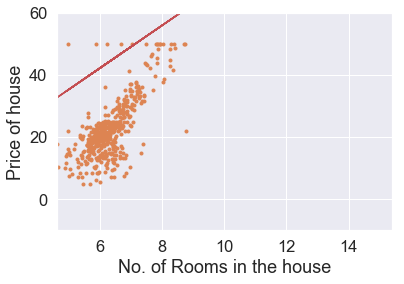

Iteration: 1001,Cost = 24.266176819465997,theta = [-14.66352286   5.95689176]
theta = [-14.66352286   5.95689176], dec1: 0.011312600350502668, dec2: -0.0017783981264473693


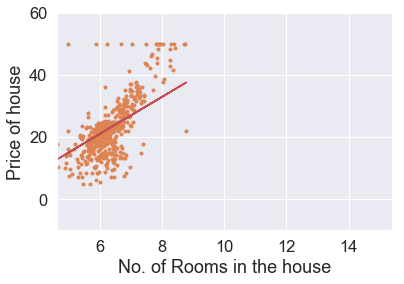

Iteration: 2001,Cost = 22.59641457365931,theta = [-23.30244842   7.31497465]
theta = [-23.30244842   7.31497465], dec1: 0.006427898295528944, dec2: -0.0010104981994898843


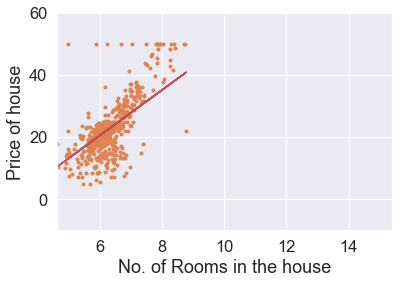

Iteration: 3001,Cost = 22.05731654846794,theta = [-28.21114608   8.08664681]
theta = [-28.21114608   8.08664681], dec1: 0.0036523765728040387, dec2: -0.0005741721136455363


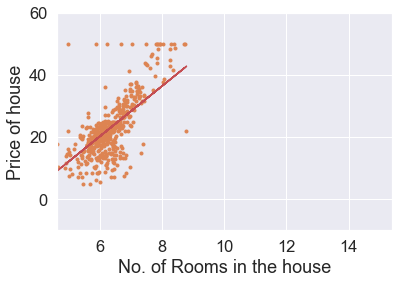

Iteration: 4001,Cost = 21.883263816412775,theta = [-31.00030227   8.52511631]
theta = [-31.00030227   8.52511631], dec1: 0.002075305802340191, dec2: -0.0003262485932767547


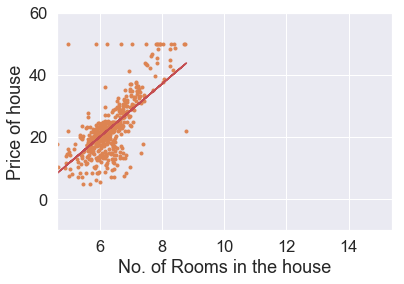

theta0 = 5000
theta1 = 5000
Costs = 5000


In [76]:
gradientDescentLinearRegression()

Iteration: 1,Cost = 265.05180607224264,theta = [ 1.0590419   6.86646571  0.56608322]
theta = [ 1.0590419   6.86646571  0.56608322], dec1: -1.0590418972332019, dec2: -6.866465705928854


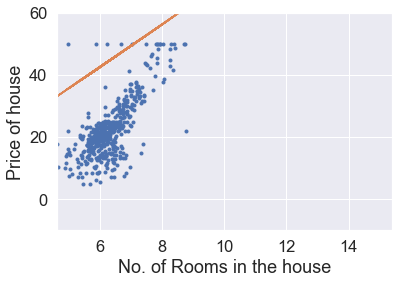

Iteration: 1001,Cost = 20.38143645566433,theta = [-10.80187522   6.67477838 -15.30323143]
theta = [-10.80187522   6.67477838 -15.30323143], dec1: 0.005892739450345114, dec2: -0.0015585996512240755


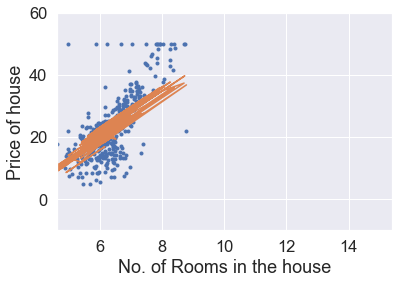

Iteration: 2001,Cost = 19.6913583335023,theta = [-14.37522754   7.57249387 -19.17976179]
theta = [-14.37522754   7.57249387 -19.17976179], dec1: 0.002041853876594688, dec2: -0.0004663096792036868


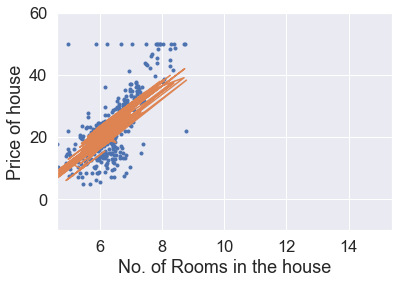

Iteration: 3001,Cost = 19.630914167093355,theta = [-15.73931891   7.85509061 -19.96599757]
theta = [-15.73931891   7.85509061 -19.96599757], dec1: 0.000903344160678151, dec2: -0.0001613086841510549


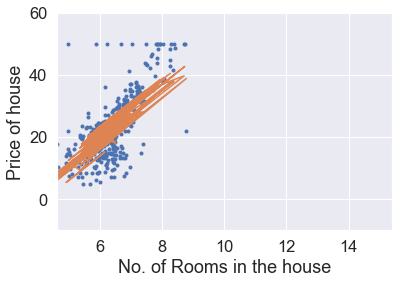

Iteration: 4001,Cost = 19.620350656376228,theta = [-16.41962777   7.96274973 -19.97403114]
theta = [-16.41962777   7.96274973 -19.97403114], dec1: 0.0005191256073856154, dec2: -7.120095764619793e-05


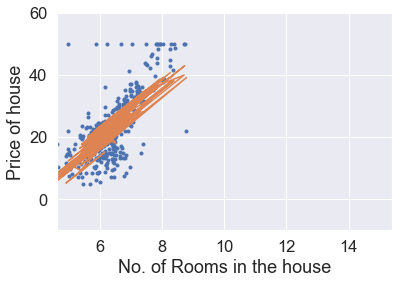

theta0 = 5000
theta1 = 5000
Costs = 5000


In [79]:
gradientDescentLinearRegression2()

Iteration: 1,Cost = 19.621955582824416,theta = [-14.53257733   7.29881497 -16.40432396   0.03037059]
theta = [-14.53257733   7.29881497 -16.40432396   0.03037059], dec1: 5.0723691901915145e-05, dec2: -1.1931831705043945e-05


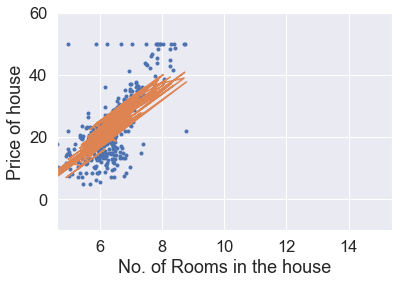

Iteration: 1001,Cost = 19.617627889855257,theta = [-14.5828555    7.31062648 -16.44506867   0.03017355]
theta = [-14.5828555    7.31062648 -16.44506867   0.03017355], dec1: 4.983657899313024e-05, dec2: -1.1692310942282038e-05


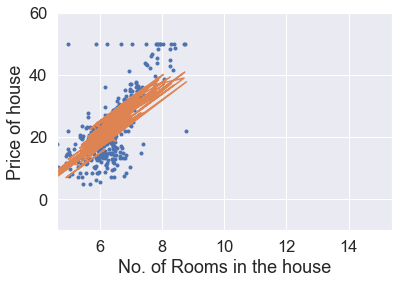

Iteration: 2001,Cost = 19.61347706908963,theta = [-14.63225567   7.32220106 -16.48477161   0.02998103]
theta = [-14.63225567   7.32220106 -16.48477161   0.02998103], dec1: 4.896762656777663e-05, dec2: -1.1457906190745422e-05


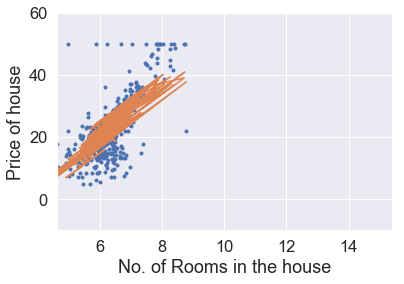

Iteration: 3001,Cost = 19.60949563517631,theta = [-14.68079582   7.33354372 -16.52345608   0.02979294]
theta = [-14.68079582   7.33354372 -16.52345608   0.02979294], dec1: 4.8116452081498814e-05, dec2: -1.1228480078313818e-05


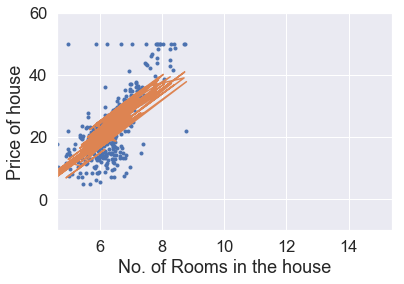

Iteration: 4001,Cost = 19.60567642213793,theta = [-14.72849353   7.34465941 -16.56114488   0.02960917]
theta = [-14.72849353   7.34465941 -16.56114488   0.02960917], dec1: 4.7282676077735203e-05, dec2: -1.1003925405714514e-05


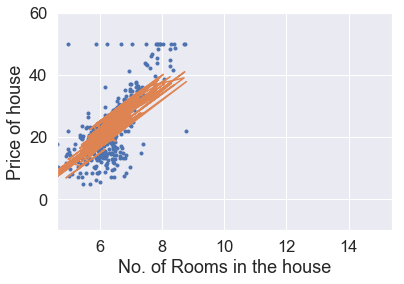

Iteration: 5001,Cost = 19.60201256971921,theta = [-14.77536602   7.35555294 -16.5978603    0.02942963]
theta = [-14.77536602   7.35555294 -16.5978603    0.02942963], dec1: 4.646592727948383e-05, dec2: -1.0784137289011047e-05


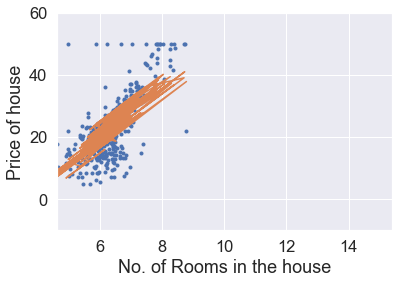

Iteration: 6001,Cost = 19.59849751031895,theta = [-14.82143013   7.36622902 -16.63362416   0.02925423]
theta = [-14.82143013   7.36622902 -16.63362416   0.02925423], dec1: 4.5665842412587235e-05, dec2: -1.0569013109593128e-05


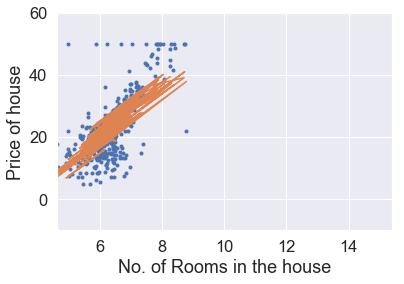

Iteration: 7001,Cost = 19.595124956480852,theta = [-14.86670235   7.37669228 -16.66845777   0.02908287]
theta = [-14.86670235   7.37669228 -16.66845777   0.02908287], dec1: 4.488206603281652e-05, dec2: -1.0358452465341186e-05


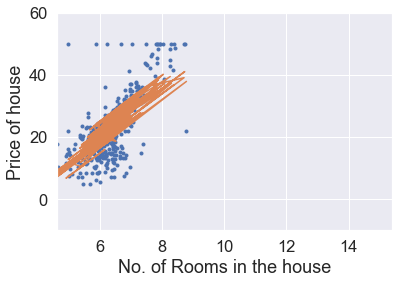

Iteration: 8001,Cost = 19.591888888919303,theta = [-14.91119881   7.38694721 -16.70238201   0.02891548]
theta = [-14.91119881   7.38694721 -16.70238201   0.02891548], dec1: 4.411425035678406e-05, dec2: -1.0152357122323386e-05


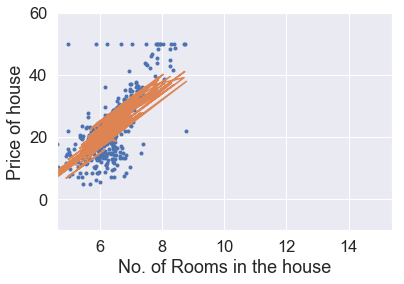

Iteration: 9001,Cost = 19.588783545057193,theta = [-14.9549353    7.39699824 -16.73541731   0.02875195]
theta = [-14.9549353    7.39699824 -16.73541731   0.02875195], dec1: 4.3362055096397994e-05, dec2: -9.95063096822536e-06


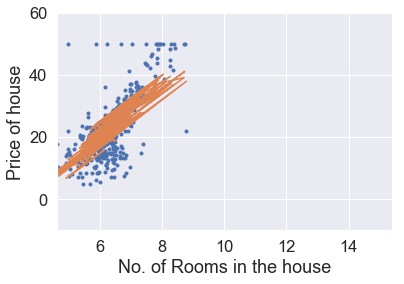

Iteration: 10001,Cost = 19.58580340805384,theta = [-14.99792727   7.4068497  -16.76758361   0.02859221]
theta = [-14.99792727   7.4068497  -16.76758361   0.02859221], dec1: 4.2625147296892923e-05, dec2: -9.7531799667627e-06


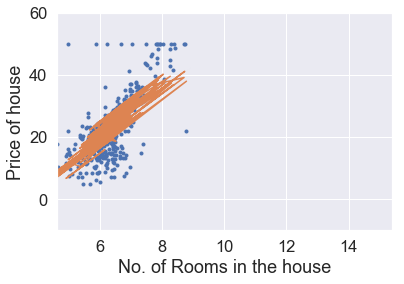

Iteration: 11001,Cost = 19.582943196302203,theta = [-15.04018985   7.4165058  -16.79890047   0.02843618]
theta = [-15.04018985   7.4165058  -16.79890047   0.02843618], dec1: 4.190320117853786e-05, dec2: -9.559912112041301e-06


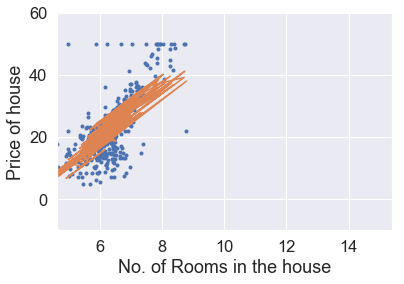

Iteration: 12001,Cost = 19.580197853375125,theta = [-15.08173784   7.42597069 -16.82938698   0.02828376]
theta = [-15.08173784   7.42597069 -16.82938698   0.02828376], dec1: 4.119589798149452e-05, dec2: -9.370737385548231e-06


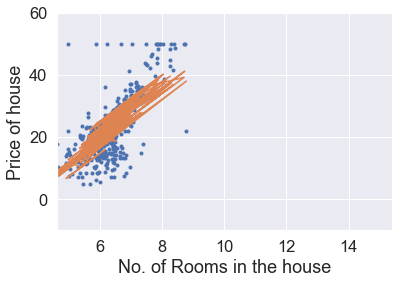

Iteration: 13001,Cost = 19.577562538401548,theta = [-15.12258572   7.43524842 -16.85906184   0.02813489]
theta = [-15.12258572   7.43524842 -16.85906184   0.02813489], dec1: 4.050292581424753e-05, dec2: -9.185567712730561e-06


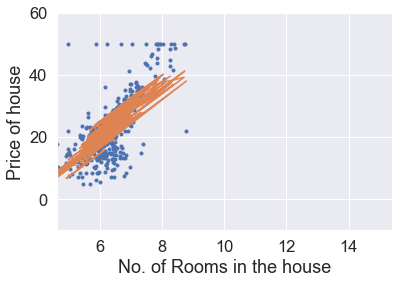

Iteration: 14001,Cost = 19.57503261685425,theta = [-15.16274768   7.44434295 -16.88794333   0.02798948]
theta = [-15.16274768   7.44434295 -16.88794333   0.02798948], dec1: 3.982397950526313e-05, dec2: -9.004316920799564e-06


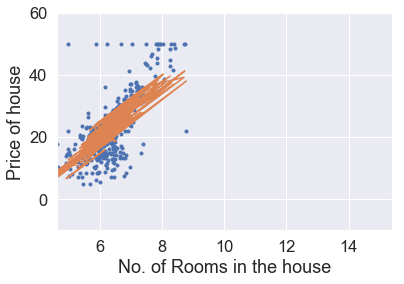

Iteration: 15001,Cost = 19.57260365173147,theta = [-15.20223758   7.45325816 -16.91604934   0.02784747]
theta = [-15.20223758   7.45325816 -16.91604934   0.02784747], dec1: 3.915876045774578e-05, dec2: -8.826900698123849e-06


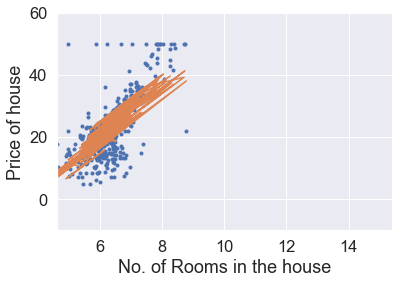

Iteration: 16001,Cost = 19.570271395115682,theta = [-15.24106902   7.46199783 -16.94339735   0.02770876]
theta = [-15.24106902   7.46199783 -16.94339735   0.02770876], dec1: 3.850697650770249e-05, dec2: -8.653236553463419e-06


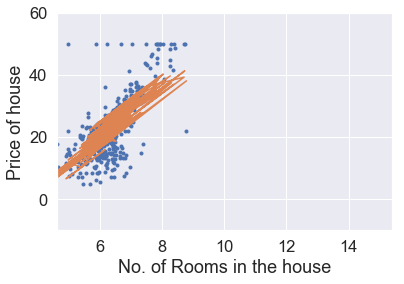

Iteration: 17001,Cost = 19.568031780093293,theta = [-15.27925527   7.47056568 -16.9700045    0.0275733 ]
theta = [-15.27925527   7.47056568 -16.9700045    0.0275733 ], dec1: 3.786834178487697e-05, dec2: -8.483243777303108e-06


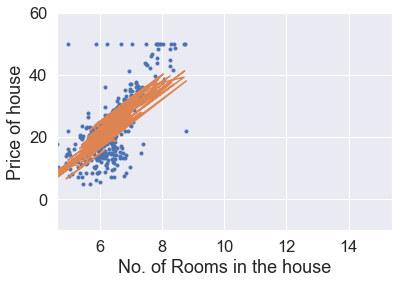

Iteration: 18001,Cost = 19.565880913019825,theta = [-15.31680936   7.47896535 -16.9958875    0.02744101]
theta = [-15.31680936   7.47896535 -16.9958875    0.02744101], dec1: 3.7242576576909874e-05, dec2: -8.316843402662081e-06


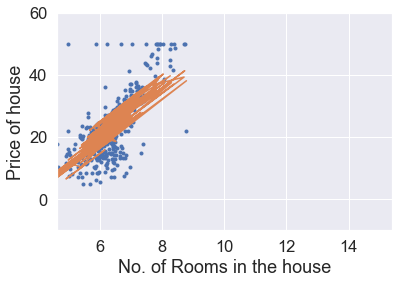

Iteration: 19001,Cost = 19.563815066115925,theta = [-15.35374401   7.48720038 -17.02106274   0.02731182]
theta = [-15.35374401   7.48720038 -17.02106274   0.02731182], dec1: 3.662940719625419e-05, dec2: -8.153958167852188e-06


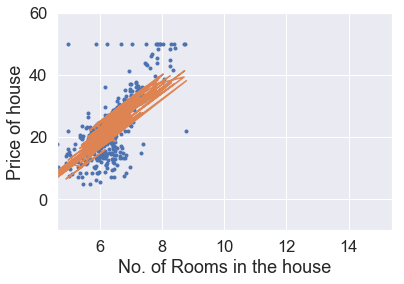

Iteration: 20001,Cost = 19.56183067037989,theta = [-15.39007168   7.49527425 -17.04554624   0.02718566]
theta = [-15.39007168   7.49527425 -17.04554624   0.02718566], dec1: 3.602856585005588e-05, dec2: -7.994512479531078e-06


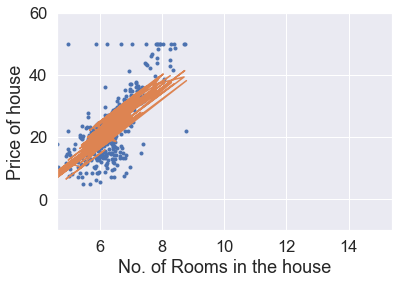

Iteration: 21001,Cost = 19.5599243088033,theta = [-15.42580457   7.50319036 -17.06935366   0.02706247]
theta = [-15.42580457   7.50319036 -17.06935366   0.02706247], dec1: 3.543979051286817e-05, dec2: -7.838432376382641e-06


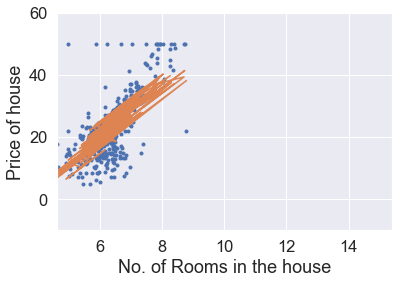

Iteration: 22001,Cost = 19.558092709876707,theta = [-15.46095461   7.51095206 -17.09250032   0.02694218]
theta = [-15.46095461   7.51095206 -17.09250032   0.02694218], dec1: 3.486282480198987e-05, dec2: -7.685645494393073e-06


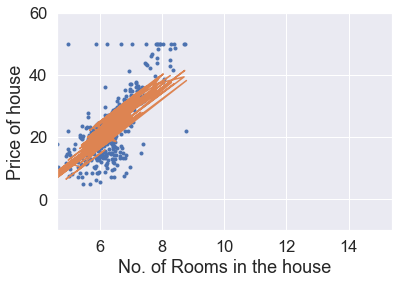

Iteration: 23001,Cost = 19.55633274137308,theta = [-15.4955335    7.51856258 -17.11500122   0.02682472]
theta = [-15.4955335    7.51856258 -17.11500122   0.02682472], dec1: 3.429741785567437e-05, dec2: -7.53608103178367e-06


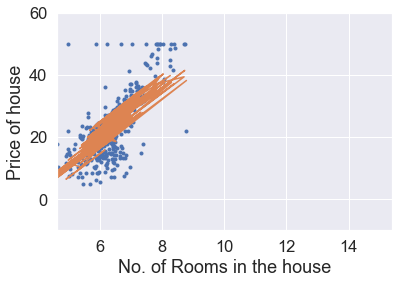

Iteration: 24001,Cost = 19.554641404396985,theta = [-15.52955266   7.52602512 -17.13687101   0.02671004]
theta = [-15.52955266   7.52602512 -17.13687101   0.02671004], dec1: 3.374332421382138e-05, dec2: -7.3896697156057676e-06


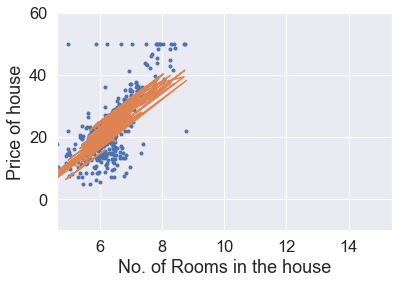

Iteration: 25001,Cost = 19.553015827688295,theta = [-15.56302329   7.5333428  -17.15812405   0.02659807]
theta = [-15.56302329   7.5333428  -17.15812405   0.02659807], dec1: 3.320030370134464e-05, dec2: -7.246343768502388e-06


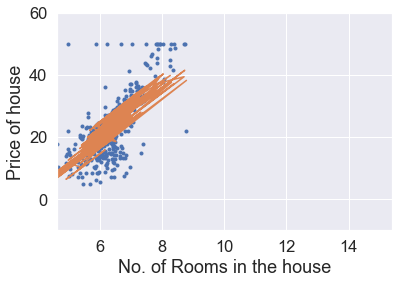

Iteration: 26001,Cost = 19.55145326216937,theta = [-15.59595634   7.54051867 -17.17877435   0.02648875]
theta = [-15.59595634   7.54051867 -17.17877435   0.02648875], dec1: 3.26681213140323e-05, dec2: -7.106036876302104e-06


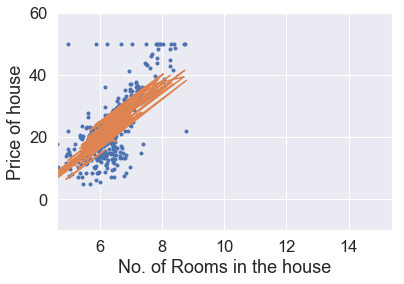

Iteration: 27001,Cost = 19.549951075725485,theta = [-15.62836254   7.54755572 -17.19883565   0.02638203]
theta = [-15.62836254   7.54755572 -17.19883565   0.02638203], dec1: 3.2146547106771725e-05, dec2: -6.96868415700186e-06


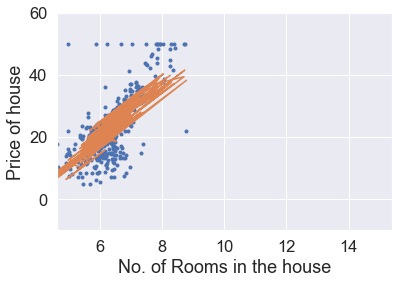

Iteration: 28001,Cost = 19.548506748208364,theta = [-15.66025238   7.55445687 -17.21832135   0.02627785]
theta = [-15.66025238   7.55445687 -17.21832135   0.02627785], dec1: 3.163535608443933e-05, dec2: -6.834222128849713e-06


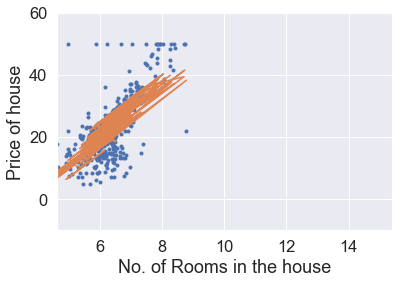

Iteration: 29001,Cost = 19.547117866653387,theta = [-15.69163613   7.56122498 -17.2372446    0.02617615]
theta = [-15.69163613   7.56122498 -17.2372446    0.02617615], dec1: 3.1134328094874433e-05, dec2: -6.7025886808204255e-06


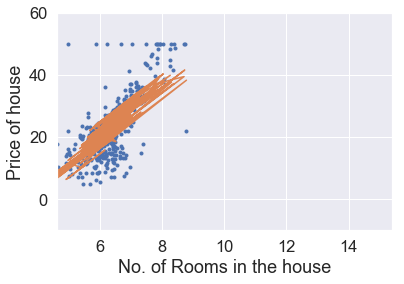

Iteration: 30001,Cost = 19.545782120701254,theta = [-15.72252385   7.56786284 -17.25561824   0.02607687]
theta = [-15.72252385   7.56786284 -17.25561824   0.02607687], dec1: 3.064324772430601e-05, dec2: -6.573723042862299e-06


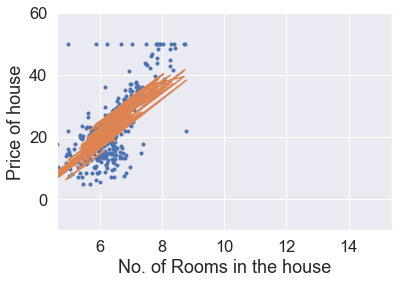

Iteration: 31001,Cost = 19.54449729821547,theta = [-15.75292539   7.5743732  -17.27345482   0.02597997]
theta = [-15.75292539   7.5743732  -17.27345482   0.02597997], dec1: 3.0161904195064994e-05, dec2: -6.447565756646421e-06


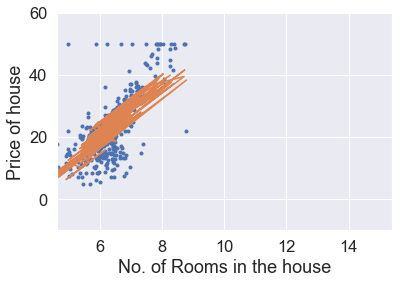

Iteration: 32001,Cost = 19.54326128108714,theta = [-15.78285036   7.58075873 -17.29076662   0.02588539]
theta = [-15.78285036   7.58075873 -17.29076662   0.02588539], dec1: 2.969009126542154e-05, dec2: -6.32405864744466e-06


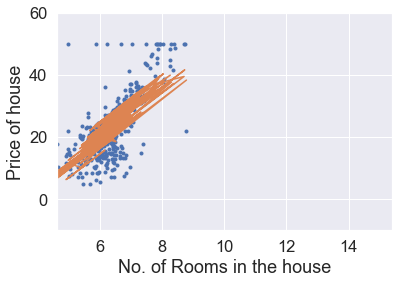

Iteration: 33001,Cost = 19.542072041219157,theta = [-15.81230821   7.58702206 -17.30756568   0.02579308]
theta = [-15.81230821   7.58702206 -17.30756568   0.02579308], dec1: 2.9227607131620918e-05, dec2: -6.2031447964440115e-06


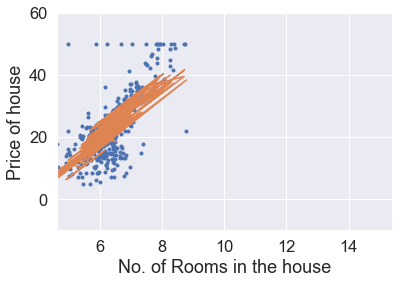

Iteration: 34001,Cost = 19.540927636682095,theta = [-15.84130816   7.59316574 -17.32386373   0.02570298]
theta = [-15.84130816   7.59316574 -17.32386373   0.02570298], dec1: 2.877425433209343e-05, dec2: -6.084768513292344e-06


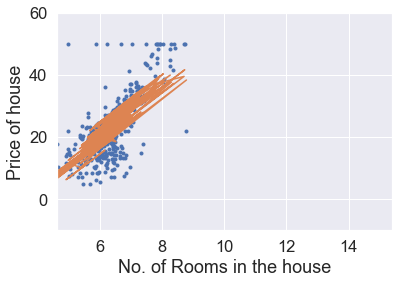

Iteration: 35001,Cost = 19.539826208034466,theta = [-15.86985925   7.5991923  -17.33967228   0.02561506]
theta = [-15.86985925   7.5991923  -17.33967228   0.02561506], dec1: 2.832983965360763e-05, dec2: -5.968875310010194e-06


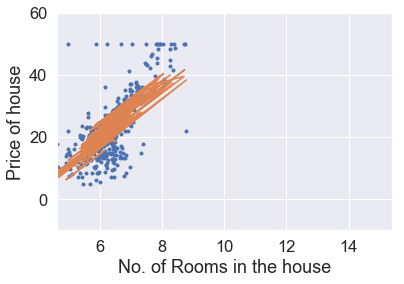

Iteration: 36001,Cost = 19.538765974800242,theta = [-15.89797032   7.60510419 -17.35500258   0.02552926]
theta = [-15.89797032   7.60510419 -17.35500258   0.02552926], dec1: 2.7894174039614057e-05, dec2: -5.855411874483752e-06


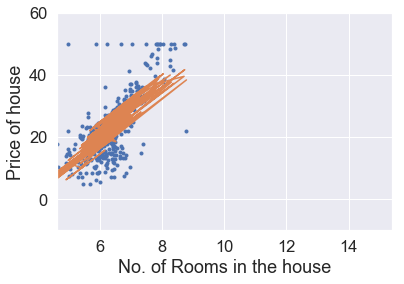

Iteration: 37001,Cost = 19.53774523209706,theta = [-15.92565002   7.61090381 -17.36986561   0.02544554]
theta = [-15.92565002   7.61090381 -17.36986561   0.02544554], dec1: 2.7467072500409135e-05, dec2: -5.744326045522069e-06


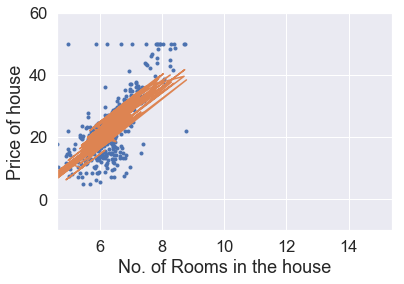

Iteration: 38001,Cost = 19.536762347408512,theta = [-15.95290684   7.61659351 -17.38427214   0.02536384]
theta = [-15.95290684   7.61659351 -17.38427214   0.02536384], dec1: 2.7048354025360232e-05, dec2: -5.6355667877026035e-06


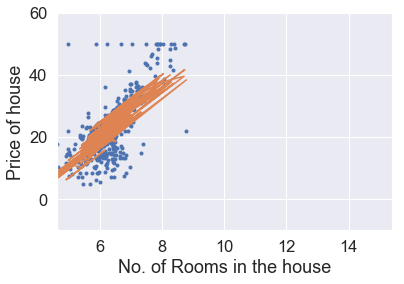

Iteration: 39001,Cost = 19.53581575749447,theta = [-15.97974905   7.62217559 -17.3982327    0.02528413]
theta = [-15.97974905   7.62217559 -17.3982327    0.02528413], dec1: 2.663784149697346e-05, dec2: -5.5290841671078425e-06


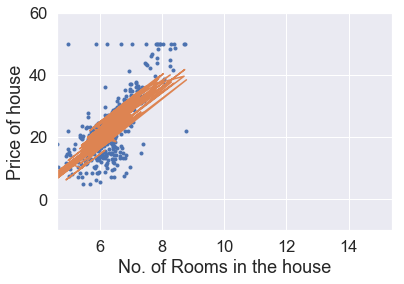

Iteration: 40001,Cost = 19.534903965433482,theta = [-16.00618479   7.62765231 -17.41175756   0.02520636]
theta = [-16.00618479   7.62765231 -17.41175756   0.02520636], dec1: 2.623536160678868e-05, dec2: -5.424829327757978e-06


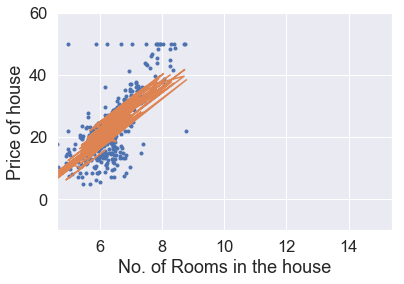

Iteration: 41001,Cost = 19.534025537791603,theta = [-16.032222     7.63302587 -17.4248568    0.02513049]
theta = [-16.032222     7.63302587 -17.4248568    0.02513049], dec1: 2.5840744773228556e-05, dec2: -5.322754467720493e-06


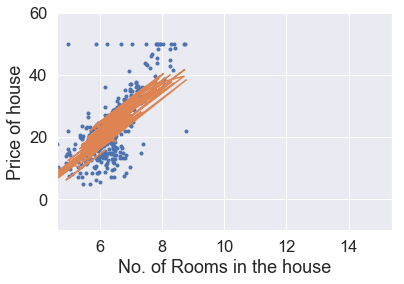

Iteration: 42001,Cost = 19.533179101912285,theta = [-16.05786845   7.63829843 -17.43754027   0.02505647]
theta = [-16.05786845   7.63829843 -17.43754027   0.02505647], dec1: 2.5453825061018422e-05, dec2: -5.222812817022563e-06


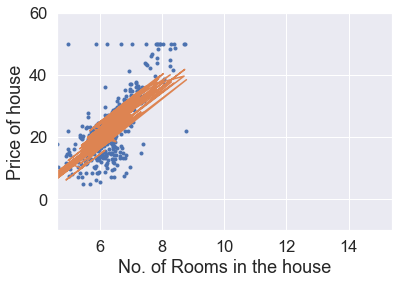

Iteration: 43001,Cost = 19.532363343322103,theta = [-16.08313178   7.6434721  -17.44981758   0.02498427]
theta = [-16.08313178   7.6434721  -17.44981758   0.02498427], dec1: 2.507444010252071e-05, dec2: -5.124958614917279e-06


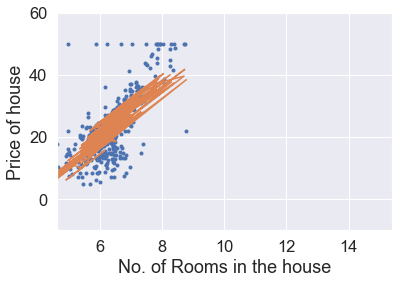

Iteration: 44001,Cost = 19.531577003247417,theta = [-16.10801942   7.64854893 -17.46169816   0.02491384]
theta = [-16.10801942   7.64854893 -17.46169816   0.02491384], dec1: 2.4702431020706375e-05, dec2: -5.029147088085439e-06


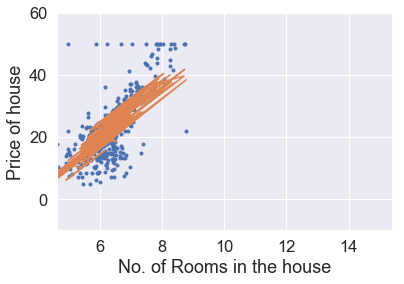

Iteration: 45001,Cost = 19.530818876237124,theta = [-16.13253868   7.65353096 -17.47319122   0.02484515]
theta = [-16.13253868   7.65353096 -17.47319122   0.02484515], dec1: 2.4337642353720678e-05, dec2: -4.935334429705478e-06


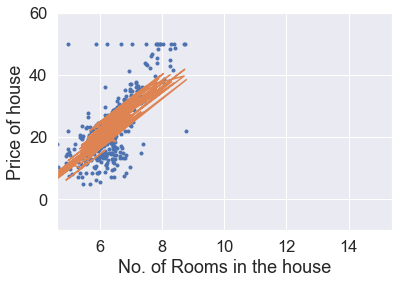

Iteration: 46001,Cost = 19.53008780788712,theta = [-16.1566967    7.65842016 -17.48430578   0.02477815]
theta = [-16.1566967    7.65842016 -17.48430578   0.02477815], dec1: 2.39799219812443e-05, dec2: -4.843477777987785e-06


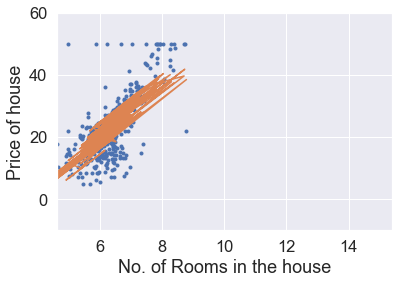

Iteration: 47001,Cost = 19.52938269266198,theta = [-16.18050047   7.66321847 -17.49505063   0.02471281]
theta = [-16.18050047   7.66321847 -17.49505063   0.02471281], dec1: 2.3629121052282846e-05, dec2: -4.75353519614559e-06


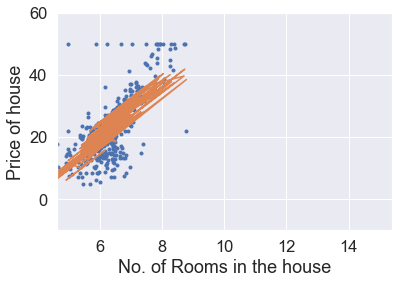

Iteration: 48001,Cost = 19.52870247180978,theta = [-16.20395685   7.66792777 -17.50543439   0.0246491 ]
theta = [-16.20395685   7.66792777 -17.50543439   0.0246491 ], dec1: 2.32850939146128e-05, dec2: -4.665465652238698e-06


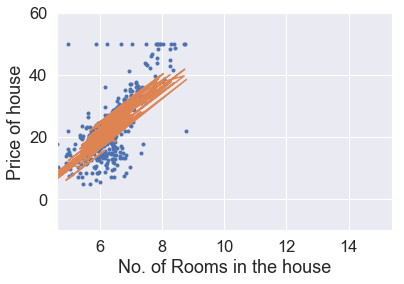

Iteration: 49001,Cost = 19.52804613136603,theta = [-16.22707253   7.67254992 -17.51546551   0.02458696]
theta = [-16.22707253   7.67254992 -17.51546551   0.02458696], dec1: 2.2947698045683416e-05, dec2: -4.579228999862449e-06


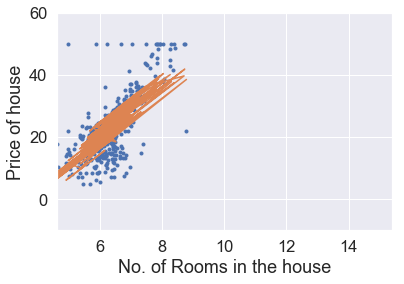

Iteration: 50001,Cost = 19.527412700242934,theta = [-16.24985408   7.67708674 -17.52515221   0.02452638]
theta = [-16.24985408   7.67708674 -17.52515221   0.02452638], dec1: 2.261679398510038e-05, dec2: -4.4947859587140156e-06


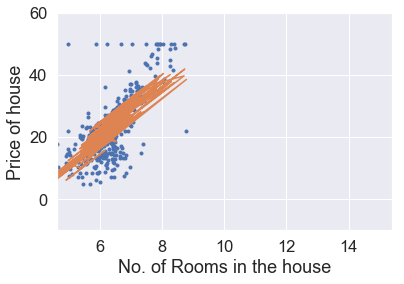

Iteration: 51001,Cost = 19.526801248400364,theta = [-16.27230791   7.68153999 -17.53450256   0.02446732]
theta = [-16.27230791   7.68153999 -17.53450256   0.02446732], dec1: 2.229224526852877e-05, dec2: -4.412098095796771e-06


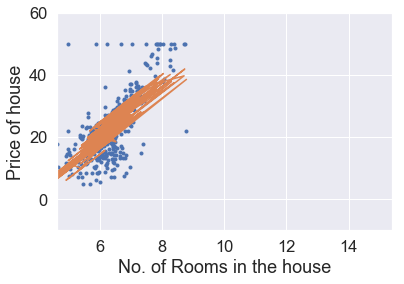

Iteration: 52001,Cost = 19.526210885094955,theta = [-16.29444032   7.68591143 -17.54352444   0.02440973]
theta = [-16.29444032   7.68591143 -17.54352444   0.02440973], dec1: 2.197391836292897e-05, dec2: -4.331127807686945e-06


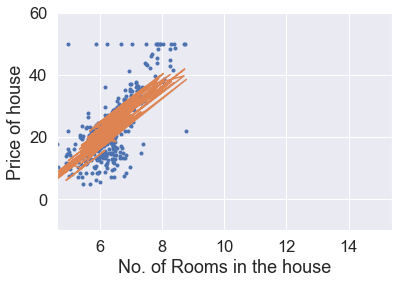

Iteration: 53001,Cost = 19.52564075720406,theta = [-16.31625746   7.69020273 -17.55222557   0.0243536 ]
theta = [-16.31625746   7.69020273 -17.55222557   0.0243536 ], dec1: 2.1661682603376097e-05, dec2: -4.251838301969414e-06


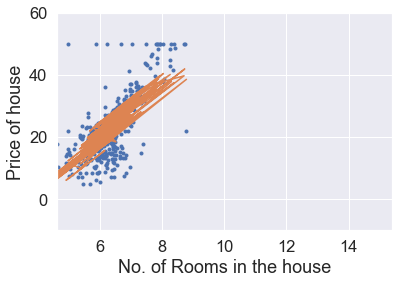

Iteration: 54001,Cost = 19.525090047621358,theta = [-16.33776536   7.69441557 -17.56061349   0.02429888]
theta = [-16.33776536   7.69441557 -17.56061349   0.02429888], dec1: 2.1355410131112924e-05, dec2: -4.1741935799460734e-06


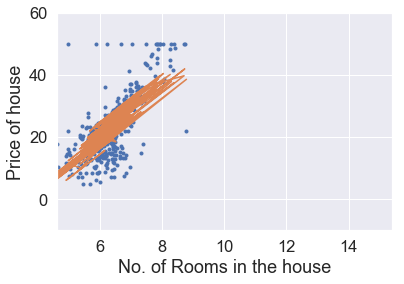

Iteration: 55001,Cost = 19.524557973721045,theta = [-16.35896992   7.69855158 -17.56869557   0.02424555]
theta = [-16.35896992   7.69855158 -17.56869557   0.02424555], dec1: 2.1054975832943516e-05, dec2: -4.09815841966818e-06


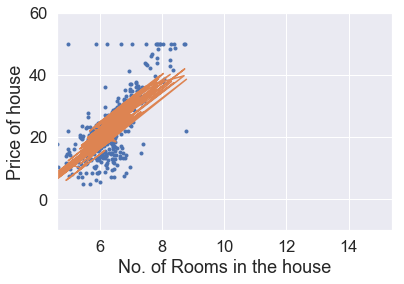

Iteration: 56001,Cost = 19.524043785887585,theta = [-16.37987692   7.70261234 -17.57647903   0.02419357]
theta = [-16.37987692   7.70261234 -17.57647903   0.02419357], dec1: 2.076025728200378e-05, dec2: -4.023698358958826e-06


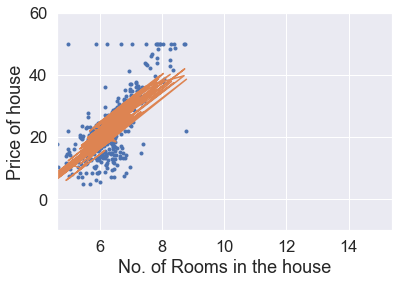

Iteration: 57001,Cost = 19.52354676610843,theta = [-16.40049201   7.70659941 -17.58397092   0.02414291]
theta = [-16.40049201   7.70659941 -17.58397092   0.02414291], dec1: 2.0471134679783992e-05, dec2: -3.950779678932838e-06


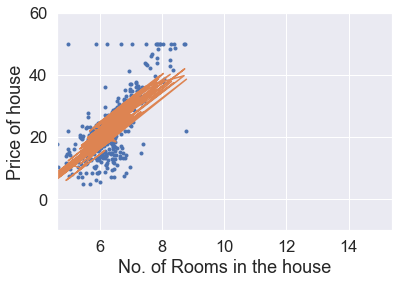

Iteration: 58001,Cost = 19.523066226626764,theta = [-16.42082073   7.71051433 -17.59117814   0.02409355]
theta = [-16.42082073   7.71051433 -17.59117814   0.02409355], dec1: 2.018749079938681e-05, dec2: -3.87936938802355e-06


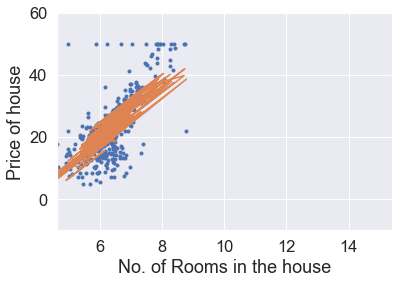

Iteration: 59001,Cost = 19.52260150865187,theta = [-16.4408685    7.71435857 -17.59810743   0.02404546]
theta = [-16.4408685    7.71435857 -17.59810743   0.02404546], dec1: 1.9909210929976324e-05, dec2: -3.809435206528588e-06


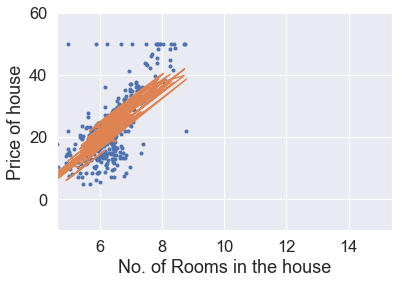

Iteration: 60001,Cost = 19.52215198112466,theta = [-16.46064063   7.71813361 -17.6047654    0.0239986 ]
theta = [-16.46064063   7.71813361 -17.6047654    0.0239986 ], dec1: 1.9636182822545232e-05, dec2: -3.7409455508114397e-06


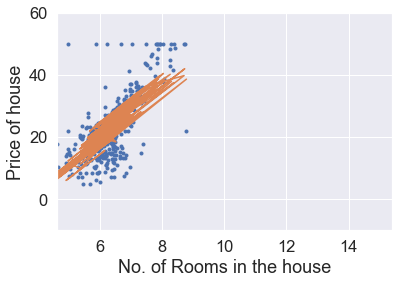

Iteration: 61001,Cost = 19.521717039535858,theta = [-16.48014231   7.72184087 -17.61115849   0.02395295]
theta = [-16.48014231   7.72184087 -17.61115849   0.02395295], dec1: 1.9368296636779185e-05, dec2: -3.6738695182426676e-06


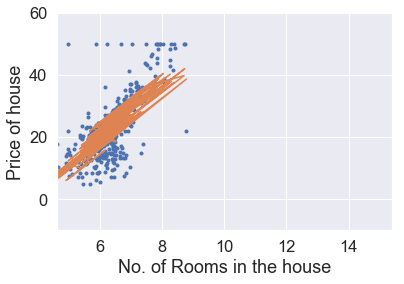

Iteration: 62001,Cost = 19.521296104794768,theta = [-16.49937863   7.72548174 -17.61729303   0.02390848]
theta = [-16.49937863   7.72548174 -17.61729303   0.02390848], dec1: 1.910544488901015e-05, dec2: -3.60817687291581e-06


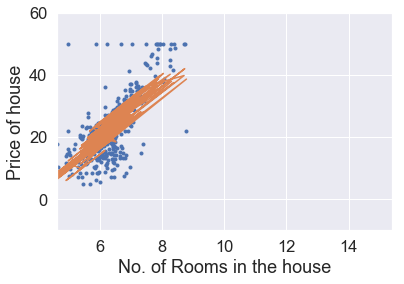

Iteration: 63001,Cost = 19.520888622146373,theta = [-16.51835458   7.72905761 -17.62317517   0.02386517]
theta = [-16.51835458   7.72905761 -17.62317517   0.02386517], dec1: 1.884752240137429e-05, dec2: -3.5438380310995084e-06


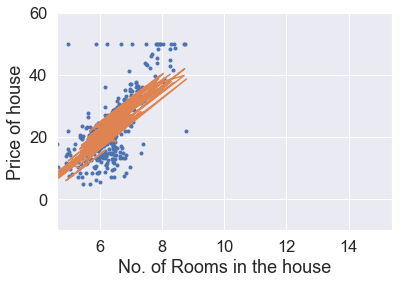

Iteration: 64001,Cost = 19.520494060134663,theta = [-16.53707503   7.7325698  -17.62881095   0.02382299]
theta = [-16.53707503   7.7325698  -17.62881095   0.02382299], dec1: 1.8594426252125978e-05, dec2: -3.48082404669638e-06


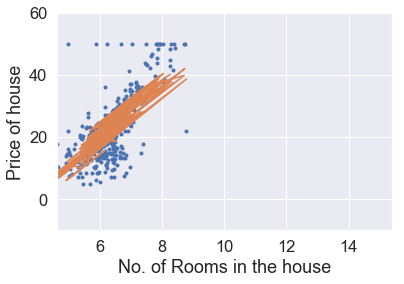

Iteration: 65001,Cost = 19.52011190961029,theta = [-16.55554476   7.73601963 -17.63420628   0.02378191]
theta = [-16.55554476   7.73601963 -17.63420628   0.02378191], dec1: 1.8346055726840033e-05, dec2: -3.41910659815375e-06


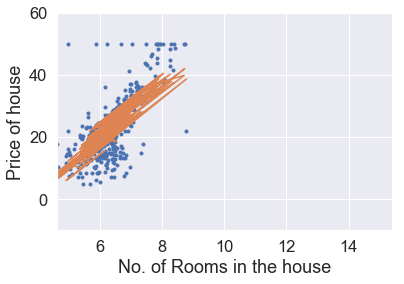

Iteration: 66001,Cost = 19.519741682780634,theta = [-16.57376844   7.73940837 -17.63936693   0.02374192]
theta = [-16.57376844   7.73940837 -17.63936693   0.02374192], dec1: 1.8102312270892196e-05, dec2: -3.358657974252799e-06


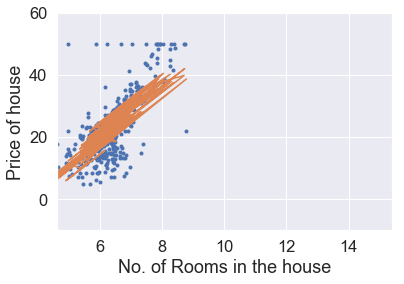

Iteration: 67001,Cost = 19.519382912300426,theta = [-16.59175065   7.7427373  -17.64429854   0.02370298]
theta = [-16.59175065   7.7427373  -17.64429854   0.02370298], dec1: 1.7863099442718943e-05, dec2: -3.2994510617760107e-06


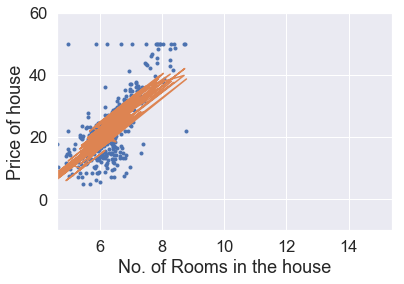

Iteration: 68001,Cost = 19.519035150401294,theta = [-16.60949588   7.74600762 -17.64900662   0.02366507]
theta = [-16.60949588   7.74600762 -17.64900662   0.02366507], dec1: 1.762832286835394e-05, dec2: -3.2414593317452244e-06


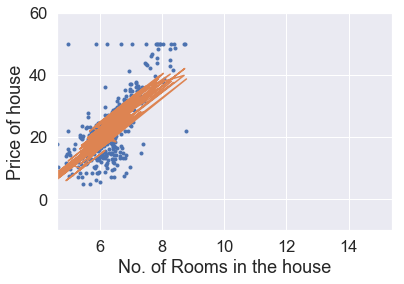

Iteration: 69001,Cost = 19.518697968058362,theta = [-16.62700851   7.74922055 -17.65349658   0.02362816]
theta = [-16.62700851   7.74922055 -17.65349658   0.02362816], dec1: 1.7397890196738944e-05, dec2: -3.1846568272692772e-06


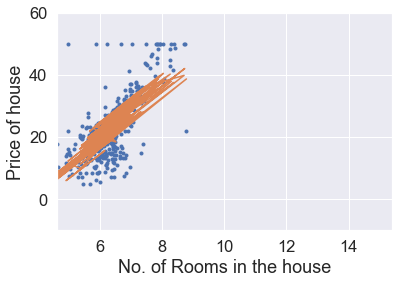

Iteration: 70001,Cost = 19.518370954192626,theta = [-16.64429285   7.75237727 -17.6577737    0.02359225]
theta = [-16.64429285   7.75237727 -17.6577737    0.02359225], dec1: 1.717171105608715e-05, dec2: -3.1290181511417987e-06


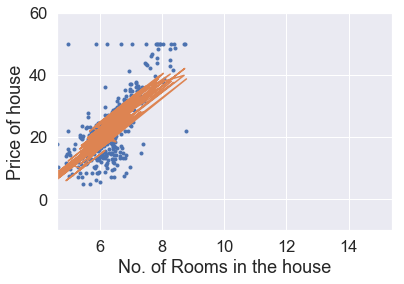

Iteration: 71001,Cost = 19.518053714907268,theta = [-16.6613531    7.75547891 -17.66184313   0.0235573 ]
theta = [-16.6613531    7.75547891 -17.66184313   0.0235573 ], dec1: 1.6949697011201665e-05, dec2: -3.0745184535769686e-06


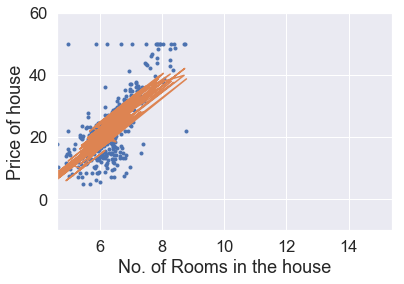

Iteration: 72001,Cost = 19.517745872756667,theta = [-16.67819338   7.75852662 -17.66570992   0.02352329]
theta = [-16.67819338   7.75852662 -17.66570992   0.02352329], dec1: 1.6731761521662935e-05, dec2: -3.0211334205725632e-06


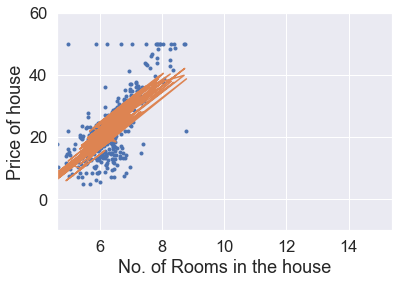

Iteration: 73001,Cost = 19.517447066046593,theta = [-16.69481774   7.76152149 -17.66937901   0.0234902 ]
theta = [-16.69481774   7.76152149 -17.66937901   0.0234902 ], dec1: 1.6517819900959125e-05, dec2: -2.968839262292331e-06


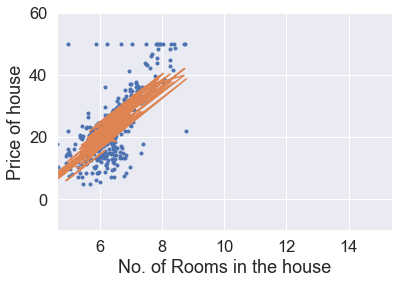

Iteration: 74001,Cost = 19.517156948164363,theta = [-16.71123011   7.7644646  -17.67285522   0.02345801]
theta = [-16.71123011   7.7644646  -17.67285522   0.02345801], dec1: 1.630778927651011e-05, dec2: -2.9176127015944075e-06


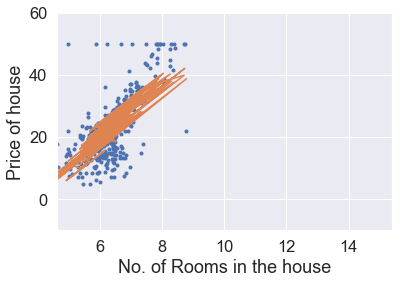

Iteration: 75001,Cost = 19.516875186937504,theta = [-16.72743438   7.76735702 -17.67614327   0.02342669]
theta = [-16.72743438   7.76735702 -17.67614327   0.02342669], dec1: 1.6101588550515114e-05, dec2: -2.8674309631110855e-06


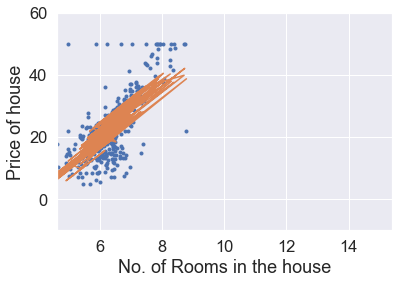

Iteration: 76001,Cost = 19.516601464019907,theta = [-16.74343434   7.77019976 -17.67924777   0.02339624]
theta = [-16.74343434   7.77019976 -17.67924777   0.02339624], dec1: 1.589913836166517e-05, dec2: -2.8182717623892523e-06


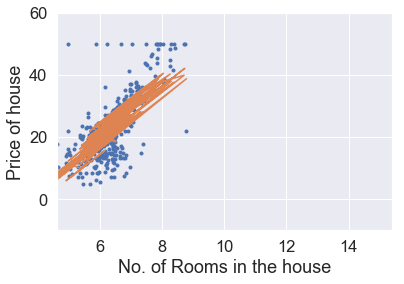

Iteration: 77001,Cost = 19.516335474304142,theta = [-16.75923368   7.77299384 -17.68217323   0.02336663]
theta = [-16.75923368   7.77299384 -17.68217323   0.02336663], dec1: 1.5700361047683364e-05, dec2: -2.7701132952981908e-06


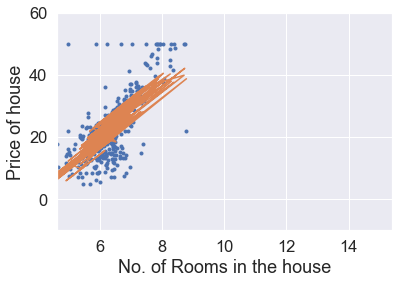

Iteration: 78001,Cost = 19.516076925358913,theta = [-16.77483606   7.77574026 -17.68492407   0.02333784]
theta = [-16.77483606   7.77574026 -17.68492407   0.02333784], dec1: 1.550518060870865e-05, dec2: -2.7229342274549062e-06


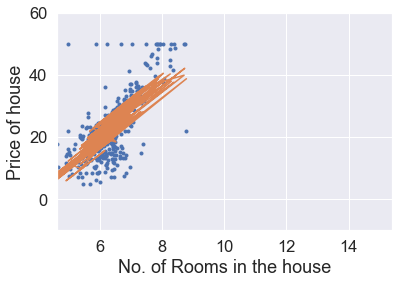

Iteration: 79001,Cost = 19.51582553689045,theta = [-16.79024503   7.77843999 -17.6875046    0.02330985]
theta = [-16.79024503   7.77843999 -17.6875046    0.02330985], dec1: 1.531352267138456e-05, dec2: -2.6767136843890916e-06


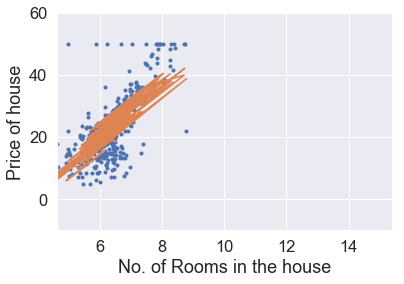

Iteration: 80001,Cost = 19.515581040227044,theta = [-16.80546407   7.78109396 -17.68991904   0.02328265]
theta = [-16.80546407   7.78109396 -17.68991904   0.02328265], dec1: 1.5125314453815082e-05, dec2: -2.631431241393545e-06


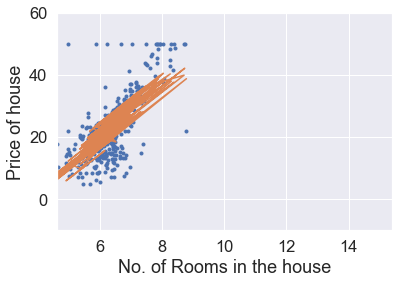

Iteration: 81001,Cost = 19.515343177825475,theta = [-16.8204966    7.78370311 -17.69217151   0.02325621]
theta = [-16.8204966    7.78370311 -17.69217151   0.02325621], dec1: 1.4940484731217397e-05, dec2: -2.5870669139398728e-06


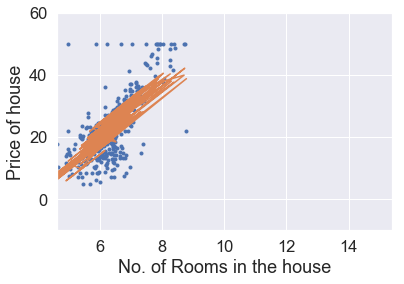

Iteration: 82001,Cost = 19.515111702798553,theta = [-16.83534596   7.78626835 -17.69426603   0.02323052]
theta = [-16.83534596   7.78626835 -17.69426603   0.02323052], dec1: 1.475896380237598e-05, dec2: -2.543601147918049e-06


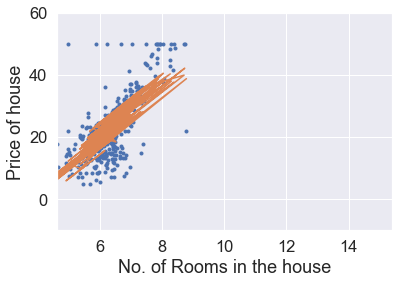

Iteration: 83001,Cost = 19.514886378462826,theta = [-16.85001542   7.78879056 -17.69620657   0.02320557]
theta = [-16.85001542   7.78879056 -17.69620657   0.02320557], dec1: 1.4580683456732745e-05, dec2: -2.5010148106969468e-06


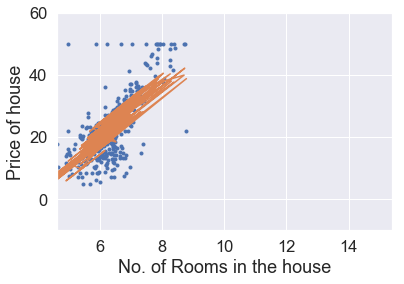

Iteration: 84001,Cost = 19.514666977905634,theta = [-16.8645082    7.79127062 -17.69799695   0.02318132]
theta = [-16.8645082    7.79127062 -17.69799695   0.02318132], dec1: 1.4405576942303872e-05, dec2: -2.4592891815777857e-06


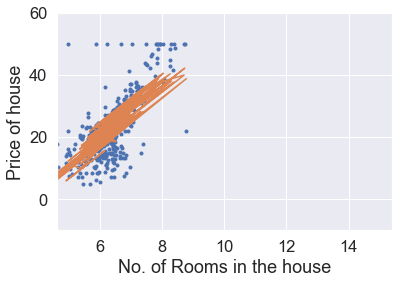

Iteration: 85001,Cost = 19.5144532835706,theta = [-16.87882744   7.79370938 -17.69964097   0.02315778]
theta = [-16.87882744   7.79370938 -17.69964097   0.02315778], dec1: 1.423357893410655e-05, dec2: -2.418405943677434e-06


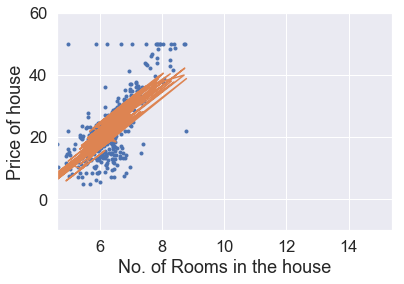

Iteration: 86001,Cost = 19.51424508686084,theta = [-16.89297621   7.79610767 -17.7011423    0.02313492]
theta = [-16.89297621   7.79610767 -17.7011423    0.02313492], dec1: 1.406462550354076e-05, dec2: -2.3783471742250338e-06


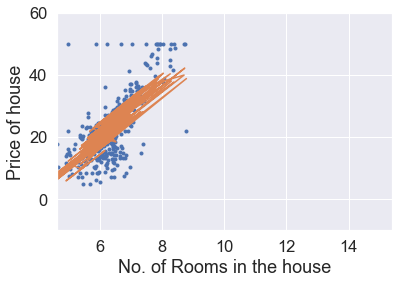

Iteration: 87001,Cost = 19.51404218775908,theta = [-16.90695752   7.7984663  -17.70250454   0.02311273]
theta = [-16.90695752   7.7984663  -17.70250454   0.02311273], dec1: 1.3898654088193059e-05, dec2: -2.339095336601675e-06


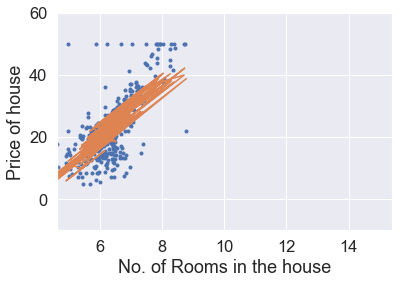

Iteration: 88001,Cost = 19.513844394464066,theta = [-16.92077432   7.80078608 -17.70373122   0.02309119]
theta = [-16.92077432   7.80078608 -17.70373122   0.02309119], dec1: 1.3735603462366705e-05, dec2: -2.3006332720668703e-06


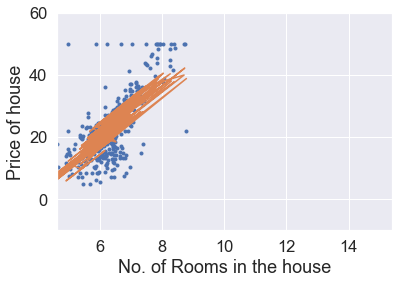

Iteration: 89001,Cost = 19.513651523042398,theta = [-16.93442952   7.80306779 -17.70482577   0.02307028]
theta = [-16.93442952   7.80306779 -17.70482577   0.02307028], dec1: 1.3575413708336125e-05, dec2: -2.2629441911232986e-06


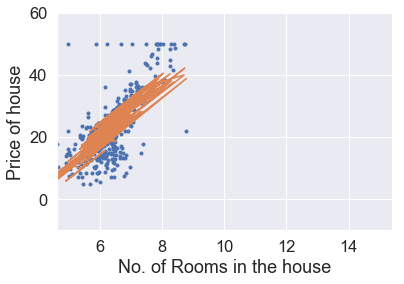

Iteration: 90001,Cost = 19.51346339709526,theta = [-16.94792593   7.80531219 -17.70579157   0.02305   ]
theta = [-16.94792593   7.80531219 -17.70579157   0.02305   ], dec1: 1.3418026188028943e-05, dec2: -2.2260116662803884e-06


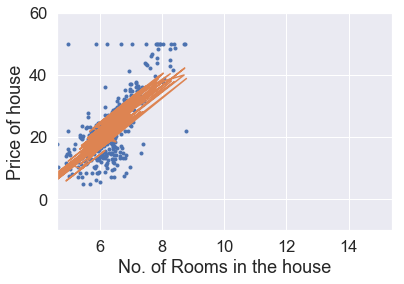

Iteration: 91001,Cost = 19.513279847439424,theta = [-16.96126633   7.80752002 -17.70663191   0.02303033]
theta = [-16.96126633   7.80752002 -17.70663191   0.02303033], dec1: 1.326338351554147e-05, dec2: -2.189819623586675e-06


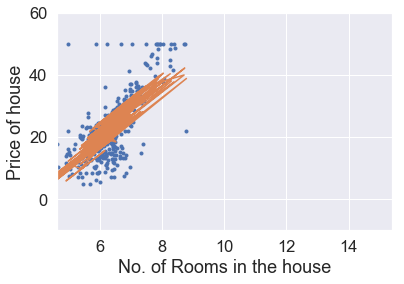

Iteration: 92001,Cost = 19.51310071180176,theta = [-16.97445344   7.80969203 -17.70735      0.02301125]
theta = [-16.97445344   7.80969203 -17.70735      0.02301125], dec1: 1.311142953012734e-05, dec2: -2.1543523350981547e-06


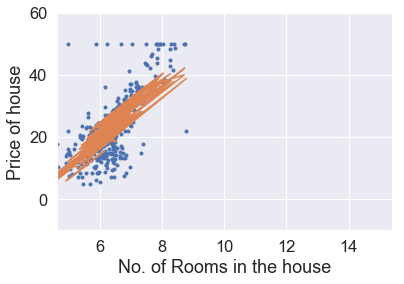

Iteration: 93001,Cost = 19.512925834526882,theta = [-16.98748991   7.81182893 -17.70794899   0.02299275]
theta = [-16.98748991   7.81182893 -17.70794899   0.02299275], dec1: 1.2962109269739433e-05, dec2: -2.1195944117029854e-06


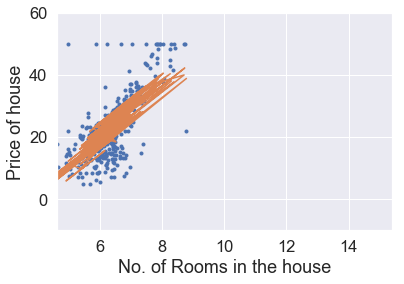

Iteration: 94001,Cost = 19.512755066297213,theta = [-17.00037837   7.81393142 -17.70843196   0.02297482]
theta = [-17.00037837   7.81393142 -17.70843196   0.02297482], dec1: 1.2815368945257344e-05, dec2: -2.0855307953939277e-06


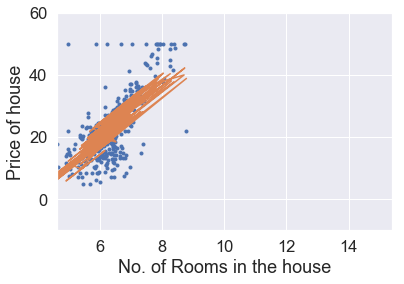

Iteration: 95001,Cost = 19.51258826386499,theta = [-17.01312135   7.81600018 -17.70880191   0.02295745]
theta = [-17.01312135   7.81600018 -17.70880191   0.02295745], dec1: 1.2671155915050776e-05, dec2: -2.052146753057357e-06


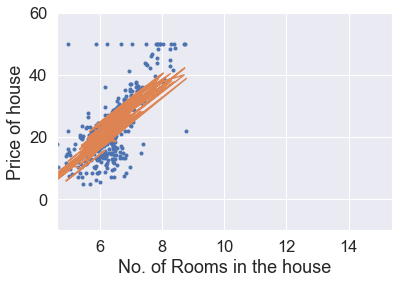

Iteration: 96001,Cost = 19.512425289795758,theta = [-17.02572136   7.8180359  -17.70906178   0.02294061]
theta = [-17.02572136   7.8180359  -17.70906178   0.02294061], dec1: 1.2529418660547619e-05, dec2: -2.019427867598503e-06


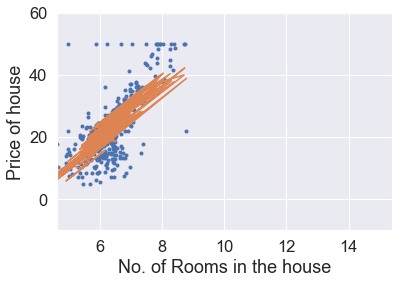

Iteration: 97001,Cost = 19.512266012222703,theta = [-17.03818085   7.82003922 -17.70921444   0.02292431]
theta = [-17.03818085   7.82003922 -17.70921444   0.02292431], dec1: 1.2390106761709038e-05, dec2: -1.9873600331104294e-06


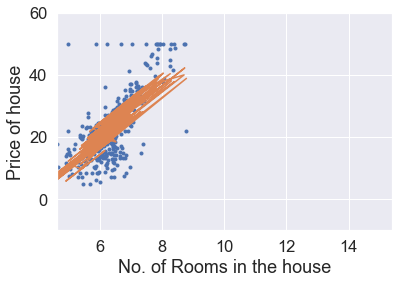

Iteration: 98001,Cost = 19.512110304611564,theta = [-17.05050223   7.8220108  -17.7092627    0.02290852]
theta = [-17.05050223   7.8220108  -17.7092627    0.02290852], dec1: 1.2253170873500736e-05, dec2: -1.9559294472246657e-06


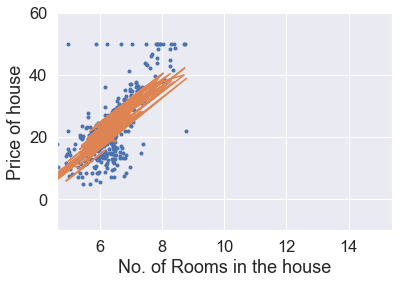

Iteration: 99001,Cost = 19.511958045535525,theta = [-17.06268784   7.82395126 -17.70920931   0.02289323]
theta = [-17.06268784   7.82395126 -17.70920931   0.02289323], dec1: 1.2118562702776782e-05, dec2: -1.925122604252249e-06


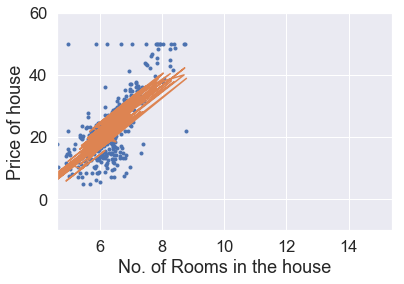

theta0 = 100000
theta1 = 100000
Costs = 100000


In [90]:
gradientDescentLinearRegression3(alpha=0.001, iter=100000)

In [91]:
# моя реализация

In [186]:
n = 1000
thetas = [.034, -2]
x = np.column_stack([np.ones(n), np.random.rand(n) * 2 - 1])
noise = (np.random.rand(n) * 2 - 1) / 100
_y = (thetas * x).sum(axis=1)
y = _y + noise

In [187]:
y[0], x[0, 0] * thetas[0] + x[0, 1] * thetas[1]

(-1.7688452606096357, -1.7734090809620022)

In [188]:
y.mean(), _y.mean()

(0.052069866180134115, 0.051775271995032117)

In [ ]:
def derevative1(y, theta1):
    return 2(y - theta1)
    
def derevative2():
    return 

In [139]:
from sklearn.metrics import mean_squared_error

def gradient_descent(x, y, lr=0.001, niters=100000):

    dthetas = np.zeros(x.shape[1])
    
    for iteration in range(niters):
        pred = np.dot(x, dthetas)
        for i in range(x.shape[1]):
            dthetas[i] -=  lr * ((pred - y) * x[:, i]).mean()
        J = mean_squared_error(np.dot(x, dthetas), y)

        if iteration % 1000==0:
            print("Iteration: {},Cost = {},theta = {}".format(iteration + 1, J, dthetas))
#             print('theta = {}, dec1: {}, dec2: {}'.format(theta, 
#                                                           alpha *(pred - Y).mean(), 
#                                                           alpha *((pred - Y)* x[:,1]).mean())
#                  )
#             fabline(x,theta,Y)
#     print('theta0 = {}\ntheta1 = {}\nCosts = {}'.format(len(theta0), len(theta1), len(costs)))

In [247]:
y = 6
x = 3

f_teta = lambda teta: (y - teta * x) ** 2

tetas = (np.random.rand(100) * 2) + 1
tetas_f = np.array([f_teta(teta) for teta in tetas])

In [244]:
tetas.shape, tetas_f.shape

((100,), (100,))

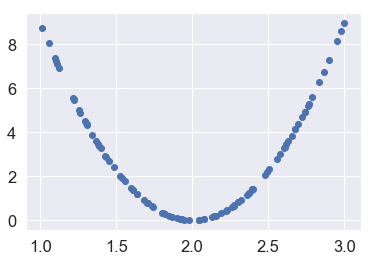

In [245]:
plt.scatter(tetas, tetas_f)

In [291]:
# d_teta = lambda teta: 2*(y - x * teta)
d_teta = lambda teta: 2 * x ** 2 * teta - 2 * x * y
y, x, d_teta(2.5)

(6, 3, 9.0)

In [292]:
n_iters = 10000
lr = 0.0001
new_teta1 = 0

for i in range(n_iters):
    new_teta = new_teta - lr * d_teta(new_teta)
print(i, new_teta)

9999 1.9999999700300992


In [314]:
# y = kx + b
# 10 == 2 * 3 + 4
y = 10
x = 3

d_k = lambda y, x, b, k: -2 * y * x + 2 * x ** 2 * k + 2 * x * b
d_b = lambda y, x, b, k: -2 * y + 2 * k * x + 2 * b 

# d_k = lambda y, x, b, k: (k * x + b - y) * x
# d_b = lambda y, x, b, k: (k * x + b - y)

lr = 0.01
k0, b0 = 5, 5

n_iters = 1000000
for i in range(n_iters):
    
    k1 = k0 - lr * d_k(y, x, b0, k0)
    b1 = b0 - lr * d_b(y, x, b0, k0)
    
    k0, b0 = k1, b1
    
print(i, k0, b0)

999999 2.0000000000000018 3.999999999999997


In [346]:
k, b = 2, 4
x = np.array(list(range(100)))
y = k * (x + np.random.rand(1) / 100)  + b + np.random.rand(1)

In [347]:
x, y

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
 array([   4.19681912,    6.19681912,    8.19681912,   10.19681912,
          12.19681912,   14.19681912,   16.19681912,   18.19681912,
          20.19681912,   22.19681912,   24.19681912,   26.19681912,
          28.19681912,   30.19681912,   32.19681912,   34.19681912,
          36.19681912,   38.19681912,   40.19681912,   42.19681912,
          44.19681912,   46.19681912,   48.19681912,   50.19681912,
          52.19681912,   54.19681912,   56.19681912,   58.19681912,
          60.19681912,   62.19681912,   64.19681912,   66.19681912,
      

In [348]:
d_k = lambda y, x, b, k: -2 * y * x + 2 * x ** 2 * k + 2 * x * b
d_b = lambda y, x, b, k: -2 * y + 2 * k * x + 2 * b 

# d_k = lambda y, x, b, k: (k * x + b - y) * x
# d_b = lambda y, x, b, k: (k * x + b - y)

lr = 0.0003
k0, b0 = 0, 0

n_iters = 100000
for i in range(n_iters):
    
    k1 = k0 - lr * d_k(y, x, b0, k0).mean()
    b1 = b0 - lr * d_b(y, x, b0, k0).mean()
    
    k0, b0 = k1, b1
    
print(i, k0, b0)

99999 2.00000001536 4.19681809916


In [7]:
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set() 
import numpy as np

## Simple Linear Regression

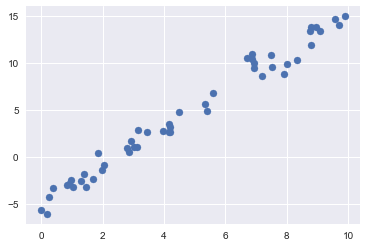

In [8]:
# y = ax + b
rng = np.random.RandomState(1)
x = 10 * rng.rand(50)
y = 2 * x - 5 + rng.randn(50) 
plt.scatter(x, y);

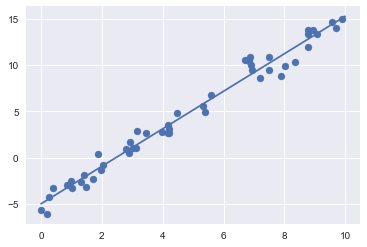

In [9]:
from sklearn.linear_model import LinearRegression 
model = LinearRegression(fit_intercept=True)

model.fit(x[:, np.newaxis], y)

xfit = np.linspace(0, 10, 1000)
yfit = model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)
plt.plot(xfit, yfit);

In [10]:
# наклон и смещение
print("Model slope: ", model.coef_[0]) 
print("Model intercept:", model.intercept_)

Model slope:  2.027208810360695
Model intercept: -4.998577085553202


In [11]:
# y = a0 +a1x1 +a2x2 +⋯
rng = np.random.RandomState(1)
X = 10 * rng.rand(100, 3)
y = 0.5 + np.dot(X, [1.5, -2., 1.])

model.fit(X, y) 
print(model.intercept_) 
print(model.coef_)

0.5000000000000144
[ 1.5 -2.   1. ]


In [12]:
# a0 - 0.5000000000000144
# a1, a2, a3 - [ 1.5 -2.   1. ]

в общем случае это будет плоскоть

## Basis Function Regression 

для того чтобы адаптировать линейнеую регрессию к нелинейной функции.
например PolynomialRegression
но мы можем ввсести любую функцию x_n = f_n(x)

и это по прежнему линейная регрессия! the linearity refers to the fact that the coeffi‐ cients an never multiply or divide each other.

Линейность относится к тому факту, что коэффициенты никогда не умножаются и не делятся друг на друга.

In [13]:
from sklearn.preprocessing import PolynomialFeatures 

x = np.array([2, 3, 4])
poly = PolynomialFeatures(3, include_bias=False)
poly.fit_transform(x[:, None])

array([[ 2.,  4.,  8.],
       [ 3.,  9., 27.],
       [ 4., 16., 64.]])

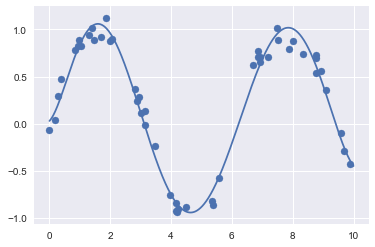

In [14]:
from sklearn.pipeline import make_pipeline 

poly_model = make_pipeline(PolynomialFeatures(7),
                           LinearRegression())

rng = np.random.RandomState(1)
x = 10 * rng.rand(50)
y = np.sin(x) + 0.1 * rng.randn(50)

poly_model.fit(x[:, np.newaxis], y)

yfit = poly_model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)
plt.plot(xfit, yfit);

## Gaussian basis functions 

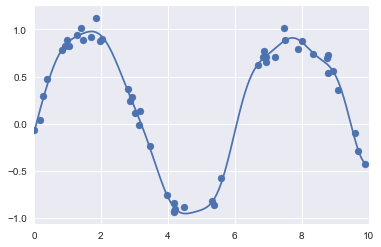

In [15]:
from sklearn.base import BaseEstimator, TransformerMixin

class GaussianFeatures(BaseEstimator, TransformerMixin):
    
    """Uniformly spaced Gaussian features for one-dimensional input"""
    def __init__(self, N, width_factor=2.0): 
        self.N = N
        self.width_factor = width_factor
        
    @staticmethod
    def _gauss_basis(x, y, width, axis=None): 
        arg = (x - y)/width
        return np.exp(-0.5 * np.sum(arg ** 2, axis))
    
    def fit(self, X, y=None):
        # create N centers spread along the data range
        self.centers_ = np.linspace(X.min(), X.max(), self.N)
        self.width_ = self.width_factor * (self.centers_[1] - self.centers_[0])
        return self
    
    def transform(self, X):
        return self._gauss_basis(X[:, :, np.newaxis], self.centers_, self.width_, axis=1)
    
gauss_model = make_pipeline(GaussianFeatures(17),
                            LinearRegression())

gauss_model.fit(x[:, np.newaxis], y)
yfit = gauss_model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)
plt.plot(xfit, yfit)
plt.xlim(0, 10);

# Regularization

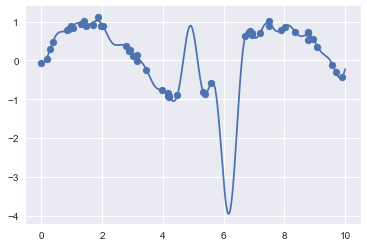

In [16]:
# basis functions это ок, но они могут привести к overfitting
model = make_pipeline(GaussianFeatures(30),
                      LinearRegression())
model.fit(x[:, np.newaxis], y)
plt.scatter(x, y)
plt.plot(xfit, model.predict(xfit[:, np.newaxis]))

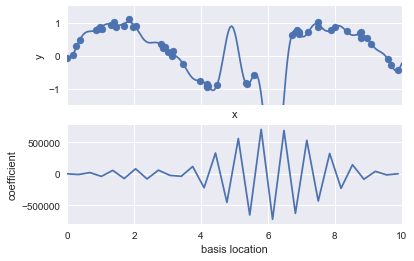

In [20]:
def basis_plot(model, title=None):
    fig, ax = plt.subplots(2, sharex=True)
    model.fit(x[:, np.newaxis], y)
    ax[0].scatter(x, y)
    ax[0].plot(xfit, model.predict(xfit[:, np.newaxis]))
    ax[0].set(xlabel='x', ylabel='y', ylim=(-1.5, 1.5))

    if title: 
        ax[0].set_title(title)
    
    ax[1].plot(model.steps[0][1].centers_,
               model.steps[1][1].coef_)
    
    ax[1].set(xlabel='basis location',
              ylabel='coefficient',
              xlim=(0, 10))
    
model = make_pipeline(GaussianFeatures(30), LinearRegression())
basis_plot(model)

коэффициенты начинают меняться с огромной амплитудой. Это подстройка под данные

## Ridge regression (L2 regularization) / Tikhonov regularization

In [23]:
# штрафуется квадратом коэффициентов умноженным на α 

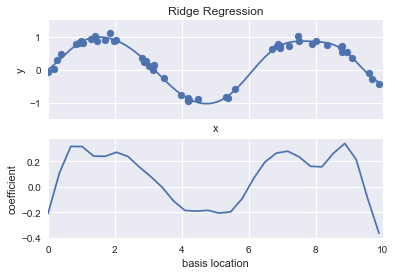

In [40]:
from sklearn.linear_model import Ridge
model = make_pipeline(GaussianFeatures(30), Ridge(alpha=0.1)) 
basis_plot(model, title='Ridge Regression')

## Lasso regularization (L1) 

In [39]:
# лассо - тоже самое, но по модулю, а не квардраты

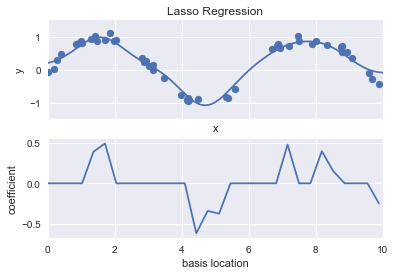

In [43]:
from sklearn.linear_model import Lasso
model = make_pipeline(GaussianFeatures(30), 
                      Lasso(alpha=0.01)) 
basis_plot(model, title='Lasso Regression')

In [44]:
%%html
<img src="imgs/l1_l2.webp">

# в случае l1 большинство коэффициентов будет равно 0

# Example: Predicting Bicycle Traffic

In [49]:
import pandas as pd
counts = pd.read_csv('data/Fremont_Bridge_Hourly_Bicycle_Counts_by_Month_October_2012_to_present.csv', index_col='Date', parse_dates=True) 
weather = pd.read_csv('data/BicycleWeather.csv', index_col='DATE', parse_dates=True)

In [51]:
# compute the total daily bicycle traffic, and put this in its own DataFrame
daily = counts.resample('d').sum()
daily['Total'] = daily.sum(axis=1)
daily = daily[['Total']] # remove other columns

In [52]:
# adding binary columns that indicate the day of the week:
days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'] 
for i in range(7):
    daily[days[i]] = (daily.index.dayofweek == i).astype(float)

In [53]:
from pandas.tseries.holiday import USFederalHolidayCalendar 

cal = USFederalHolidayCalendar()
holidays = cal.holidays('2012', '2016')
daily = daily.join(pd.Series(1, index=holidays, name='holiday'))
daily['holiday'].fillna(0, inplace=True)

# это огонь!

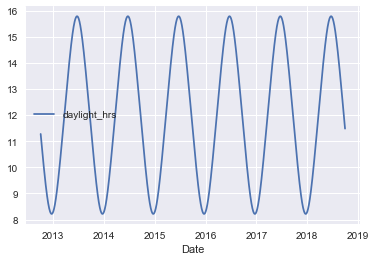

In [54]:
def hours_of_daylight(date, axis=23.44, latitude=47.61): 
    """Compute the hours of daylight for the given date""" 
    days = (date - pd.datetime(2000, 12, 21)).days
    m = (1. - np.tan(np.radians(latitude))
        * np.tan(np.radians(axis) * np.cos(days * 2 * np.pi / 365.25))) 
    
    return 24. * np.degrees(np.arccos(1 - np.clip(m, 0, 2))) / 180.

daily['daylight_hrs'] = list(map(hours_of_daylight, daily.index))
daily[['daylight_hrs']].plot();

In [56]:
# temperatures are in 1/10 deg C; convert to C 
weather['TMIN'] /= 10
weather['TMAX'] /= 10
weather['Temp (C)'] = 0.5 * (weather['TMIN'] + weather['TMAX'])
            
# precip is in 1/10 mm; convert to inches
weather['PRCP'] /= 254
weather['dry day'] = (weather['PRCP'] == 0).astype(int)
daily = daily.join(weather[['PRCP', 'Temp (C)', 'dry day']])

In [58]:
# Finally, let’s add a counter that increases from day 1, 
# and measures how many years have passed. 
# This will let us measure any observed annual increase or decrease in daily crossings:
daily['annual'] = (daily.index - daily.index[0]).days / 365.

In [65]:
daily.head()

,Total,Mon,Tue,Wed,Thu,Fri,Sat,Sun,holiday,daylight_hrs,PRCP,Temp (C),dry day,annual
Date,,,,,,,,,,,,,,
2012-10-03,3521.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,11.277359,0.0,13.35,1.0,0.000000
2012-10-04,3475.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,11.219142,0.0,13.60,1.0,0.002740
2012-10-05,3148.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,11.161038,0.0,15.30,1.0,0.005479
2012-10-06,2006.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,11.103056,0.0,15.85,1.0,0.008219
2012-10-07,2142.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,11.045208,0.0,15.85,1.0,0.010959


With this in place, we can choose the columns to use, and fit a linear regression model to our data. We will set fit_intercept = False, because the daily flags essen‐ tially operate as their own day-specific intercepts:

In [82]:
weather_count = 1064
_daily = daily[:weather_count].copy()
column_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun', 'holiday',
                'daylight_hrs', 'PRCP', 'dry day', 'Temp (C)', 'annual']
X = _daily[column_names]
y = _daily['Total']

model = LinearRegression(fit_intercept=False)    
model.fit(X, y)
_daily['predicted'] = model.predict(X)

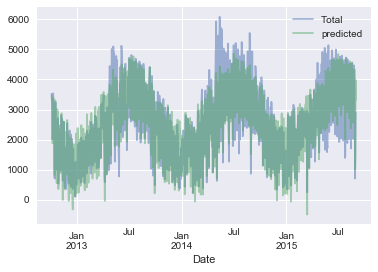

In [84]:
_daily[['Total', 'predicted']].plot(alpha=0.5);

In [87]:
from sklearn.metrics import r2_score 
r2_score(_daily['predicted'], _daily['Total'])

0.8473099127298134

In [88]:
params = pd.Series(model.coef_, index=X.columns)
params

Mon              504.882756
Tue              610.233936
Wed              592.673642
Thu              482.358115
Fri              177.980345
Sat            -1103.301710
Sun            -1133.567246
holiday        -1187.401381
daylight_hrs     128.851511
PRCP            -664.834882
dry day          547.698592
Temp (C)          65.162791
annual            26.942713
dtype: float64

In [91]:
# These numbers are difficult to interpret without some measure of their uncertainty. 
# We can compute these uncertainties quickly using bootstrap resamplings of the data:
from sklearn.utils import resample 
np.random.seed(1)
err = np.std([model.fit(*resample(X, y)).coef_ 
              for i in range(1000)], axis=0)

In [92]:
print(pd.DataFrame({'effect': params.round(0), 'error': err.round(0)}))

              effect  error
Mon            505.0   86.0
Tue            610.0   83.0
Wed            593.0   83.0
Thu            482.0   85.0
Fri            178.0   81.0
Sat          -1103.0   80.0
Sun          -1134.0   83.0
holiday      -1187.0  163.0
daylight_hrs   129.0    9.0
PRCP          -665.0   62.0
dry day        548.0   33.0
Temp (C)        65.0    4.0
annual          27.0   18.0


additional hour of daylight, 129 ± 9 more people choose to ride; a temperature increase of one degree Celsius encourages 65 ± 4 people to grab their bicycle; a dry day means an average of 546 ± 33 more riders; and each inch of precipitation means 665 ± 62 more people leave their bike at home. Once all these effects are accounted for, we see a modest increase of 28 ± 18 new daily riders each year.

# Вывыод такой: в этой модели обсолютно не учитывются нелинейные эффекты

# In-Depth: Support Vector Machines

In [94]:
%matplotlib inline 
import numpy as np
import matplotlib.pyplot as plt 
from scipy import stats
# use Seaborn plotting defaults
import seaborn as sns; sns.set()

байес был генеративным классификатором, он генерировал распределение каждого класса,
а SVM - discriminative classification. Он разделяет классы между собой гиперплоскостью

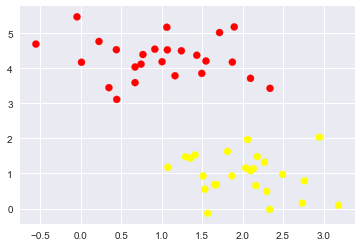

In [95]:
from sklearn.datasets.samples_generator import make_blobs 
X, y = make_blobs(n_samples=50, 
                  centers=2,
                  random_state=0, 
                  cluster_std=0.60)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn');

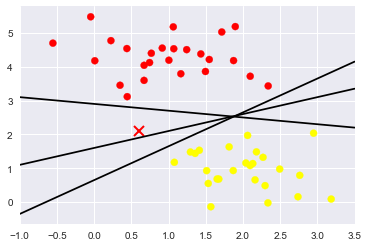

In [98]:
# но линий можно сделать много
# в зависимости от того какую выберем, новая точка Х будет в разных классах

xfit = np.linspace(-1, 3.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plt.plot([0.6], [2.1], 'x', color='red', markeredgewidth=2, markersize=10)

for m, b in [(1, 0.65), (0.5, 1.6), (-0.2, 2.9)]: 
    plt.plot(xfit, m * xfit + b, '-k')
    plt.xlim(-1, 3.5);

## Support Vector Machines: Maximizing the Margin

In [100]:
# Fitting a support vector machine

In [101]:
from sklearn.svm import SVC # "Support vector classifier" 
model = SVC(kernel='linear', C=1E10)
model.fit(X, y)

SVC(C=10000000000.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

# классная визуализация!!!

In [103]:
def plot_svc_decision_function(model, ax=None, plot_support=True):
    """Plot the decision function for a two-dimensional SVC"""
    if ax is None:
        ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # create grid to evaluate model
    x = np.linspace(xlim[0], xlim[1], 30)
    y = np.linspace(ylim[0], ylim[1], 30)
    Y, X = np.meshgrid(y, x)
    xy = np.vstack([X.ravel(), Y.ravel()]).T
    
    # круто!!!    
    P = model.decision_function(xy).reshape(X.shape)
    
    # plot decision boundary and margins
    ax.contour(X, Y, P, colors='k',
               levels=[-1, 0, 1], alpha=0.5,
               linestyles=['--', '-', '--'])
    
    # plot support vectors
    if plot_support: 
        ax.scatter(model.support_vectors_[:, 0],
                   model.support_vectors_[:, 1],
                   s=300, 
                   linewidth=1, 
                   facecolors='none');
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

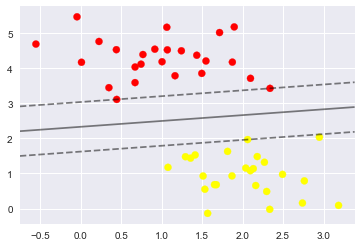

In [105]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(model);

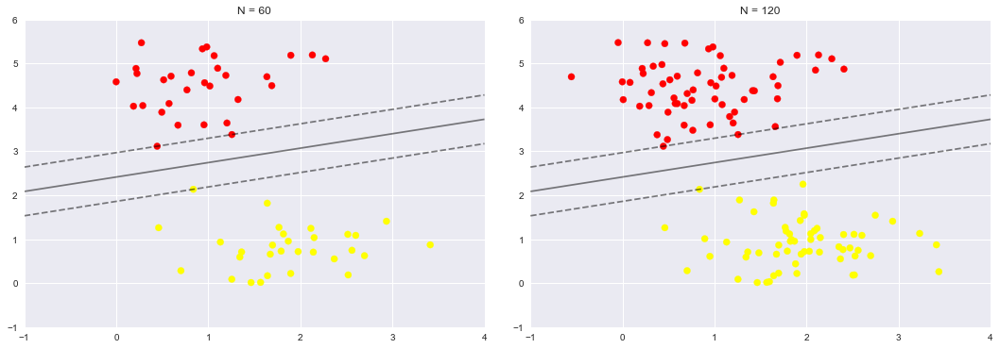

In [112]:
def plot_svm(N=10, ax=None):
    X, y = make_blobs(
        n_samples=200, 
        centers=2,
        random_state=0, 
        cluster_std=0.60)
    
    X = X[:N]
    y = y[:N]
    
    model = SVC(kernel='linear', C=1E10)
    model.fit(X, y)
    
    ax = ax or plt.gca()
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn') 
    ax.set_xlim(-1, 4)
    ax.set_ylim(-1, 6)
    
    plot_svc_decision_function(model, ax)

fig, ax = plt.subplots(1, 2, figsize=(16, 6)) 
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1) 
for axi, N in zip(ax, [60, 120]):
    plot_svm(N, axi)
    axi.set_title('N = {0}'.format(N))

# Круто!!!

In [116]:
from ipywidgets import interact, fixed 
interact(plot_svm, N=[10, 20, 50, 100, 200], ax=fixed(None));

interactive(children=(Dropdown(description='N', options=(10, 20, 50, 100, 200), value=10), Output()), _dom_cla…

In [124]:
model.support_vectors_

array([[0.44359863, 3.11530945],
       [2.33812285, 3.43116792],
       [2.06156753, 1.96918596]])

# особенно svm хорош с разными ядрами

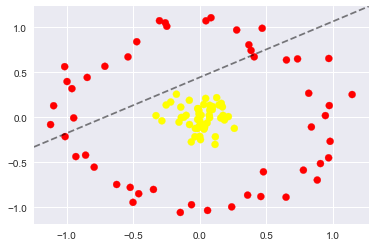

In [118]:
from sklearn.datasets.samples_generator import make_circles 

X, y = make_circles(100, factor=.1, noise=.1)
clf = SVC(kernel='linear').fit(X, y)

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(clf, plot_support=False);

Линейно эти точки нельзя разделить!

In [120]:
r = np.exp(-(X ** 2).sum(1))

In [122]:
from mpl_toolkits import mplot3d

def plot_3D(elev=30, azim=30, X=X, y=y):
    ax = plt.subplot(projection='3d')
    ax.scatter3D(X[:, 0], X[:, 1], r, c=y, s=50, cmap='autumn') 
    ax.view_init(elev=elev, azim=azim)
    
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('r')
    
interact(plot_3D, 
         elev=[-90, 90], 
         azip=(-180, 180),
         X=fixed(X), 
         y=fixed(y)
        );

interactive(children=(Dropdown(description='elev', options=(-90, 90), value=-90), IntSlider(value=30, descript…

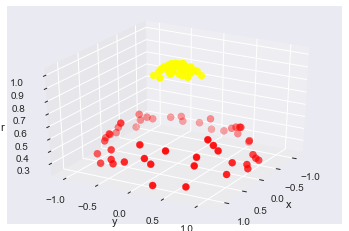

In [123]:
plot_3D(30, 30)

## kernel trick:

https://ru.wikipedia.org/wiki/%D0%AF%D0%B4%D0%B5%D1%80%D0%BD%D1%8B%D0%B9_%D0%BC%D0%B5%D1%82%D0%BE%D0%B4

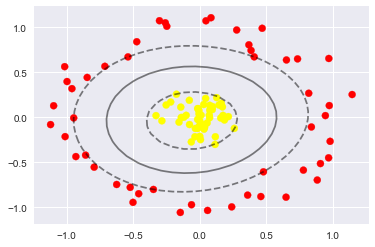

In [126]:
clf = SVC(kernel='rbf', C=1E6)
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(clf)
plt.scatter(
    clf.support_vectors_[:, 0], 
    clf.support_vectors_[:, 1],
    s=300, 
    lw=1, 
    facecolors='none');

Используя этот механизм опорных векторов с ядрами, мы узнаем подходящую границу нелинейного решения. Эта стратегия преобразования ядра часто используется в машинном обучении для превращения быстрых линейных методов в быстрые нелинейные методы, особенно для моделей, в которых можно использовать kernel trick.

# Overlap in data:

## Tuning the SVM: Softening margins

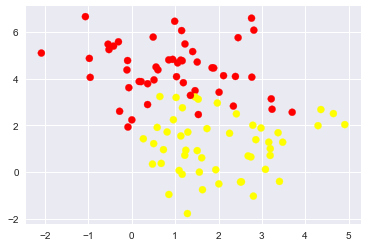

In [128]:
X, y = make_blobs(n_samples=100, centers=2, random_state=0, cluster_std=1.2)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn');

The hardness of the margin is controlled by a tuning parameter, most often known as C. For very large C, the margin is hard, and points cannot lie in it. For smaller C, the margin is softer, and can grow to encompass some points.


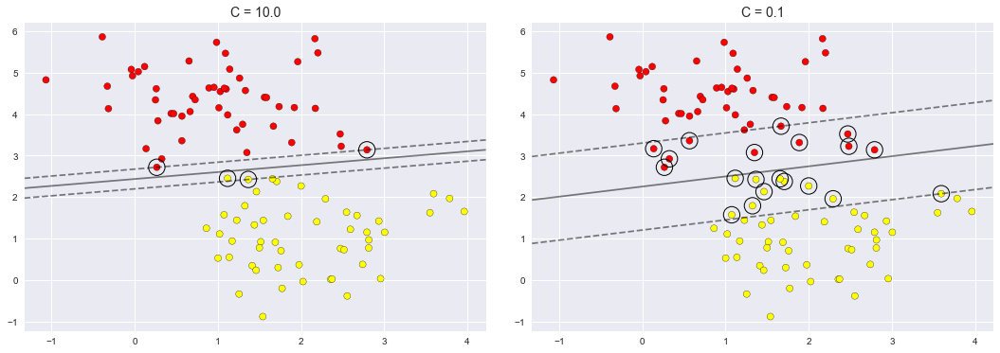

In [135]:
X, y = make_blobs(n_samples=100, centers=2, random_state=0, cluster_std=0.8)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

for axi, C in zip(ax, [10.0, 0.1]):
    model = SVC(kernel='linear', C=C).fit(X, y) 
    
    axi.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn', edgecolor='black',) 
    plot_svc_decision_function(model, axi) 
    
    axi.scatter(model.support_vectors_[:, 0],
                model.support_vectors_[:, 1],
                s=300, 
                lw=1, 
                edgecolor='black',
                facecolors='none'
               );
    axi.set_title('C = {0:.1f}'.format(C), size=14)

The optimal value of the C parameter will depend on your dataset, and should be tuned via cross-validation

## Example: Face Recognition

In [ ]:
from sklearn.datasets import fetch_lfw_people 
faces = fetch_lfw_people(min_faces_per_person=60) 
print(faces.target_names) 
print(faces.images.shape)

# хороший трюк с подписью катринок!

In [140]:
plt.rcParams['figure.figsize'] = 15, 10

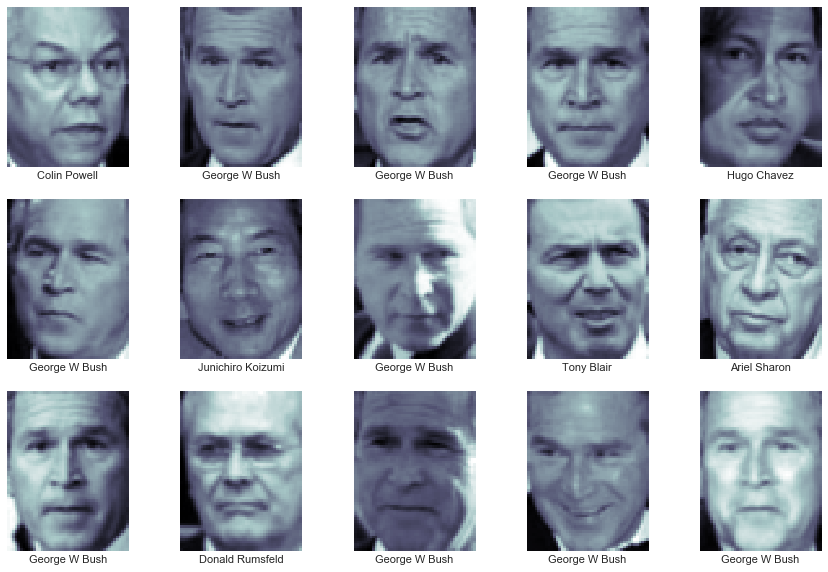

In [141]:
fig, ax = plt.subplots(3, 5)
for i, axi in enumerate(ax.flat):
    axi.imshow(faces.images[i], cmap='bone')
    axi.set(xticks=[], yticks=[], xlabel=faces.target_names[faces.target[i]])

# preprocessing:

In [188]:
from sklearn.svm import SVC
from sklearn.decomposition import PCA 
from sklearn.pipeline import make_pipeline

pca = PCA(n_components=150, whiten=True, random_state=42, svd_solver='randomized')
svc = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svc)

For the sake of testing our classifier output, we will split the data into a training and testing set

In [162]:
from sklearn.model_selection import train_test_split

Xtrain, Xtest, ytrain, ytest = train_test_split(faces.data, faces.target, random_state=42)

Finally, we can use a grid search cross-validation to explore combinations of parame‐ ters. Here we will adjust C (which controls the margin hardness) and gamma (which controls the size of the radial basis function kernel), and determine the best model:

In [177]:
from sklearn.model_selection import GridSearchCV 

param_grid = {'svc__C': [1, 5, 10, 50], 
              'svc__gamma': [0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model, param_grid)

In [183]:
%time 
grid.fit(Xtrain, ytrain) 
print(grid.best_params_)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.15 µs
{'svc__C': 10, 'svc__gamma': 0.001}


In [185]:
model = grid.best_estimator_
yfit = model.predict(Xtest)

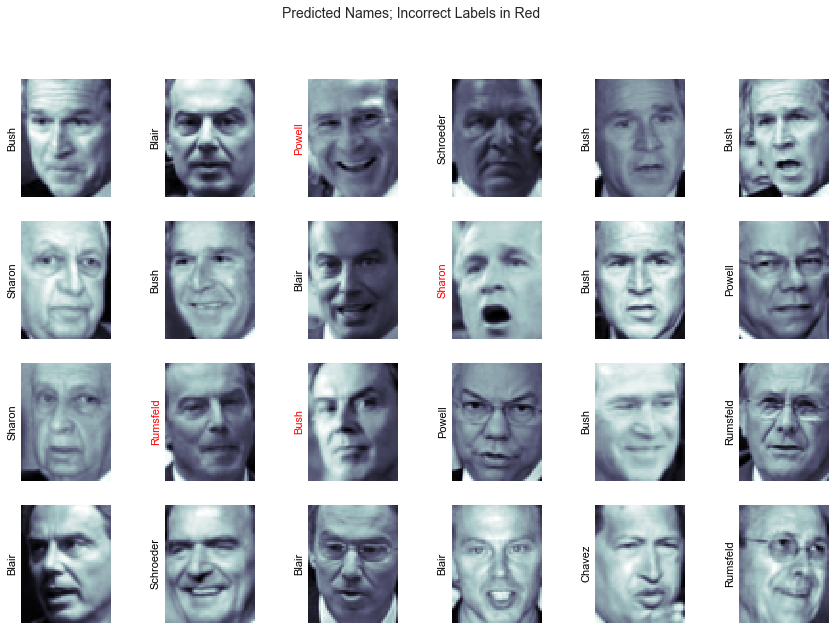

In [186]:
fig, ax = plt.subplots(4, 6)
for i, axi in enumerate(ax.flat):
    i += 100
    axi.imshow(Xtest[i].reshape(62, 47), cmap='bone')
    axi.set(xticks=[], yticks=[])
    axi.set_ylabel(
        faces.target_names[yfit[i]].split()[-1],
        color='black' if yfit[i] == ytest[i] else 'red') 

fig.suptitle('Predicted Names; Incorrect Labels in Red', size=14);

# classification_report

In [156]:
from sklearn.metrics import classification_report 
print(classification_report(ytest, yfit, target_names=faces.target_names))

                   precision    recall  f1-score   support

     Ariel Sharon       0.65      0.73      0.69        15
     Colin Powell       0.80      0.87      0.83        68
  Donald Rumsfeld       0.74      0.84      0.79        31
    George W Bush       0.92      0.83      0.88       126
Gerhard Schroeder       0.86      0.83      0.84        23
      Hugo Chavez       0.93      0.70      0.80        20
Junichiro Koizumi       0.92      1.00      0.96        12
       Tony Blair       0.85      0.95      0.90        42

      avg / total       0.86      0.85      0.85       337



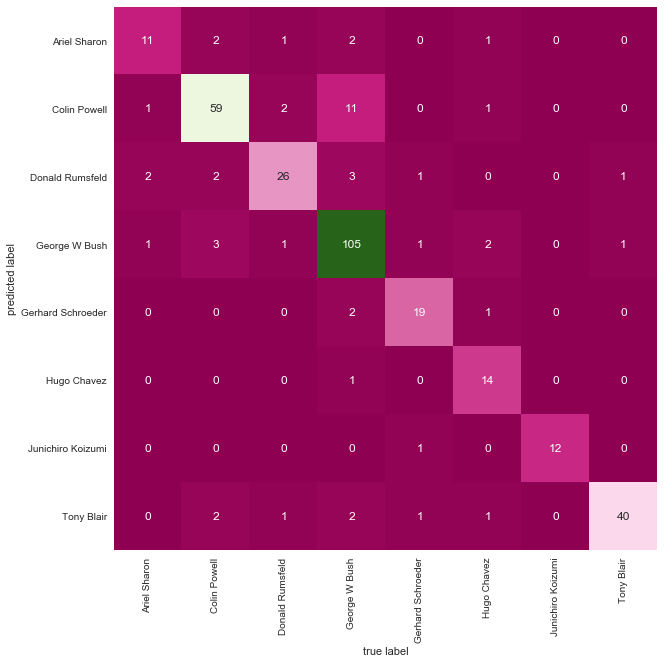

In [159]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(ytest, yfit)
sns.heatmap(mat.T, 
            square=True, 
            annot=True, 
            fmt='d', 
            cbar=False,
            xticklabels=faces.target_names,
            yticklabels=faces.target_names,
            cmap="PiYG",
           )
plt.xlabel('true label')
plt.ylabel('predicted label');

In [160]:
# page 420

+
* Their dependence on relatively few support vectors means that they are very compact models, and take up very little memory.
* Once the model is trained, the prediction phase is very fast.
* Because they are affected only by points near the margin, they work well with high-dimensional data—even data with more dimensions than samples, which is a challenging regime for other algorithms.
* Their integration with kernel methods makes them very versatile, able to adapt to many types of data.

_
* O[N**3] For large numbers of training samples, this computa‐ tional cost can be prohibitive.
* The results are strongly dependent on a suitable choice for the softening parame‐ ter C. This must be carefully chosen via cross-validation, which can be expensive as datasets grow in size.
* The results do not have a direct probabilistic interpretation. This can be estima‐ ted via an internal cross-validation (see the probability parameter of SVC), but this extra estimation is costly.

Фермер решил завести 20 драконов, чтобы продавать яйца по 50 серебряных за штуку. Рептилии (драконы же рептилии?) несут по три яйца в неделю, и каждую неделю все яйца продаются. С этих денег фермер покупает ещё по два дракона в неделю по 300 серебряных, чтобы увеличить свой доход. Но расходы велики: чтобы кормить и содержать питомцев, хозяин каждый день тратит 500 серебряных.

Фермер решил: если прибыли от рептилий так и не будет, через год он продаст их всех одной любительнице драконов, а если будет — продолжит дело. Как вы думаете, продаст он их или нет?

# In-Depth: Decision Trees and Random Forests

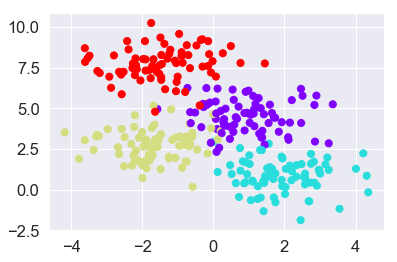

In [151]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=300, centers=4, random_state=0, cluster_std=1.0)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='rainbow');

In [168]:
# 1 1 1 
# 1 0 1 
# 1 0 0
# 1 1 0
# 0 1 1
# 0 0 1
# 0 1 0
# 0 0 0 
# 
0.6 ** 3 + \
0.4 ** 3 + \
0.4 * 0.6 ** 2 * 3 + \
0.4 ** 2 * 0.6 * 3

1.0

In [173]:
pr = 0.9999
pr ** 3 + ((1 - pr) * pr ** 2) * 3

0.9999999700019999

In [174]:
from sklearn.tree import DecisionTreeClassifier 
tree = DecisionTreeClassifier().fit(X, y)

In [177]:
def visualize_classifier(model, X, y, ax=None, cmap='rainbow'):
    ax = ax or plt.gca()
    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=cmap, clim=(y.min(), y.max()), zorder=3)
    ax.axis('tight')
    ax.axis('off')
    
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # fit the estimator
    model.fit(X, y)
    
    xx, yy = np.meshgrid(np.linspace(*xlim, num=200),
                         np.linspace(*ylim, num=200))
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    
    # Create a color plot with the results
    n_classes = len(np.unique(y))
    contours = ax.contourf(xx, 
                           yy, 
                           Z, 
                           alpha=0.3, 
                           levels=np.arange(n_classes + 1) - 0.5,
                           cmap=cmap, 
                           clim=(y.min(), y.max()),
                           zorder=1)
    ax.set(xlim=xlim, ylim=ylim)

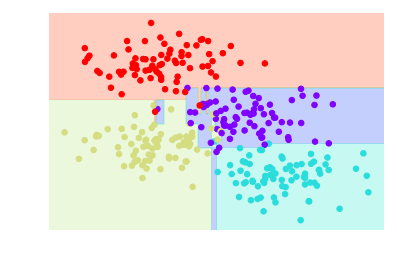

In [178]:
visualize_classifier(DecisionTreeClassifier(), X, y)

In [179]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import BaggingClassifier

tree = DecisionTreeClassifier()
bag = BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)

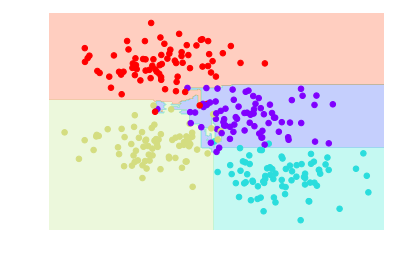

In [180]:
bag.fit(X, y)
visualize_classifier(bag, X, y)

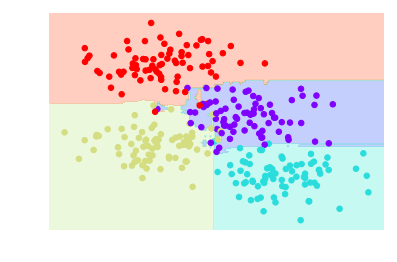

In [181]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=0)
visualize_classifier(model, X, y);

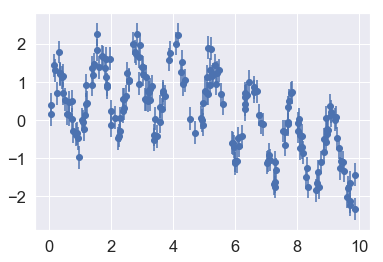

In [183]:
rng = np.random.RandomState(42)
x = 10 * rng.rand(200)

def model(x, sigma=0.3): 
    fast_oscillation = np.sin(5 * x) 
    slow_oscillation = np.sin(0.5 * x) 
    noise = sigma * rng.randn(len(x))
    return slow_oscillation + fast_oscillation + noise 

y = model(x) 
plt.errorbar(x, y, 0.3, fmt='o');

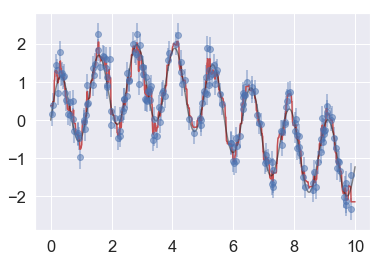

In [184]:
from sklearn.ensemble import RandomForestRegressor 
forest = RandomForestRegressor(200) 
forest.fit(x[:, None], y)
xfit = np.linspace(0, 10, 1000)
yfit = forest.predict(xfit[:, None])
ytrue = model(xfit, sigma=0)
plt.errorbar(x, y, 0.3, fmt='o', alpha=0.5)
plt.plot(xfit, yfit, '-r');
plt.plot(xfit, ytrue, '-k', alpha=0.5);

# In Depth: Principal Component Analysis

Корреляция - это нормализованная мера количества и направления (положительного или отрицательного), которые два столбца изменяют вместе. Ковариация - это обобщенная и ненормализованная версия корреляции между несколькими столбцами. Ковариационная матрица - это расчет ковариации данной матрицы с баллами ковариации для каждого столбца с каждым другим столбцом, включая самого себя.

In [349]:
%matplotlib inline 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set()

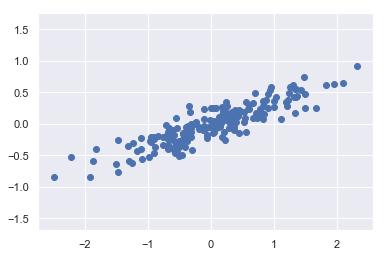

In [350]:
rng = np.random.RandomState(1)
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T
plt.scatter(X[:, 0], X[:, 1])
plt.axis('equal');


rather than attempting to predict the y values from the x values, the unsupervised learning problem attempts to learn about the relationship between the x and y values

При анализе главных компонентов можно количественно оценить это соотношение, найдя список главных осей в данных и используя эти оси для описания набора данных.

In [352]:
from sklearn.decomposition import PCA 
pca = PCA(n_components=2)
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [355]:
# компоненты (вектора)
print(pca.components_)

[[-0.94446029 -0.32862557]
 [-0.32862557  0.94446029]]


In [366]:
# объясненная дисперсия (длинна вектора = его важность)
print(pca.explained_variance_)

[ 0.7625315  0.0184779]


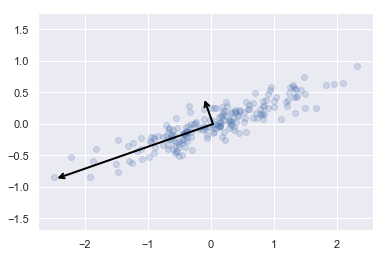

In [365]:
def draw_vector(v0, v1, ax=None): 
    ax = ax or plt.gca()
    arrowprops = dict(arrowstyle='->', linewidth=2, shrinkA=0, shrinkB=0, color='black')
    ax.annotate('', v1, v0, arrowprops=arrowprops)

plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * 3 * np.sqrt(length)
    draw_vector(pca.mean_, pca.mean_ + v)
plt.axis('equal');

# это все - аффиное преобразование

## PCA as dimensionality reduction

Использование PCA для уменьшения размерности включает обнуление одного или нескольких наименьших главных компонентов, что приводит к проекции данных в меньшем размере, которая сохраняет максимальную дисперсию данных.

In [370]:
pca = PCA(n_components=1)
pca.fit(X)
X_pca = pca.transform(X) 
print("original shape: ", X.shape) 
print("transformed shape:", X_pca.shape)

original shape:  (200, 2)
transformed shape: (200, 1)


In [373]:
X[:2]

array([[-0.62530162, -0.17006366],
       [ 0.96069503,  0.5909006 ]])

In [374]:
X_pca[:2]

array([[ 0.67676923],
       [-1.07121393]])

In [376]:
pca.inverse_transform(X_pca[:2])

array([[-0.60566999, -0.22648439],
       [ 1.0452307 ,  0.34794757]])

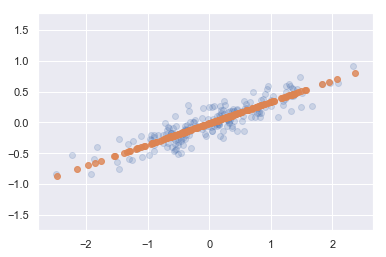

In [375]:
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.8)
plt.axis('equal');

## PCA for visualization: Handwritten digits

In [377]:
from sklearn.datasets import load_digits 
digits = load_digits()
digits.data.shape

(1797, 64)

In [378]:
pca = PCA(2) # project from 64 to 2 dimensions 
projected = pca.fit_transform(digits.data) 
print(digits.data.shape) 
print(projected.shape)

(1797, 64)
(1797, 2)


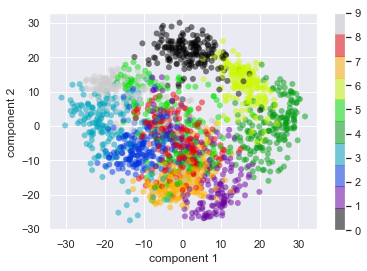

In [380]:
plt.scatter(projected[:, 0], projected[:, 1],
                        c=digits.target, edgecolor='none', alpha=0.5,
                        cmap=plt.cm.get_cmap('nipy_spectral', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

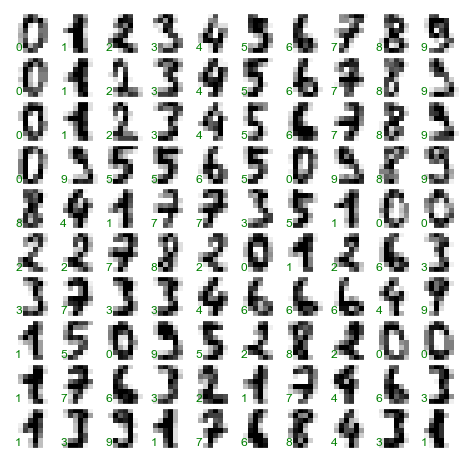

In [383]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = 15, 15
fig, axes = plt.subplots(
    10, 10, 
    figsize=(8, 8), # установили размер каждой картинки
    subplot_kw={'xticks':[], 'yticks':[]}, # убрали тики на графиках
    gridspec_kw=dict(hspace=0.1, wspace=0.1) # немного их раздвинули
)

for i, ax in enumerate(axes.flat):
    ax.imshow(
        digits.images[i], 
        cmap='binary', 
        interpolation='nearest')
    
    ax.text(
        0.05, 0.05, 
        str(digits.target[i]),
        transform=ax.transAxes, 
        color='green'
    )

In [398]:
new_digits = pca.inverse_transform(projected)

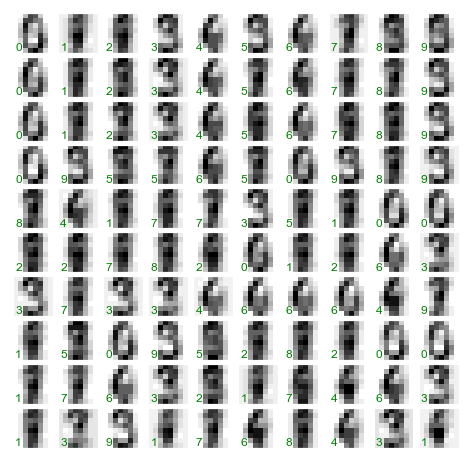

In [400]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = 15, 15
fig, axes = plt.subplots(
    10, 10, 
    figsize=(8, 8), # установили размер каждой картинки
    subplot_kw={'xticks':[], 'yticks':[]}, # убрали тики на графиках
    gridspec_kw=dict(hspace=0.1, wspace=0.1) # немного их раздвинули
)

for i, ax in enumerate(axes.flat):
    ax.imshow(
        new_digits[i].astype(int).reshape(8, 8), 
        cmap='binary', 
        interpolation='nearest')
    
    ax.text(
        0.05, 0.05, 
        str(digits.target[i]),
        transform=ax.transAxes, 
        color='green'
    )

## Choosing the number of components

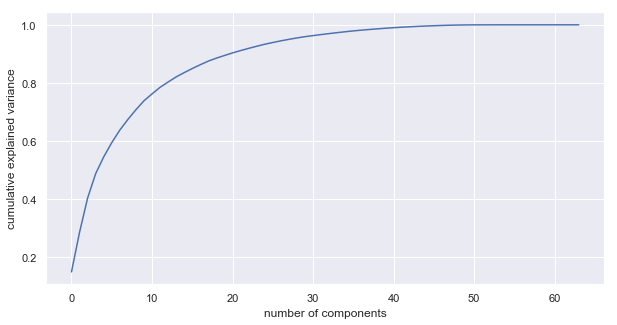

In [402]:
plt.rcParams['figure.figsize'] = 10, 5
pca = PCA().fit(digits.data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

## PCA as Noise Filtering

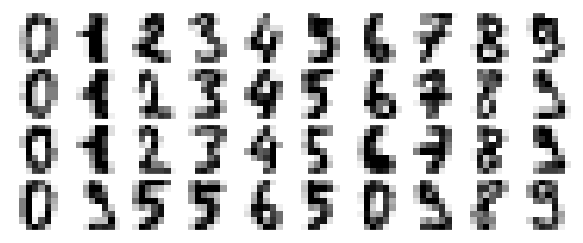

In [404]:
def plot_digits(data):
    fig, axes = plt.subplots(4, 10, 
                             figsize=(10, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1)) 
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(8, 8),
                  cmap='binary',
                  interpolation='nearest',
                  clim=(0, 16))
        
plot_digits(digits.data)

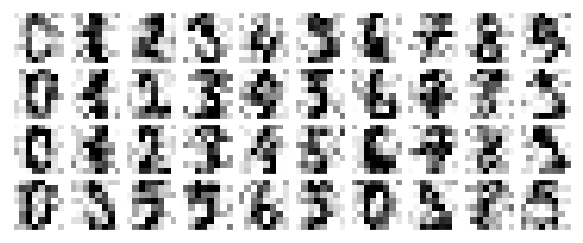

In [405]:
# add some noise:
np.random.seed(42)
noisy = np.random.normal(digits.data, 4)
plot_digits(noisy)

In [406]:
pca = PCA(0.50).fit(noisy)
pca.n_components_

12

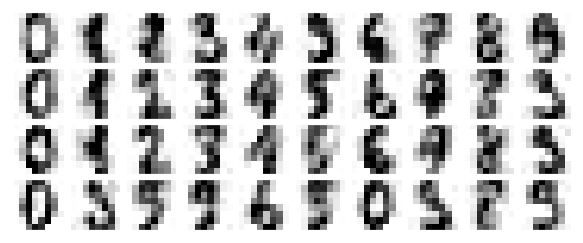

In [408]:
# remove noise
components = pca.transform(noisy)
filtered = pca.inverse_transform(components)
plot_digits(filtered)

## Example: Eigenfaces

In [410]:
from sklearn.datasets import fetch_lfw_people 
faces = fetch_lfw_people(min_faces_per_person=60) 
print(faces.target_names) 
print(faces.images.shape)

['Ariel Sharon' 'Colin Powell' 'Donald Rumsfeld' 'George W Bush'
 'Gerhard Schroeder' 'Hugo Chavez' 'Junichiro Koizumi' 'Tony Blair']
(1348, 62, 47)


In [412]:
# Because this is a large dataset, we will use RandomizedPCA 
# it contains a randomized method to approximate the first N principal components 
# much more quickly than the standard PCA estimator, 
# and thus is very useful for high-dimensional data (here, a dimensionality of nearly 3,000)
from sklearn.decomposition import PCA 
pca = PCA(150, svd_solver='randomized')
pca.fit(faces.data)

PCA(copy=True, iterated_power='auto', n_components=150, random_state=None,
  svd_solver='randomized', tol=0.0, whiten=False)

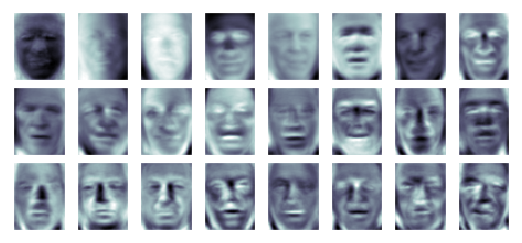

In [414]:
# eigenvectors
fig, axes = plt.subplots(3, 8, 
                         figsize=(9, 4), 
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1)) 
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[i].reshape(62, 47), cmap='bone')

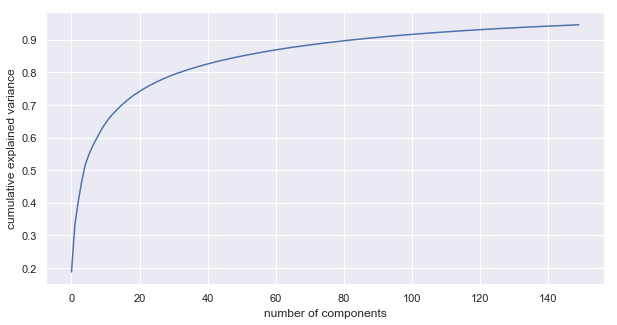

In [416]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [417]:
# Compute the components and projected faces 
pca = PCA(150, svd_solver='randomized').fit(faces.data) 
components = pca.transform(faces.data) 
projected = pca.inverse_transform(components)

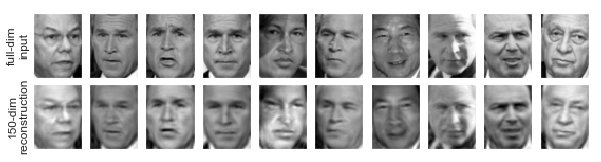

In [419]:
# Plot the results
fig, ax = plt.subplots(2, 10, figsize=(10, 2.5),
                                   subplot_kw={'xticks':[], 'yticks':[]},
                                   gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(10):
    ax[0, i].imshow(faces.data[i].reshape(62, 47), 
                    cmap='binary_r') 
    ax[1, i].imshow(projected[i].reshape(62, 47), cmap='binary_r')

ax[0, 0].set_ylabel('full-dim\ninput')
ax[1, 0].set_ylabel('150-dim\nreconstruction');

# In-Depth: Manifold Learning

PCA ok, но только если зависимость в данных линейная

manifold learning -  a class of unsupervised estimators that seeks to describe datasets as low dimensional manifolds embedded in high-dimensional spaces

можно подумать о mainfold как о листе бумаги - он двумерный в нашем трехмерном мире и мы можем его складывать и сворачивать

Вращение, переориентация или растяжение листа бумаги в трехмерном пространстве не изменяет плоскую геометрию бумаги: такие операции сродни линейным вложениям. Если вы сгибаете, скручиваете или сгибаете бумагу, это все еще двумерное многообразие, но вложение в трехмерное пространство больше не является линейным. Множественные алгоритмы обучения будут стремиться узнать о фундаментальной двумерной природе листа, даже если он искажен, чтобы заполнить трехмерное пространство.

In [421]:
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set() 
import numpy as np

## Manifold Learning: “HELLO”

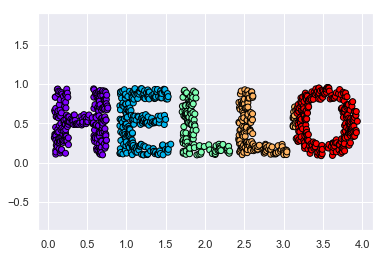

In [430]:
def make_hello(N=1000, rseed=42):
    
    # Make a plot with "HELLO" text; save as PNG
    fig, ax = plt.subplots(figsize=(4, 1))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    ax.axis('off')
    ax.text(0.5, 0.4, 'HELLO', va='center', ha='center', weight='bold', size=85)
    fig.savefig('hello.png')
    plt.close(fig)
    
    # Open this PNG and draw random points from it
    from matplotlib.image import imread 
    data = imread('hello.png')[::-1, :, 0].T 
    rng = np.random.RandomState(rseed)
    
    X = rng.rand(4 * N, 2)
    i, j = (X * data.shape).astype(int).T 
    mask = (data[i, j] < 1)
    X = X[mask]
    X[:, 0] *= (data.shape[0] / data.shape[1]) 
    X = X[:N]
    return X[np.argsort(X[:, 0])]
    
X = make_hello(1000)

colorize = dict(c=X[:, 0], cmap=plt.cm.get_cmap('rainbow', 5), edgecolor='black')
plt.scatter(X[:, 0], X[:, 1], **colorize)
plt.axis('equal');

The output is two dimensional, and consists of points drawn in the shape of the word “HELLO”. This data form will help us to see visually what these algorithms are doing.

## Multidimensional Scaling (MDS)

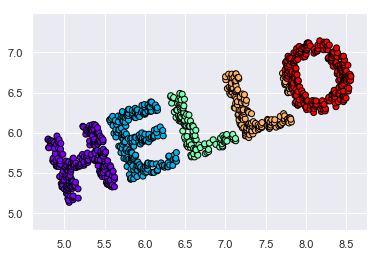

In [431]:
def rotate(X, angle):
    theta = np.deg2rad(angle)
    R = [[np.cos(theta), np.sin(theta)], [-np.sin(theta), np.cos(theta)]]
    return np.dot(X, R)

X2 = rotate(X, 20) + 5
plt.scatter(X2[:, 0], X2[:, 1], **colorize)
plt.axis('equal');

In [432]:
# при аффинных преобразованиях надпись ни куда не денется

из этого следует, что координаты, саами по себе не описывают датасет. Важна дистанция междду точками

In [433]:
from sklearn.metrics import pairwise_distances 
D = pairwise_distances(X)
D.shape

(1000, 1000)

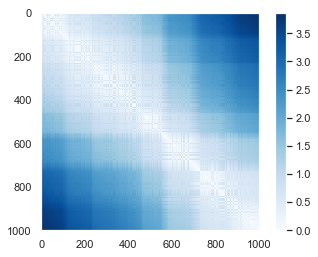

In [434]:
plt.imshow(D, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar();

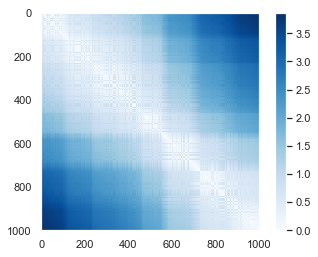

In [436]:
plt.imshow(D2, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar();

In [435]:
D2 = pairwise_distances(X2)
np.allclose(D, D2)

True

In [438]:
D2[:2]

array([[ 0.        ,  0.34803471,  0.00916819, ...,  3.85520767,
         3.8418581 ,  3.85958502],
       [ 0.34803471,  0.        ,  0.34018159, ...,  3.83720462,
         3.84809626,  3.85279095]])

In [439]:
D[:2]

array([[ 0.        ,  0.34803471,  0.00916819, ...,  3.85520767,
         3.8418581 ,  3.85958502],
       [ 0.34803471,  0.        ,  0.34018159, ...,  3.83720462,
         3.84809626,  3.85279095]])

# матрица расстояний дала нам описание данных, инвариантное к аффиным преобразованиям

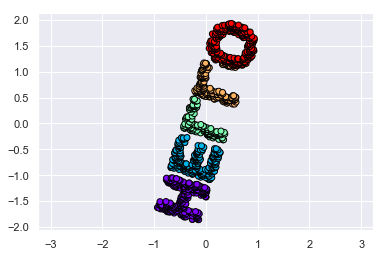

In [442]:
# Let’s see how it works for our distance matrix, 
# using the precomputed dissimilarity to specify that we are passing a distance matrix
from sklearn.manifold import MDS
model = MDS(n_components=2, dissimilarity='precomputed', random_state=1) 

out = model.fit_transform(D)
plt.scatter(out[:, 0], out[:, 1], **colorize)
plt.axis('equal');

# The MDS algorithm recovers one of the possible two-dimensional coordinate repre‐ sentations of our data, using only the N × N distance matrix describing the relation‐ ship between the data points.

## MDS as Manifold Learning
## Multidimensional scaling

полезность этого метода в том, что матрица расстояний может быть построена на данных любой размерности

In [444]:
def random_projection(X, dimension=3, rseed=42): 
    assert dimension >= X.shape[1]
    rng = np.random.RandomState(rseed)
    C = rng.randn(dimension, dimension) 
    e, V = np.linalg.eigh(np.dot(C, C.T)) 
    
    return np.dot(X, V[:X.shape[1]])

X3 = random_projection(X, 3)
X3.shape

(1000, 3)

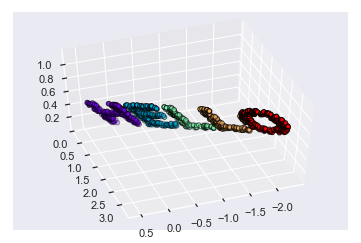

In [445]:
from mpl_toolkits import mplot3d 

ax = plt.axes(projection='3d')
ax.scatter3D(X3[:, 0], X3[:, 1], X3[:, 2], **colorize)
ax.view_init(azim=70, elev=50)

We can now ask the MDS estimator to input this three-dimensional data, compute the distance matrix, and then determine the optimal two-dimensional embedding for this distance matrix. The result recovers a representation of the original data

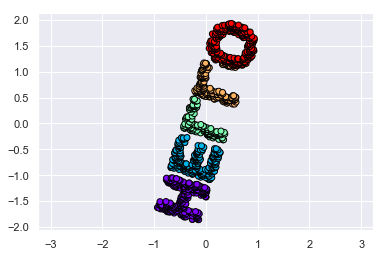

In [446]:
model = MDS(n_components=2, random_state=1)
out3 = model.fit_transform(X3)
plt.scatter(out3[:, 0], out3[:, 1], **colorize)
plt.axis('equal');

# в общем в этом и есть смысл. Мы берем данные размерности N и пытаемся прдеставить их в ввиде N - n

# но с  нелинейным преобразованием ему не справиться:

In [452]:
def make_hello_s_curve(X): 
    t = (X[:,0] - 2) * 0.75 * np.pi
    x = np.sin(t)
    y = X[:,1]
    z = np.sign(t) * (np.cos(t) - 1) 
    return np.vstack((x, y, z)).T

In [450]:
XS = make_hello_s_curve(X)

In [451]:
XS.shape

(1000, 3)

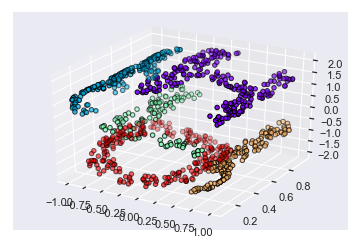

In [453]:
from mpl_toolkits import mplot3d 

ax = plt.axes(projection='3d')
ax.scatter3D(XS[:, 0], XS[:, 1], XS[:, 2], **colorize);

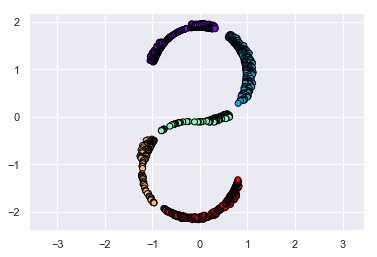

In [455]:
from sklearn.manifold import MDS
model = MDS(n_components=2, random_state=2) 
outS = model.fit_transform(XS) 
plt.scatter(outS[:, 0], outS[:, 1], **colorize) 
plt.axis('equal');

# MDS восстановил данные в виде кривой S, а не слова HELLO

# Nonlinear Manifolds: Locally Linear Embedding

проблема в том, что MDS учитывает расстояние между дальними точками. А что если модифицировать алгоритм и учитывать только расстояние меду ближайшими точками?

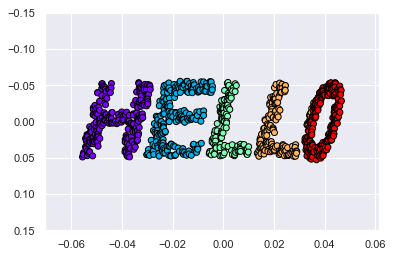

In [458]:
from sklearn.manifold import LocallyLinearEmbedding
model = LocallyLinearEmbedding(
    n_neighbors=100, 
    n_components=2, 
    method='modified',
    eigen_solver='dense')
out = model.fit_transform(XS)
fig, ax = plt.subplots()
ax.scatter(out[:, 0], out[:, 1], **colorize)
ax.set_ylim(0.15, -0.15);

mainfold методы достаточно привередливы, так что их чаще используют для визуализации данных

* проблемы пропущенных данных (в отличии от PCA)
* шум может все испортить
* важно выбрать правильно число соседей и размерность
* не интуитивно (в отличии от PCA)
* вычислительная сложность O[N^3]

# Стоит использовать mainfold после PCA

# Что есть в sklearn:

* For toy problems such as the S-curve we saw before, locally linear embedding (LLE) and its variants (especially modified LLE), perform very well. This is imple‐ mented in sklearn.manifold.LocallyLinearEmbedding.
* For high-dimensional data from real-world sources, LLE often produces poor results, and isometric mapping (Isomap) seems to generally lead to more mean‐ ingful embeddings. This is implemented in sklearn.manifold.Isomap.
* For data that is highly clustered, t-distributed stochastic neighbor embedding (t- SNE) seems to work very well, though can be very slow compared to other meth‐ ods. This is implemented in sklearn.manifold.TSNE.

## Example: Isomap on Faces

mainfold часть используют для понимания отношений в высокоразмерных данных. Например картинках

In [464]:
from sklearn.datasets import fetch_lfw_people 
faces = fetch_lfw_people(min_faces_per_person=30) 
faces.data.shape

(2370, 2914)

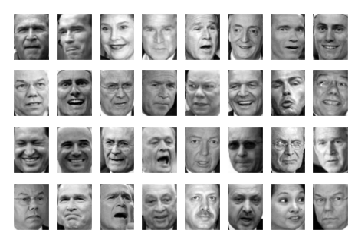

In [465]:
fig, ax = plt.subplots(4, 8, subplot_kw=dict(xticks=[], yticks=[])) 
for i, axi in enumerate(ax.flat):
    axi.imshow(faces.images[i], cmap='gray')

We would like to plot a low-dimensional embedding of the 2,914-dimensional data to learn the fundamental relationships between the images.

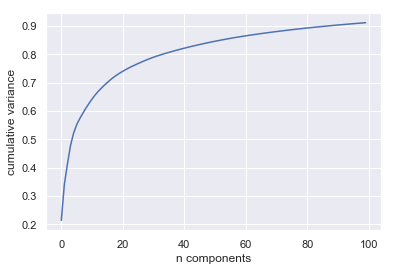

In [467]:
from sklearn.decomposition import PCA 
model = PCA(100, svd_solver='randomized').fit(faces.data) 

plt.plot(np.cumsum(model.explained_variance_ratio_)) 
plt.xlabel('n components')
plt.ylabel('cumulative variance');

100 компонент из 2914 содержат 90% данных

When this is the case, nonlinear manifold embeddings like LLE and Isomap can be helpful. We can compute an Isomap embedding on these faces using the same pattern shown before:


In [468]:
from sklearn.manifold import Isomap 

model = Isomap(n_components=2)
proj = model.fit_transform(faces.data)
proj.shape

(2370, 2)

The output is a two-dimensional projection of all the input images. To get a better idea of what the projection tells us, let’s define a function that will output image thumbnails at the locations of the projections:

In [469]:
from matplotlib import offsetbox

def plot_components(data, model, images=None, ax=None, thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()
    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2 
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1) 
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(offsetbox.OffsetImage(images[i], cmap=cmap),
                                                proj[i])
            ax.add_artist(imagebox)

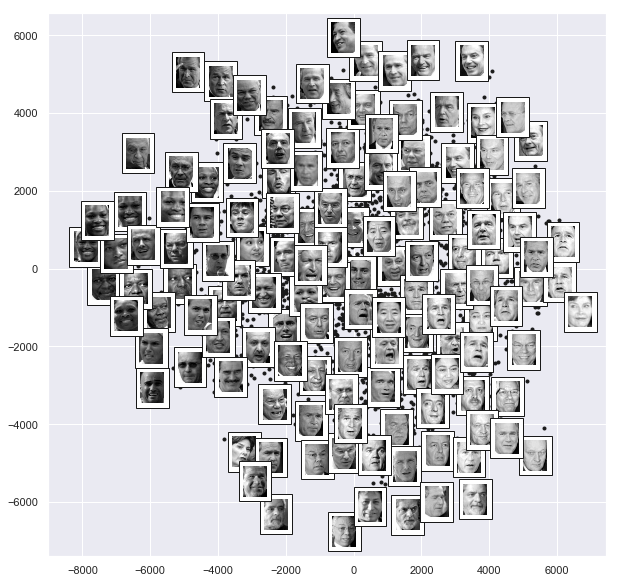

In [473]:
# plt.rcParams['figure.figsize'] = 40, 40
fig, ax = plt.subplots(figsize=(10, 10))
plot_components(faces.data, model=Isomap(n_components=2), images=faces.images[:, ::2, ::2])

# Example: Visualizing Structure in Digits

In [476]:
# from sklearn.datasets import fetch_mldata 
# mnist = fetch_mldata('MNIST original') 
# mnist.data.shape

from sklearn.datasets import load_digits 
digits = load_digits()
digits.data.shape

(1797, 64)

In [478]:
mnist = digits

IndexError: index 2500 is out of bounds for axis 0 with size 1797

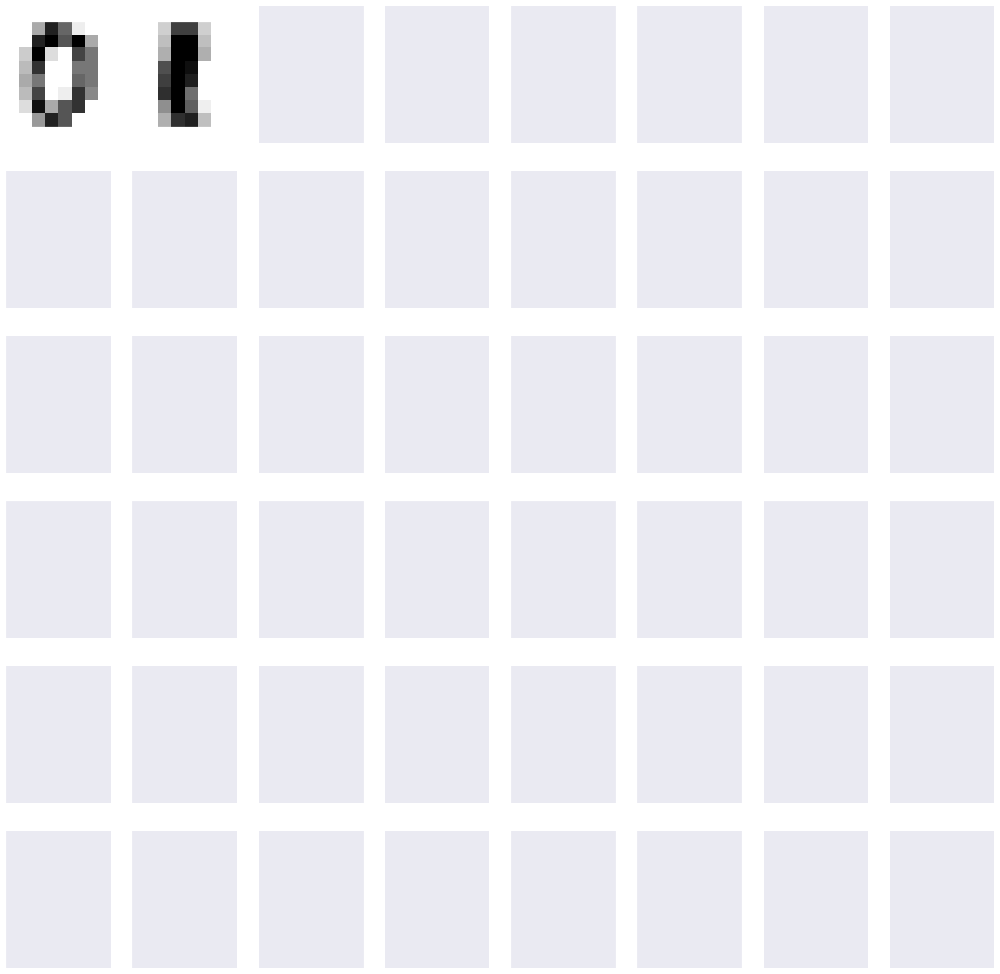

In [480]:
fig, ax = plt.subplots(6, 8, subplot_kw=dict(xticks=[], yticks=[])) 
for i, axi in enumerate(ax.flat):
    axi.imshow(mnist.data[1250 * i].reshape(8, 8), cmap='gray_r')

# In Depth: k-Means Clustering

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set() # for plot styling import numpy as np

* The “cluster center” is the arithmetic mean of all the points belonging to the cluster.
* Each point is closer to its own cluster center than to other cluster centers.

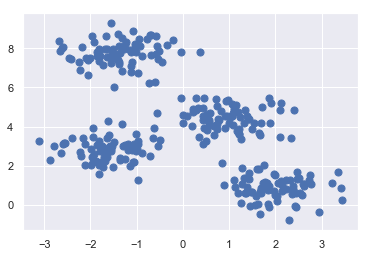

In [483]:
# dataset
from sklearn.datasets.samples_generator import make_blobs 
X, y_true = make_blobs(n_samples=300, 
                       centers=4,
                       cluster_std=0.60, 
                       random_state=0)
plt.scatter(X[:, 0], X[:, 1], s=50);

In [5]:
from sklearn.cluster import KMeans 
kmeans = KMeans(n_clusters=4) 
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

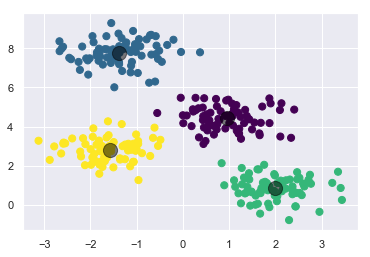

In [495]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

## k-Means Algorithm: Expectation–Maximization

* Guess some cluster centers
* Repeat until converged:
    * E-Step: assign points to the nearest cluster center 
    * M-Step: set the cluster centers to the mean

In [497]:
from sklearn.metrics import pairwise_distances_argmin

In [510]:
n_clusters = 4

In [511]:
i = rng.permutation(X.shape[0])[:n_clusters]
centers = X[i]
centers

array([[-1.10782972,  2.92014479],
       [-1.25245465,  2.33911505],
       [-1.86621694,  7.625494  ],
       [-1.11064012,  2.8221382 ]])

In [512]:
labels = pairwise_distances_argmin(X, centers)

In [513]:
labels

array([3, 2, 0, 2, 3, 1, 1, 0, 2, 2, 3, 2, 0, 2, 1, 0, 0, 1, 0, 1, 1, 1, 0,
       3, 1, 0, 1, 0, 1, 0, 2, 2, 0, 2, 2, 2, 2, 2, 1, 1, 0, 1, 0, 0, 1, 3,
       2, 3, 2, 1, 0, 1, 2, 1, 3, 3, 2, 1, 2, 1, 2, 0, 2, 0, 0, 3, 2, 1, 2,
       0, 0, 0, 2, 0, 1, 2, 0, 0, 1, 2, 1, 0, 1, 1, 2, 0, 1, 0, 2, 2, 0, 1,
       2, 0, 0, 0, 1, 1, 0, 0, 2, 1, 2, 1, 0, 1, 1, 0, 2, 0, 1, 0, 1, 2, 1,
       0, 2, 1, 3, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 0, 2,
       0, 2, 2, 0, 0, 0, 0, 1, 2, 0, 2, 2, 2, 0, 2, 0, 1, 0, 2, 1, 1, 0, 2,
       0, 0, 3, 0, 1, 1, 0, 1, 0, 0, 2, 1, 0, 0, 2, 3, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 2, 0, 3, 0, 0, 1, 1, 1, 0, 1, 2, 0, 0, 1, 1, 0, 2, 3,
       2, 0, 2, 0, 1, 0, 0, 2, 3, 3, 1, 1, 0, 2, 1, 1, 0, 1, 0, 0, 2, 2, 0,
       0, 2, 0, 1, 0, 0, 1, 0, 2, 0, 1, 0, 1, 2, 2, 2, 2, 0, 0, 2, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 2, 0, 0, 0, 1, 2, 0, 0, 2, 0, 1, 1, 0, 1, 0, 3, 1,
       1, 0, 2, 2, 3, 1, 0, 1, 1, 1, 2, 0, 2, 0, 1, 1, 2, 2, 2, 1, 1, 0, 2,
       1])

In [514]:
new_centers = np.array([X[labels == i].mean(0) for i in range(n_clusters)])

In [515]:
new_centers

array([[ 0.13363368,  4.03935162],
       [ 0.87560215,  1.20167362],
       [-1.37324398,  7.75368871],
       [ 0.16365743,  2.34740206]])

In [529]:
def find_clusters(X, n_clustres, rseed=2):
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters] 
    centers = X[i]
    
    while True:
        # 2a. Assign labels based on closest center 
        labels = pairwise_distances_argmin(X, centers)
        
        # 2b. Find new centers from means of points
        new_centers = np.array([X[labels == i].mean(0) for i in range(n_clusters)])
        
        plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis')
        plt.show();
        
        # 2c. Check for convergence
        if np.all(centers == new_centers): 
            break
        
        centers = new_centers
    return centers, labels

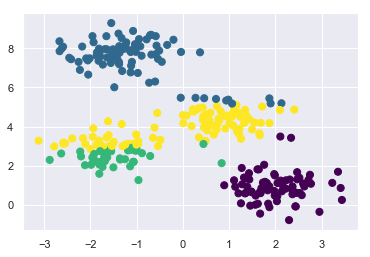

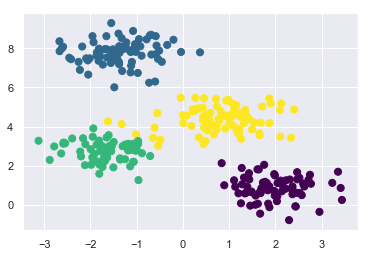

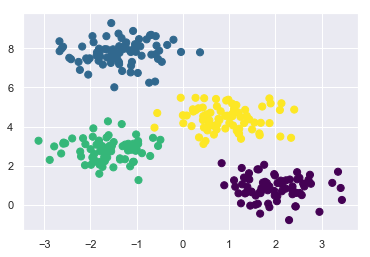

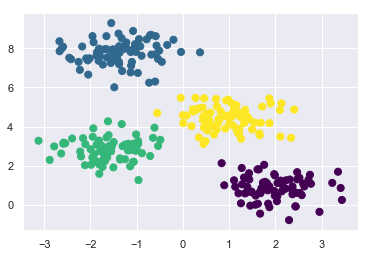

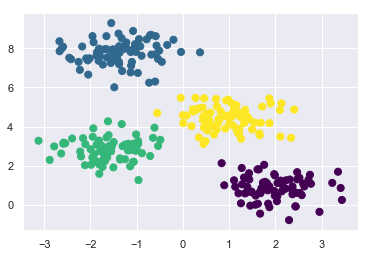

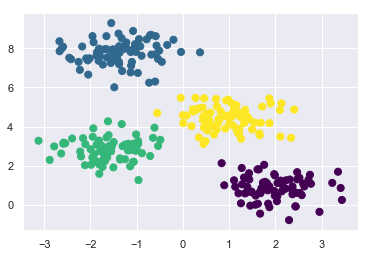

In [527]:
centers, labels = find_clusters(X, 4, 100)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

# но глобального оптимума можно и не достичь!

для этого нужно перезапускать его несколько раз
* n_init parameter, which defaults to 10

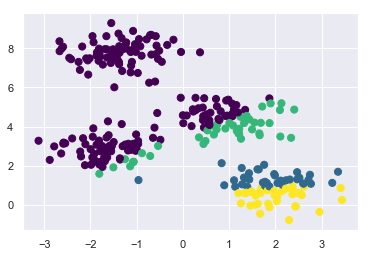

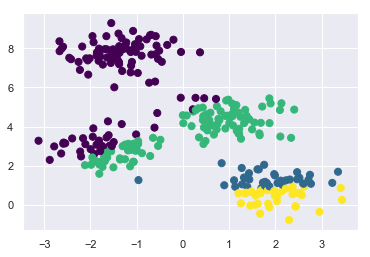

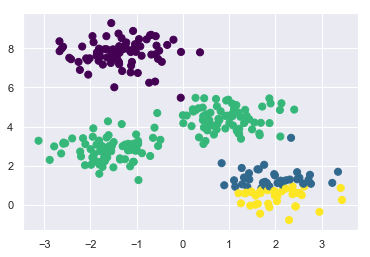

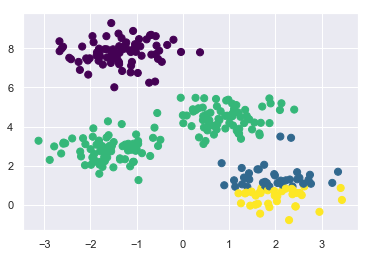

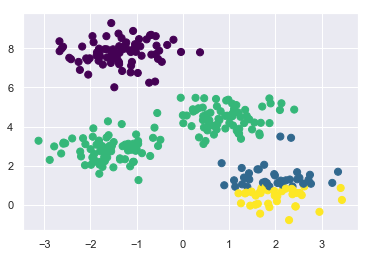

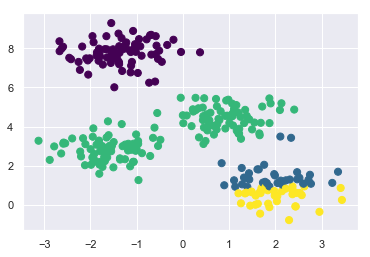

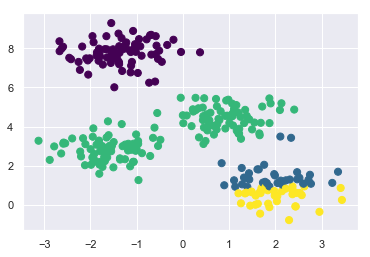

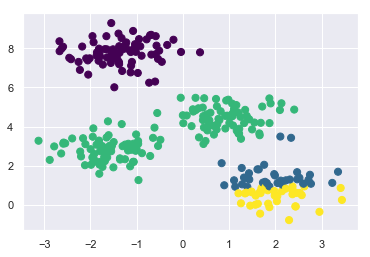

In [530]:
centers, labels = find_clusters(X, 4, rseed=0)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

# и важно выбрать хорошее число кластеров

* silhouette analysis
* более мощные алгоритмы ((e.g., Gaussian mixture models; see “In Depth: Gaussian Mixture Models” on page 476) or which can choose a suitable number of clusters (e.g., DBSCAN, mean-shift, or affinity propagation, all available in the sklearn.cluster submodule).
)

# k-means - линейный

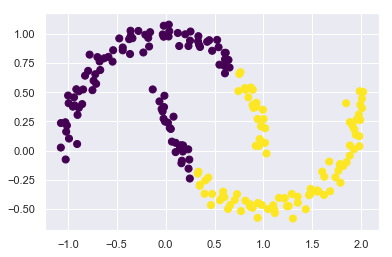

In [534]:
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)
labels = KMeans(2, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

тут помуг полиномы, kernel transformation

одна из версий: SpectralClustering

/Users/ilya/anaconda/envs/conda/lib/python3.5/site-packages/sklearn/manifold/spectral_embedding_.py:237: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



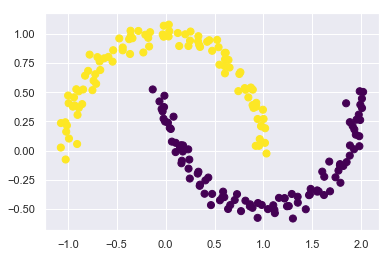

In [535]:
from sklearn.cluster import SpectralClustering 
model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans')
labels = model.fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

# может быть медленным с большим числом точек

sklearn.cluster.MiniBatchKMeans

## Example 1: k-Means on digits

In [9]:
import numpy as np

In [2]:
from sklearn.datasets import load_digits 
digits = load_digits()
digits.data.shape

(1797, 64)

In [16]:
kmeans = KMeans(n_clusters=10, random_state=0)
clusters = kmeans.fit_predict(digits.data)
kmeans.cluster_centers_.shape

(10, 64)

# центры кластеров могут быть представлены в виде "типичных цифр" в них

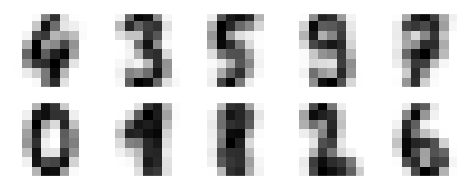

In [17]:
fig, ax = plt.subplots(2, 5, figsize=(8, 3)) 
centers = kmeans.cluster_centers_.reshape(10, 8, 8) 

for axi, center in zip(ax.flat, centers):
    axi.set(xticks=[], yticks=[])
    axi.imshow(center, interpolation='nearest', cmap=plt.cm.binary)

In [18]:
from scipy.stats import mode
labels = np.zeros_like(clusters) 
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(digits.target[mask])[0]

In [19]:
from sklearn.metrics import accuracy_score 
accuracy_score(digits.target, labels)

0.79354479688369506

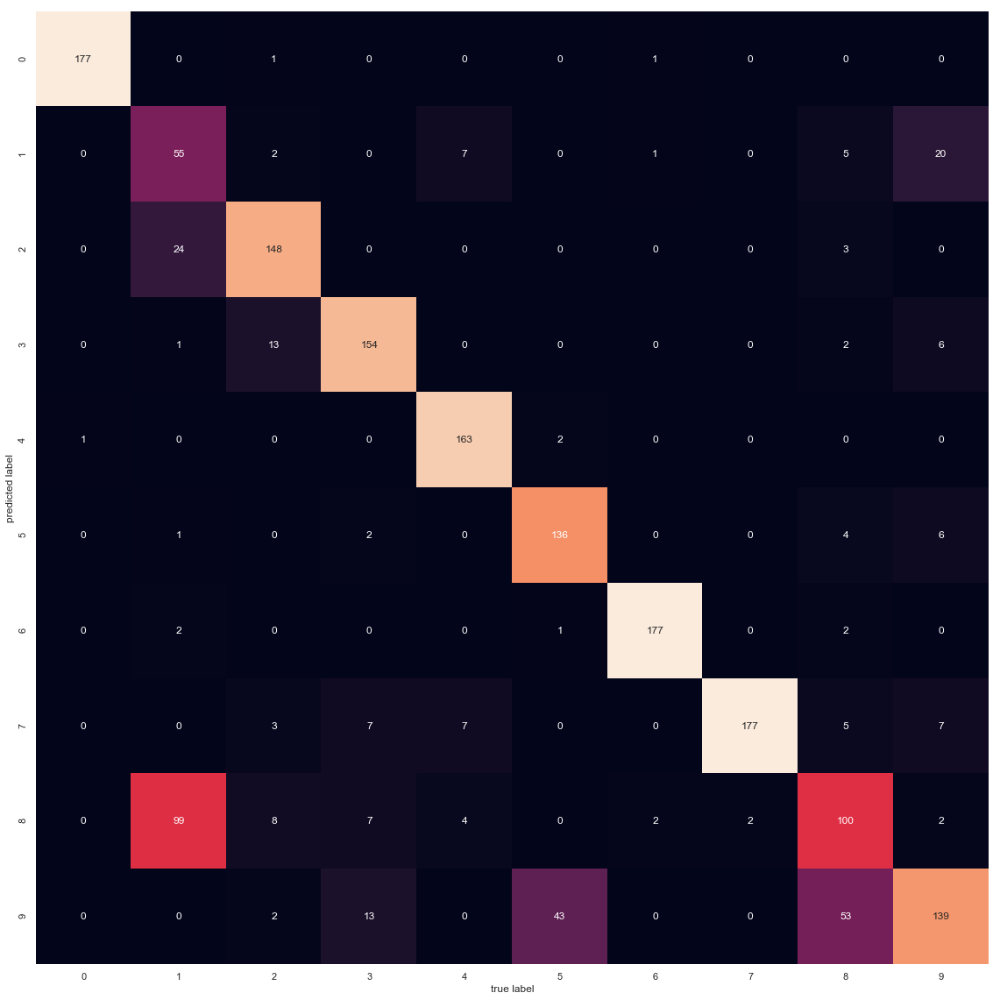

In [11]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(digits.target, labels) 
plt.rcParams['figure.figsize'] = (20, 20)
sns.heatmap(mat.T, 
            square=True, 
            annot=True, 
            fmt='d', 
            cbar=False,
            xticklabels=digits.target_names,
            yticklabels=digits.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [20]:
# using non-linear tSNE
from sklearn.manifold import TSNE
# Project the data: this step will take several seconds
tsne = TSNE(n_components=2, init='pca', random_state=0)
digits_proj = tsne.fit_transform(digits.data)

In [21]:
# Compute the clusters
kmeans = KMeans(n_clusters=10, random_state=0)
clusters = kmeans.fit_predict(digits_proj)

In [22]:
# Permute the labels
labels = np.zeros_like(clusters) 
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(digits.target[mask])[0]

# Compute the accuracy
accuracy_score(digits.target, labels)

0.93989983305509184

That’s nearly 94% classification accuracy without using the labels. This is the power of unsupervised learning when used carefully: it can extract information from the data‐ set that it might be difficult to do by hand or by eye.


## Example 2: k-means for color compression

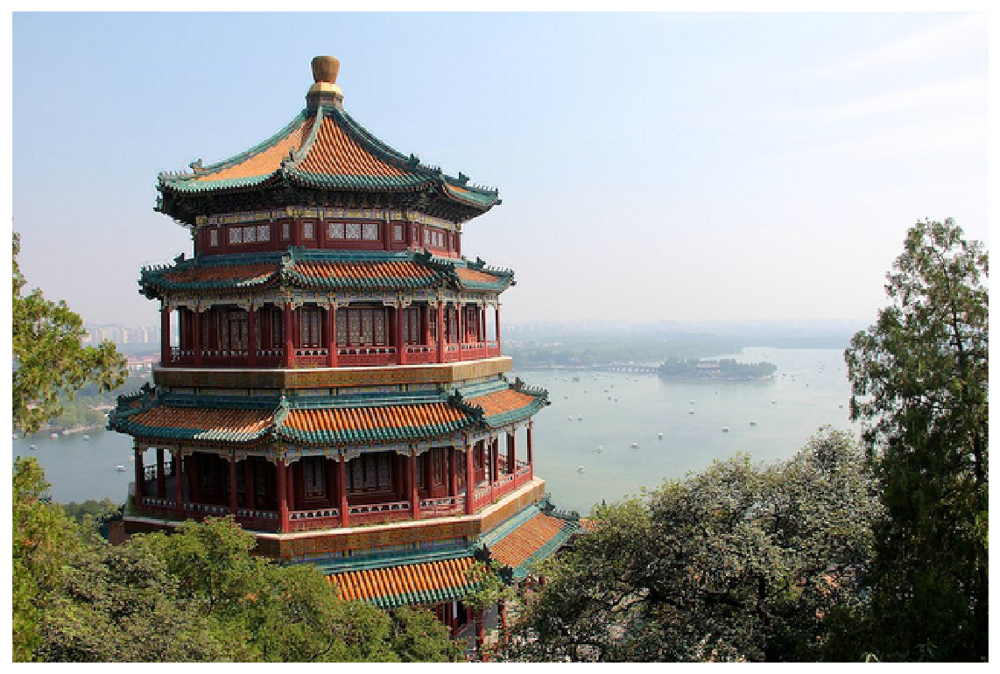

In [25]:
# Note: this requires the pillow package to be installed 
from sklearn.datasets import load_sample_image
china = load_sample_image("china.jpg")
ax = plt.axes(xticks=[], yticks=[])
ax.imshow(china);

In [27]:
china.shape

(427, 640, 3)

In [29]:
# попробую сделать сам:

In [30]:
data = china.reshape(china.shape[0] * china.shape[1], 3)

In [31]:
data.shape

from sklearn.cluster import MiniBatchKMeans

(273280, 3)

In [39]:
data = china / 255.0 # use 0...1 scale 
data = data.reshape(427 * 640, 3) 
data.shape

(273280, 3)

In [40]:
def plot_pixels(data, title, colors=None, N=10000): 
    if colors is None:
        colors = data
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(data.shape[0])[:N]
    colors = colors[i]
    R, G, B = data[i].T
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))
    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))
    fig.suptitle(title, size=20);

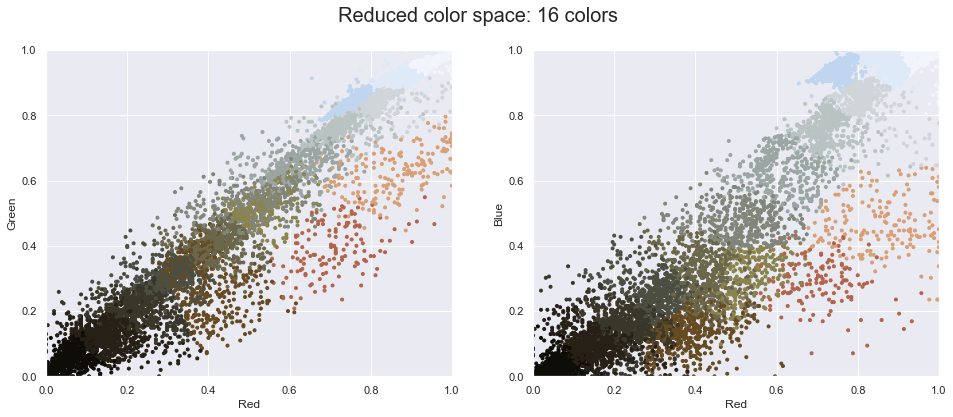

In [41]:
from sklearn.cluster import MiniBatchKMeans 
kmeans = MiniBatchKMeans(16)
kmeans.fit(data)
new_colors = kmeans.cluster_centers_[kmeans.predict(data)]
plot_pixels(data, colors=new_colors, title="Reduced color space: 16 colors")

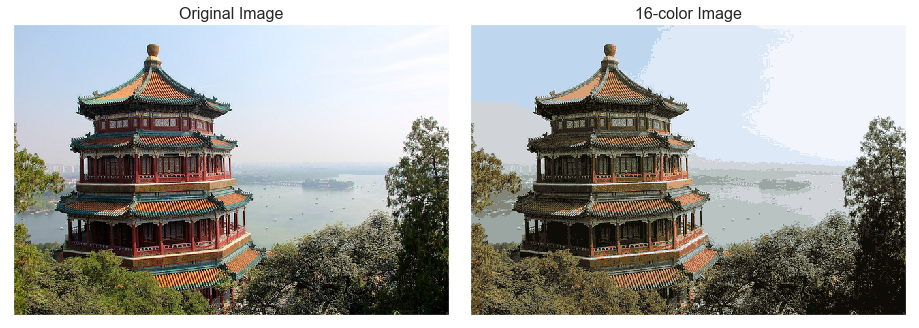

In [42]:
china_recolored = new_colors.reshape(china.shape)
fig, ax = plt.subplots(1, 2, figsize=(16, 6),
              subplot_kw=dict(xticks=[], yticks=[]))
fig.subplots_adjust(wspace=0.05)
ax[0].imshow(china)
ax[0].set_title('Original Image', size=16)
ax[1].imshow(china_recolored)
ax[1].set_title('16-color Image', size=16);

# In Depth: Gaussian Mixture Models

In [44]:
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set() 
import numpy as np

## Motivating GMM: Weaknesses of k-Means

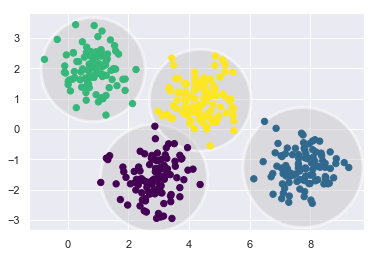

In [48]:
# weaknes of k-means:
# no info about confidents 

# Generate some data
from sklearn.datasets.samples_generator import make_blobs 
X, y_true = make_blobs(
    n_samples=400, 
    centers=4,
    cluster_std=0.60, 
    random_state=0) 

X = X[:, ::-1] # flip axes for better plotting

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
def plot_kmeans(kmeans, X, n_clusters=4, rseed=0, ax=None): 
    labels = kmeans.fit_predict(X)
    # plot the input data
    ax = ax or plt.gca()
    ax.axis('equal')
    ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    
    # plot the representation of the k-means model
    centers = kmeans.cluster_centers_
    radii = [cdist(X[labels == i], [center]).max()
             for i, center in enumerate(centers)] 
    for c, r in zip(centers, radii):
            ax.add_patch(plt.Circle(c, r, fc='#CCCCCC', lw=3, alpha=0.5, zorder=1))

kmeans = KMeans(n_clusters=4, random_state=0)
plot_kmeans(kmeans, X)

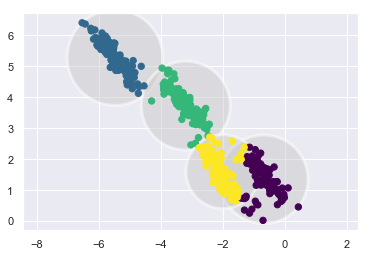

In [49]:
# clasters must be in circuls:
rng = np.random.RandomState(13)
X_stretched = np.dot(X, rng.randn(2, 2))
kmeans = KMeans(n_clusters=4, random_state=0)
plot_kmeans(kmeans, X_stretched)

One might imagine addressing this particular situation by preprocessing the data with PCA (see “In Depth: Principal Component Analysis” on page 433), but in practice there is no guarantee that such a global operation will circularize the individual data.

These two disadvantages of k-means—its lack of flexibility in cluster shape and lack of probabilistic cluster assignment—mean that for many datasets (especially low- dimensional datasets) it may not perform as well as you might hope.

# Если оценивать расстояние точки до всех центров, а не до ближайшего и разрешить кластерам быть произвольными элипсами, то мы  придем к Gaussian mixture models

## Generalizing E–M: Gaussian Mixture Models 

A Gaussian mixture model (GMM) attempts to find a mixture of multidimensional Gaussian probability distributions that best model any input dataset. In the simplest case, GMMs can be used for finding clusters in the same manner as k-means

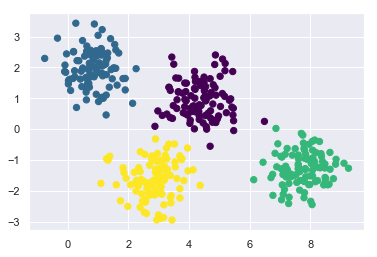

In [54]:
from sklearn.mixture import GaussianMixture as GMM
gmm = GMM(n_components=4).fit(X)
labels = gmm.predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis');

In [56]:
# мы можем увидить реальные вероятности
probs = gmm.predict_proba(X) 
print(probs[:5].round(3))

[[ 0.531  0.     0.469  0.   ]
 [ 0.     0.     0.     1.   ]
 [ 0.     0.     0.     1.   ]
 [ 1.     0.     0.     0.   ]
 [ 0.     0.     0.     1.   ]]


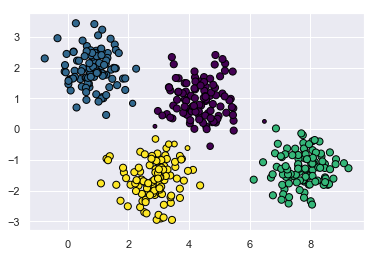

In [61]:
# визуализация уверенности
size = 50 * probs.max(1) ** 2 # square emphasizes differences 
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=size, edgecolor='black');

Under the hood, a Gaussian mixture model is very similar to k-means: it uses an
expectation–maximization approach that qualitatively does the following:
1. Choose starting guesses for the location and shape
2. Repeat until converged:

    a. E-step: for each point, find weights encoding the probability of membership in each cluster
        
    b. M-step: for each cluster, update its location, normalization, and shape based on all data points, making use of the weights

In [66]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs): 
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0])) 
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

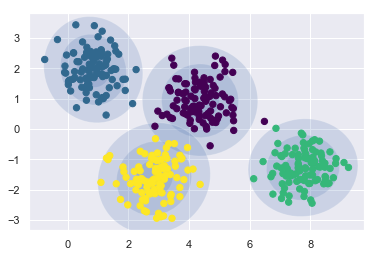

In [67]:
gmm = GMM(n_components=4, random_state=42)
plot_gmm(gmm, X)

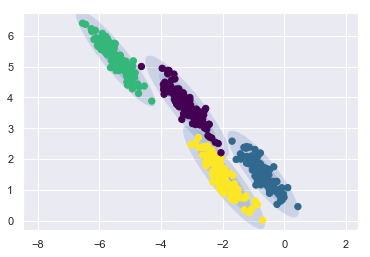

In [73]:
gmm = GMM(n_components=4, covariance_type='full', random_state=42)
plot_gmm(gmm, X_stretched)

## Choosing the covariance type

covariance_type - контролирует степень свободы в форме кластеров

* default is covariance_type="diag", which means that the size of the cluster along each dimension can be set independently, with the resulting ellipse constrained to align with the axes. 
* A slightly simpler and faster model is cova riance_type="spherical", which constrains the shape of the cluster such that all dimensions are equal. The resulting clustering will have similar characteristics to that of k-means, though it is not entirely equivalent. 
* A more complicated and computationally expensive model (especially as the number of dimensions grows) is to use covariance_type="full", which allows each cluster to be modeled as an ellipse with arbitrary orientation.

# GMM as Density Estimation

хотя gmm считается алкоритмом клсатеризации, вообще он алгоритм "density estimation".
Его результат - это генеративная вероятностноя модель описывающая распределение данных

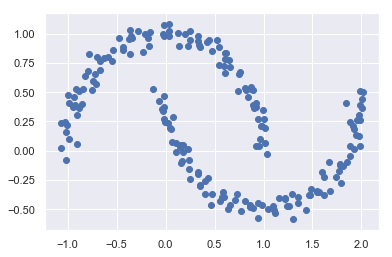

In [75]:
from sklearn.datasets import make_moons
Xmoon, ymoon = make_moons(200, noise=.05, random_state=0) 
plt.scatter(Xmoon[:, 0], Xmoon[:, 1]);

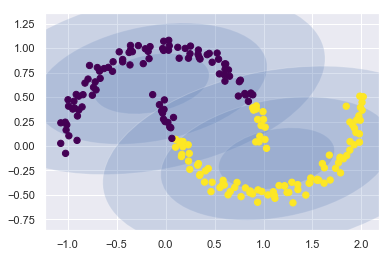

In [76]:
gmm2 = GMM(n_components=2, covariance_type='full', random_state=0)
plot_gmm(gmm2, Xmoon)

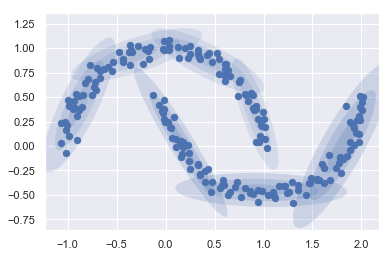

In [88]:
# больше компонент!
gmm16 = GMM(n_components=7, covariance_type='full', random_state=0)
plot_gmm(gmm16, Xmoon, label=False)

### How many components?

* cross-validation
* to adjust the model likelihoods using some ana‐ lytic criterion such as the Akaike information criterion (AIC) or the Bayesian infor‐ mation criterion (BIC).

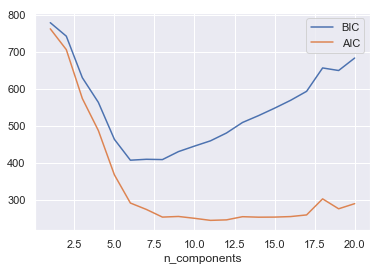

In [87]:
n_components = np.arange(1, 21)
models = [GMM(n, covariance_type='full', random_state=0).fit(Xmoon)
          for n in n_components]
plt.plot(n_components, [m.bic(Xmoon) for m in models], label='BIC') 
plt.plot(n_components, [m.aic(Xmoon) for m in models], label='AIC') 

plt.legend(loc='best')
plt.xlabel('n_components');

Notice the important point: this choice of number of components measures how well GMM works as a density estimator, not how well it works as a clustering algorithm. I’d encourage you to think of GMM primarily as a density estimator, and use it for clus‐ tering only when warranted within simple datasets.

# Example: GMM for Generating New Data

In [91]:
from sklearn.datasets import load_digits 
digits = load_digits()
digits.data.shape

(1797, 64)

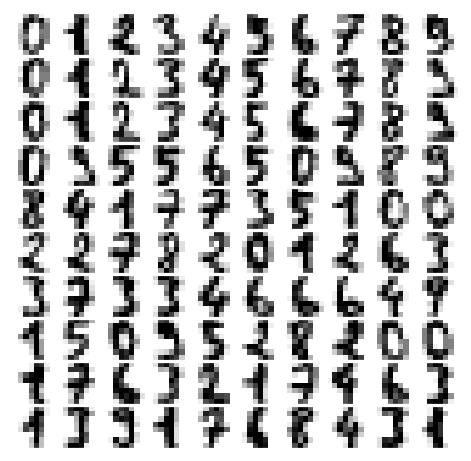

In [92]:
def plot_digits(data):
    fig, ax = plt.subplots(10, 10, figsize=(8, 8),
                           subplot_kw=dict(xticks=[], yticks=[]))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)
    
    for i, axi in enumerate(ax.flat):
        im = axi.imshow(data[i].reshape(8, 8), cmap='binary') 
        im.set_clim(0, 16)

plot_digits(digits.data)        

In [93]:
from sklearn.decomposition import PCA 
# сохраним 99% дисперсии данных
pca = PCA(0.99, whiten=True)
data = pca.fit_transform(digits.data)
data.shape

(1797, 41)

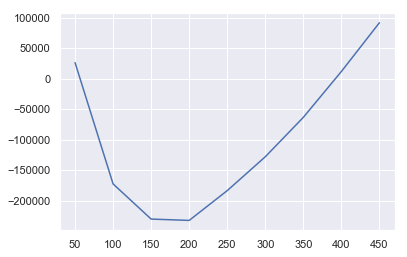

In [114]:
n_components = np.arange(50, 500, 50)
models = [GMM(n, covariance_type='full', random_state=0)
          for n in n_components]
aics = [model.fit(data).aic(data) for model in models] 
plt.plot(n_components, aics);

In [119]:
gmm = GMM(200, covariance_type='full', random_state=0)
gmm.fit(data)
print(gmm.converged_)

True


In [120]:
data_new = gmm.sample(100)[0]
data_new.shape

(100, 41)

In [121]:
len(data_new)

100

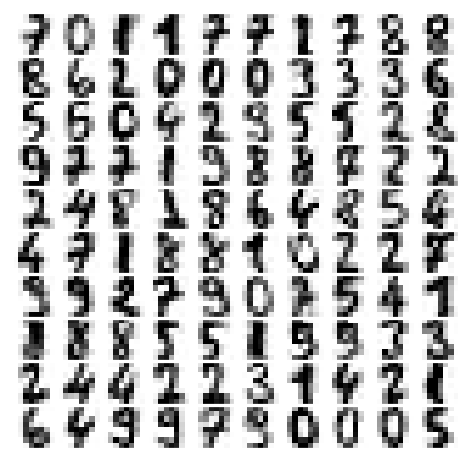

In [122]:
digits_new = pca.inverse_transform(data_new)
plot_digits(digits_new)

# In-Depth: Kernel Density Estimation

перевестти:
    In the previous section we covered Gaussian mixture models (GMM), which are a kind of hybrid between a clustering estimator and a density estimator. Recall that a density estimator is an algorithm that takes a D-dimensional dataset and produces an estimate of the D-dimensional probability distribution which that data is drawn from. The GMM algorithm accomplishes this by representing the density as a weighted sum of Gaussian distributions. Kernel density estimation (KDE) is in some senses an algorithm that takes the mixture-of-Gaussians idea to its logical extreme: it uses a mixture consisting of one Gaussian component per point, resulting in an essentially nonparametric estimator of density. In this section, we will explore the motivation and uses of KDE. We begin with the standard imports:

In [131]:
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set() 
import numpy as np

# Motivating KDE: Histograms

In [134]:
def make_data(N, f=0.3, rseed=1):
    rand = np.random.RandomState(rseed)
    x = rand.randn(N) 
    x[int(f * N):] += 5 
    return x
           

x = make_data(1000)

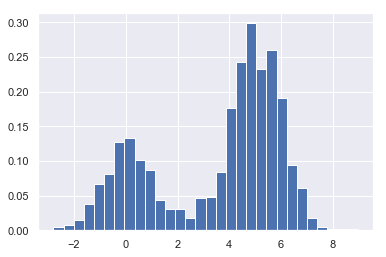

In [139]:
hist = plt.hist(x, bins=30, normed=True)

нормализация (по Y) это просто доля значений

In [140]:
density, bins, patches = hist
widths = bins[1:] - bins[:-1]
(density * widths).sum()

1.0

если испльзовать гистограмму как способ оценить плотность, то как правильно выбрать колличиство бинов?

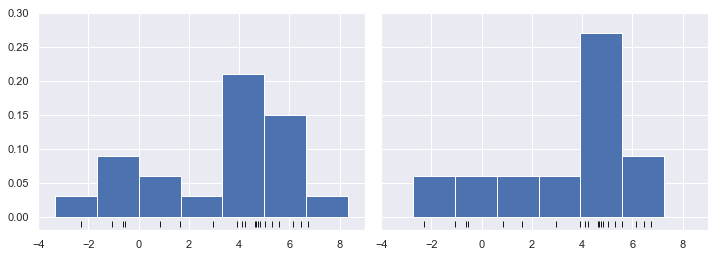

In [209]:
x = make_data(20)
bins = np.linspace(-5, 10, 10)

fig, ax = plt.subplots(1, 2, figsize=(12, 4),
                       sharex=True, sharey=True,
                       subplot_kw={'xlim':(-4, 9),
                                   'ylim':(-0.02, 0.3)}
                      )
fig.subplots_adjust(wspace=0.05)

for i, offset in enumerate([0.0, 0.6]): 
    ax[i].hist(x, bins=bins + offset, normed=True) 
    ax[i].plot(x, np.full_like(x, -0.01), '|k', markeredgewidth=1)

In [155]:
# слева бимодальное распределения, справа - одномодальное с хвостом
# так как быть уверенным что гистограмма построенна правильно?

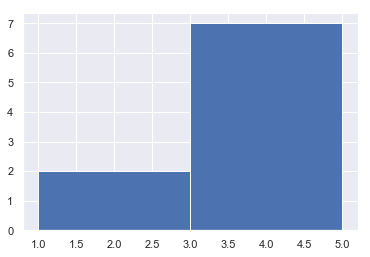

In [153]:
# bins - int (колличество бинов), array (границы бинов)
plt.hist(x, bins=np.array([1, 3, 5]));

(-0.2, 8)

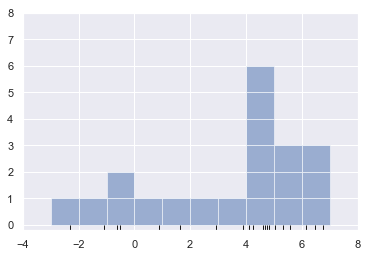

In [158]:
# hist as stack of blocks

fig, ax = plt.subplots()
bins = np.arange(-3, 8)
ax.plot(x, np.full_like(x, -0.1), '|k', markeredgewidth=1)
for count, edge in zip(*np.histogram(x, bins)): 
    for i in range(count):
        ax.add_patch(plt.Rectangle((edge, i), 1, 1, alpha=0.5))
ax.set_xlim(-4, 8)
ax.set_ylim(-0.2, 8)

The problem with our two binnings stems from the fact that the height of the block stack often reflects not on the actual density of points nearby, but on coincidences of how the bins align with the data points. This misalignment between points and their blocks is a potential cause of the poor histogram results seen here. But what if, instead of stacking the blocks aligned with the bins, we were to stack the blocks aligned with the points they represent? If we do this, the blocks won’t be aligned, but we can add their contributions at each location along the x-axis to find the result. Let’s try this

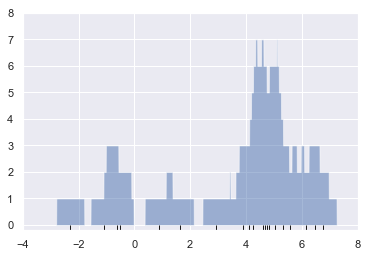

In [235]:
# сделаем гистограмму не по бинам, а по точкам в данных:
x_d = np.linspace(-4, 8, 2000)

# тут мы итерируемсяс по точкам в x и смотрим у скольки из ни разница со значениями в x_d меньше  0.5
density = sum((abs(xi - x_d) < 0.5) for xi in x)
plt.fill_between(x_d, density, alpha=0.5)
plt.plot(x, np.full_like(x, -0.1), '|k', markeredgewidth=1)
plt.axis([-4, 8, -0.2, 8]);

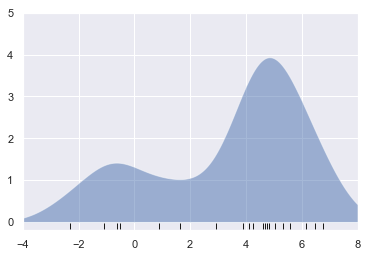

In [236]:
from scipy.stats import norm
x_d = np.linspace(-4, 8, 1000)
density = sum(norm(xi).pdf(x_d) for xi in x)
plt.fill_between(x_d, density, alpha=0.5)
plt.plot(x, np.full_like(x, -0.1), '|k', markeredgewidth=1)
plt.axis([-4, 8, -0.2, 5]);

# These last two plots are examples of kernel density estimation in one dimension: the first uses a so-called “tophat” kernel and the second uses a Gaussian kernel. We’ll now look at kernel density estimation in more detail.

# Kernel Density Estimation in Practice

единственный параметр KDE это выбор ядра, которое определяет форму распределения и `kernel bandwidth` определяет размер ядра для каждой точки.

Because KDE can be fairly computationally intensive, the Scikit-Learn estimator uses a tree-based algorithm under the hood and can trade off computation time for accuracy using the atol (absolute tolerance) and rtol (relative tolerance) parameters.

(-0.02, 0.22)

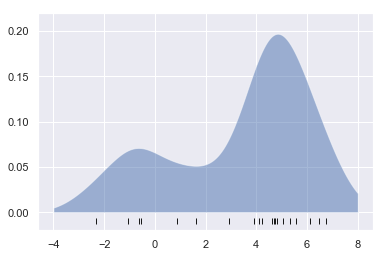

In [239]:
from sklearn.neighbors import KernelDensity
# instantiate and fit the KDE model
kde = KernelDensity(bandwidth=1.0, kernel='gaussian')
kde.fit(x[:, None])

# score_samples returns the log of the probability density
logprob = kde.score_samples(x_d[:, None])

plt.fill_between(x_d, np.exp(logprob), alpha=0.5)
plt.plot(x, np.full_like(x, -0.01), '|k', markeredgewidth=1)
plt.ylim(-0.02, 0.22)

## Selecting the bandwidth via cross-validation

The choice of bandwidth within KDE is extremely important to finding a suitable density estimate, and is the knob that controls the bias–variance trade-off in the esti‐ mate of density: too narrow a bandwidth leads to a high-variance estimate (i.e., over‐ fitting), where the presence or absence of a single point makes a large difference. Too wide a bandwidth leads to a high-bias estimate (i.e., underfitting) where the structure in the data is washed out by the wide kernel.

In [248]:
from sklearn.model_selection import GridSearchCV, LeaveOneOut

bandwidths = 10 ** np.linspace(-1, 1, 100)
grid = GridSearchCV(KernelDensity(kernel='gaussian'),
                    {'bandwidth': bandwidths},
                    cv=lv)
grid.fit(x[:, None]);

In [250]:
grid.best_params_

{'bandwidth': 1.1233240329780276}

### Example: KDE on a Sphere

одни из использований KDE - графисеское представление распределения точек (например встроен в seaborn)

In [253]:
from sklearn.datasets import fetch_species_distributions 
data = fetch_species_distributions()

# Get matrices/arrays of species IDs and locations
latlon = np.vstack([data.train['dd lat'],
                    data.train['dd long']]).T

species = np.array([d.decode('ascii').startswith('micro')
                    for d in data.train['species']], dtype='int')

In [267]:
plt.rcParams['figure.edgecolor'] = 'black'
plt.rcParams['figure.figsize'] = 15, 10

/Users/ilya/anaconda/envs/conda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  axisbgc = ax.get_axis_bgcolor()
/Users/ilya/anaconda/envs/conda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/ilya/anaconda/envs/conda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


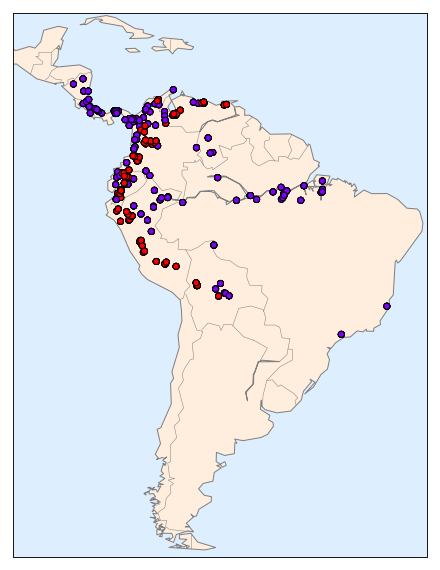

In [268]:
from mpl_toolkits.basemap import Basemap
from sklearn.datasets.species_distributions import construct_grids

xgrid, ygrid = construct_grids(data)

# plot coastlines with Basemap
m = Basemap(projection='cyl', resolution='c', 
            llcrnrlat=ygrid.min(), urcrnrlat=ygrid.max(),
            llcrnrlon=xgrid.min(), urcrnrlon=xgrid.max())

m.drawmapboundary(fill_color='#DDEEFF')
m.fillcontinents(color='#FFEEDD')
m.drawcoastlines(color='gray', zorder=2)
m.drawcountries(color='gray', zorder=2)

# plot locations
m.scatter(latlon[:, 1], latlon[:, 0], zorder=3, c=species, edgecolor='black', cmap='rainbow',  latlon=True);

# в общем этот график не оч - здесь 1600 точек и плотность не понятна

# используем KDE

In [271]:
# Set up the data grid for the contour plot
X, Y = np.meshgrid(xgrid[::5], ygrid[::5][::-1]) 
land_reference = data.coverages[6][::5, ::5] 
land_mask = (land_reference > -9999).ravel()
xy = np.vstack([Y.ravel(), X.ravel()]).T
xy = np.radians(xy[land_mask])

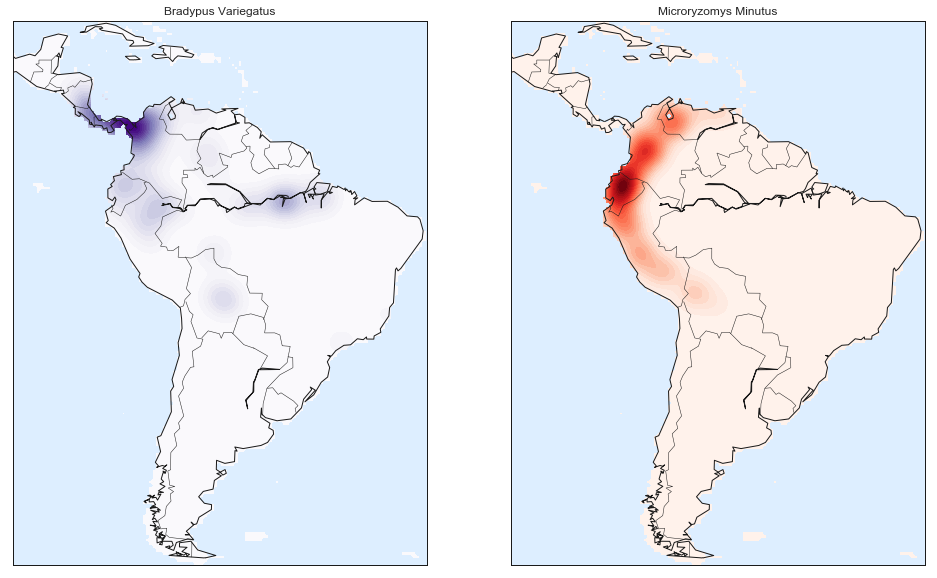

In [274]:
# Create two side-by-side plots
fig, ax = plt.subplots(1, 2)
fig.subplots_adjust(left=0.05, right=0.95, wspace=0.05)
species_names = ['Bradypus Variegatus', 'Microryzomys Minutus']
cmaps = ['Purples', 'Reds']

for i, axi in enumerate(ax): 
    axi.set_title(species_names[i])
    
    # plot coastlines with Basemap
    m = Basemap(projection='cyl', llcrnrlat=Y.min(),
                urcrnrlat=Y.max(), llcrnrlon=X.min(),
                urcrnrlon=X.max(), resolution='c', ax=axi)
    m.drawmapboundary(fill_color='#DDEEFF')
    m.drawcoastlines()
    m.drawcountries()
    # construct a spherical kernel density estimate of the distribution
    kde = KernelDensity(bandwidth=0.03, metric='haversine')
    kde.fit(np.radians(latlon[species == i]))
    
    # evaluate only on the land: -9999 indicates ocean
    Z = np.full(land_mask.shape[0], -9999.0)
    Z[land_mask] = np.exp(kde.score_samples(xy))
    Z = Z.reshape(X.shape)
    
    # plot contours of the density
    levels = np.linspace(0, Z.max(), 25)
    axi.contourf(X, Y, Z, levels=levels, cmap=cmaps[i])

# Example: Not-So-Naive Bayes

This example looks at Bayesian generative classification with KDE, and demonstrates how to use the Scikit-Learn architecture to create a custom estimator.

Генеративная классификация:
1. разделить данные по label
2. на каждой части обучить KDE: P(x | y)
3. на тренировочных данных посчитать P(y)
4. для любого неизвестного x постериорная вероятность P(x | y) * P(y)

In [288]:
from sklearn.base import BaseEstimator, ClassifierMixin

class KDEClassifier(BaseEstimator, ClassifierMixin):
    """
    Bayesian generative classification based on KDE
    Parameters
    ----------
    bandwidth : float
        the kernel bandwidth within each class
    kernel : str
        the kernel name, passed to KernelDensity
    """
    
    def __init__(self, bandwidth=1.0, kernel='gaussian'): 
        """ initialization contains no operations other 
        than assigning the passed values by name to self"""
        self.bandwidth = bandwidth
        self.kernel = kernel
        
    def fit(self, X, y):
        """each persistent result of the fit is stored with a trailing underscore 
        (e.g., self.logpriors_)"""
        self.classes_ = np.sort(np.unique(y))
        training_sets = [X[y == yi] for yi in self.classes_] 
        
        self.models_ = [KernelDensity(bandwidth=self.bandwidth, kernel=self.kernel).fit(Xi) 
                        for Xi in training_sets]
        self.logpriors_ = [np.log(Xi.shape[0] / X.shape[0]) for Xi in training_sets]
        return self
    
    def predict_proba(self, X):
        logprobs = np.array([model.score_samples(X)
                             for model in self.models_]).T 
        result = np.exp(logprobs + self.logpriors_)
        return result / result.sum(1, keepdims=True)
    
    def predict(self, X):
        return self.classes_[np.argmax(self.predict_proba(X), 1)]


In [ ]:
from sklearn.datasets import load_digits 
from sklearn.model_selection import GridSearchCV

digits = load_digits()
bandwidths = 10 ** np.linspace(0, 2, 100)

grid = GridSearchCV(KDEClassifier(), {'bandwidth': bandwidths})
grid.fit(digits.data, digits.target)

In [300]:
scores = grid.cv_results_['mean_test_score']

{'bandwidth': 7.0548023107186433}
accuracy = 0.966611018364


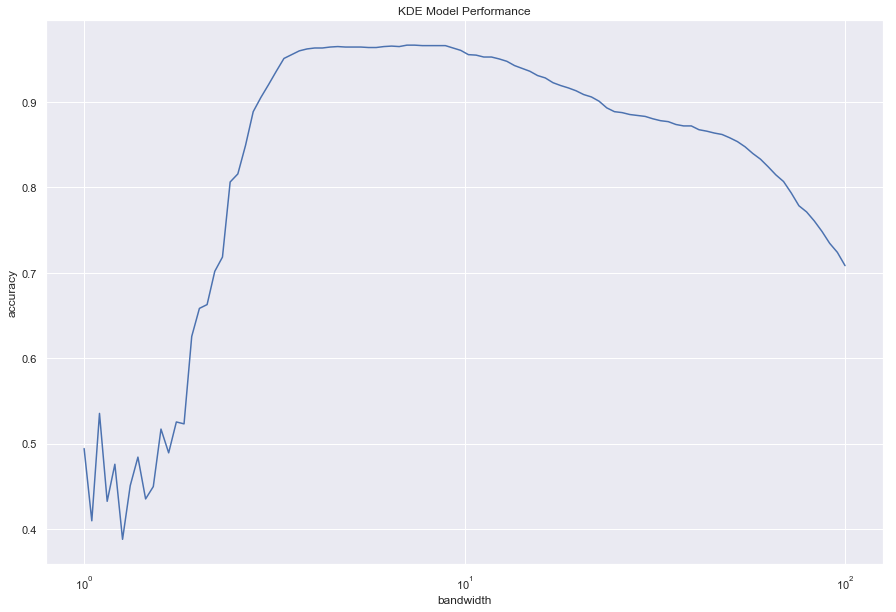

In [301]:
plt.semilogx(bandwidths, scores)
plt.xlabel('bandwidth')
plt.ylabel('accuracy')
plt.title('KDE Model Performance')

print(grid.best_params_) 
print('accuracy =', grid.best_score_)

In [305]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score 
# sklearn..cross_val_score

cross_val_score(GaussianNB(), digits.data, digits.target).mean()

/Users/ilya/anaconda/envs/conda/lib/python3.5/site-packages/sklearn/model_selection/_split.py:1943: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


0.81860038035501381

One benefit of such a generative classifier is interpretability of results: for each unknown sample, we not only get a probabilistic classification, but a full model of the distribution of points we are comparing it to! If desired, this offers an intuitive win‐ dow into the reasons for a particular classification that algorithms like SVMs and ran‐ dom forests tend to obscure.

If you would like to take this further, there are some improvements that could be made to our KDE classifier model:
* We could allow the bandwidth in each class to vary independently.
* We could optimize these bandwidths not based on their prediction score, but on the likelihood of the training data under the generative model within each class (i.e., use the scores from KernelDensity itself rather than the global prediction accuracy).

# Application: A face detection pipeline

## Histogram of Oriented Gradients (HOG) 

фичи из изображений

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set() 
import numpy as np

HOG:
1. нормализация картинки
2. свертка двумя фильтрами, чувствительными к горизонтальным и вертикальным градиентам яркости (они формируют инфу о контурах, краях и текстуре)
3. деление картинки на клетки заданного размера и вычисление в них гистограммы градиентов ориентации
4. нормализация гистограмм через сравнение с соседними ячейками
5. создание 1-d векторо признаков в каждой ячейке

/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


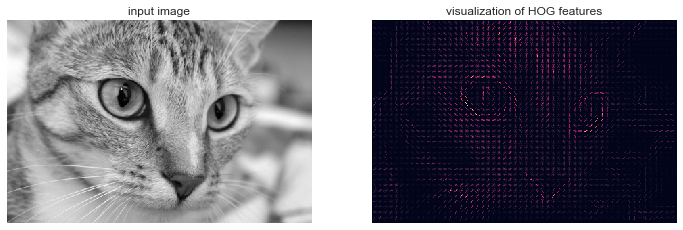

In [2]:
from skimage import data, color, feature
import skimage.data
image = color.rgb2gray(data.chelsea())
hog_vec, hog_vis = feature.hog(image, visualise=True)
fig, ax = plt.subplots(1, 2, figsize=(12, 6),
subplot_kw=dict(xticks=[], yticks=[]))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('input image')
ax[1].imshow(hog_vis)
ax[1].set_title('visualization of HOG features');

face detector:

1. Obtain a set of positive training samples.

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
from sklearn.datasets import fetch_lfw_people 
faces = fetch_lfw_people()
positive_patches = faces.images
positive_patches.shape

(13233, 62, 47)

2. Obtain a set of negative training samples.

In [6]:
from skimage import data, transform
imgs_to_use = ['camera', 'text', 'coins', 'moon',
               'page', 'clock', 'immunohistochemistry',
               'chelsea', 'coffee', 'hubble_deep_field']
images = [color.rgb2gray(getattr(data, name)()) for name in imgs_to_use]

In [9]:
len(images[0])

512

In [10]:
from sklearn.feature_extraction.image import PatchExtractor
def extract_patches(img, N, scale=1.0, patch_size=positive_patches[0].shape):
    extracted_patch_size = \
        tuple((scale * np.array(patch_size)).astype(int))
    extractor = PatchExtractor(patch_size=extracted_patch_size, max_patches=N, random_state=0)
    patches = extractor.transform(img[np.newaxis])
    
    if scale != 1:
        patches = np.array([transform.resize(patch, patch_size) for patch in patches])
    
    return patches

In [11]:
negative_patches = np.vstack([extract_patches(im, 1000, scale)
                              for im in images for scale in [0.5, 1.0, 2.0]])
negative_patches.shape

(30000, 62, 47)

In [15]:
plt.rcParams['figure.figsize'] = 15, 10

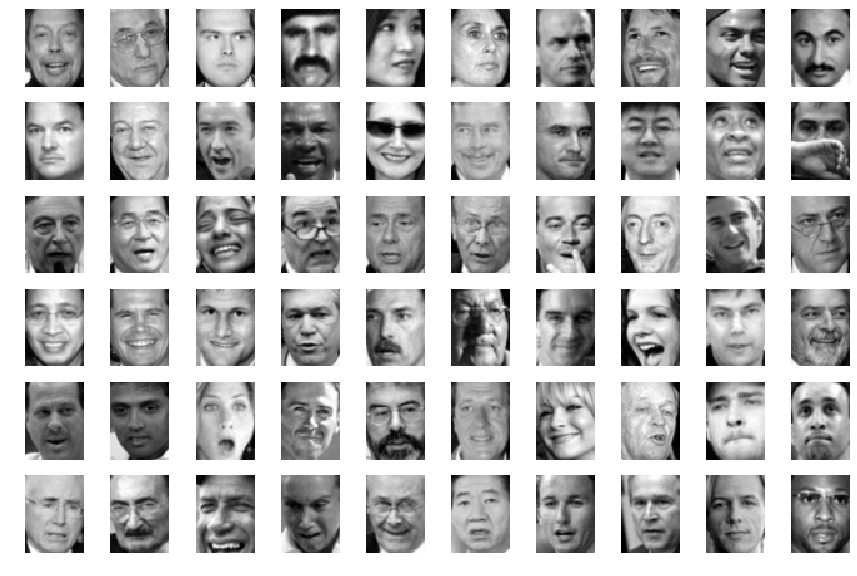

In [18]:
fig, ax = plt.subplots(6, 10) 
for i, axi in enumerate(ax.flat):
    axi.imshow(positive_patches[i], cmap='gray')
    axi.axis('off')

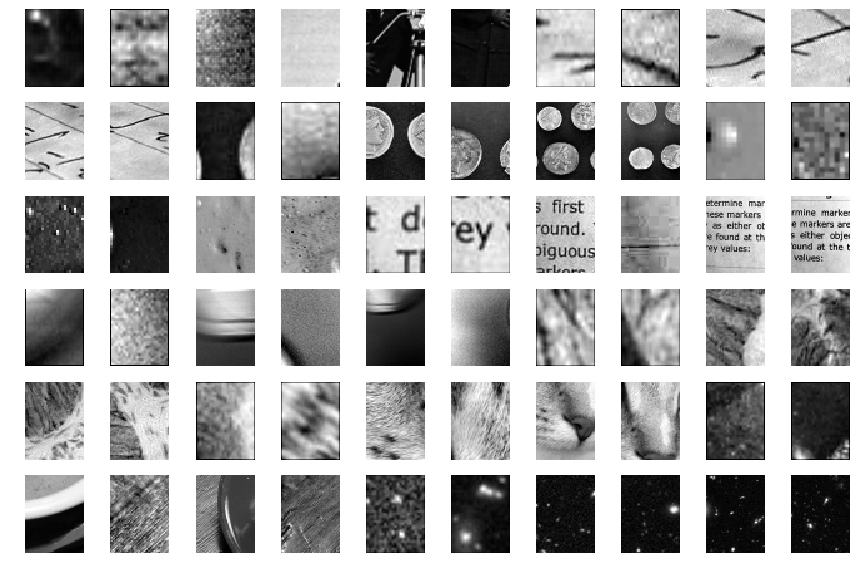

In [16]:
fig, ax = plt.subplots(6, 10) 
for i, axi in enumerate(ax.flat):
    axi.imshow(negative_patches[500 * i], cmap='gray')
    axi.axis('off')

3. Combine sets and extract HOG features.

In [19]:
from itertools import chain 

X_train = np.array([feature.hog(im)
                    for im in chain(positive_patches, negative_patches)])

y_train = np.zeros(X_train.shape[0])
y_train[:positive_patches.shape[0]] = 1

In [20]:
X_train.shape

(43233, 1215)

4. Train a support vector machine.

In [22]:
# base line with naive bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.cross_validation import cross_val_score
cross_val_score(GaussianNB(), X_train, y_train)

array([0.94684616, 0.91423218, 0.94073971])

In [23]:
from sklearn.svm import LinearSVC
from sklearn.grid_search import GridSearchCV
grid = GridSearchCV(LinearSVC(), {'C': [1.0, 2.0, 4.0, 8.0]}) 
grid.fit(X_train, y_train)
grid.best_score_

0.9864224088080864

In [24]:
grid.best_params_

{'C': 2.0}

In [25]:
model = grid.best_estimator_
model.fit(X_train, y_train)

LinearSVC(C=2.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)

5. Find faces in a new image.

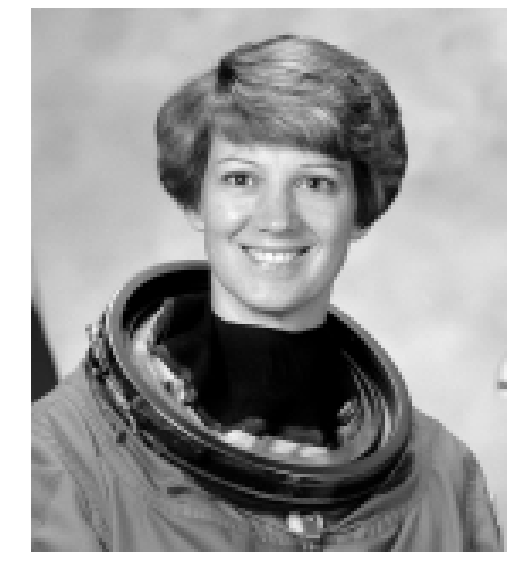

In [26]:
test_image = skimage.data.astronaut()
test_image = skimage.color.rgb2gray(test_image)
test_image = skimage.transform.rescale(test_image, 0.5)
test_image = test_image[:160, 40:180]

plt.imshow(test_image, cmap='gray')
plt.axis('off');

In [27]:
def sliding_window(img, patch_size=positive_patches[0].shape, istep=2, jstep=2, scale=1.0):
    Ni, Nj = (int(scale * s) for s in patch_size)
    for i in range(0, img.shape[0] - Ni, istep):
        for j in range(0, img.shape[1] - Ni, jstep):
            patch = img[i:i + Ni, j:j + Nj]
            if scale != 1:
                patch = transform.resize(patch, patch_size)
            yield (i, j), patch

In [28]:
indices, patches = zip(*sliding_window(test_image))
patches_hog = np.array([feature.hog(patch) for patch in patches]) 
patches_hog.shape

(1911, 1215)

In [29]:
labels = model.predict(patches_hog)
labels.sum()

31.0

In [30]:
# 31 граница лица из 1911!

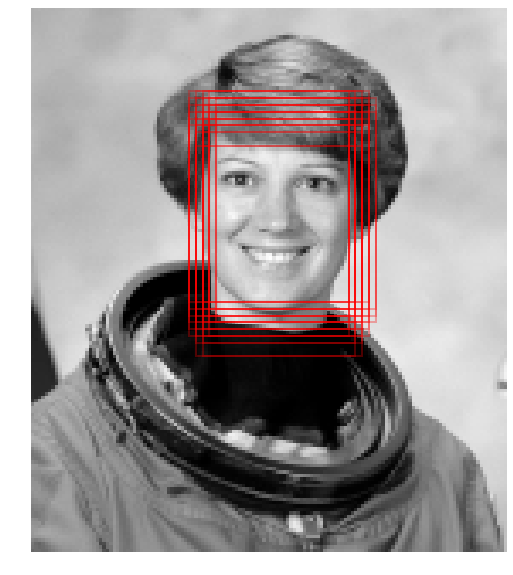

In [31]:
fig, ax = plt.subplots()
ax.imshow(test_image, cmap='gray')
ax.axis('off')

Ni, Nj = positive_patches[0].shape
indices = np.array(indices)

for i, j in indices[labels == 1]: 
    ax.add_patch(
        plt.Rectangle((j, i), 
                      Nj, Ni, 
                      edgecolor='red',
                      alpha=0.3, lw=2,
                      facecolor='none')
    )

# улучшения/предостережения

Our training set, especially for negative features, is not very complete
* скромный датасет
* hard negative mining - найти те участки фото, где алгоритм ошибается и явно добавить их в negative

Our current pipeline searches only at one scale
* сейчас размеры только 62х47, нужно менять масштабы и проходить несколько раз 

We should combine overlapped detection patches
* via an unsupervised clustering approach (MeanShift Clustering is one good candidate for this), or via a procedural approach such as nonmaximum suppression, an algorithm common in machine vision.

The pipeline should be streamlined
* сделать API к модели и предобработкам

More recent advances, such as deep learning, should be considered
* HOG не state-of-the-art. Deep learning рулит

## Machine Learning in Python

To learn more about machine learning in Python, I’d suggest some of the following resources:
* The Scikit-Learn website
* SciPy, PyCon, and PyData tutorial videos (Scikit-Learn and other machine learning topics are perennial favorites in the tutorial tracks of many Python-focused conference series, in particular the PyCon, SciPy, and PyData conferences. You can find the most recent ones via a simple web search.)
* Introduction to Machine Learning with Python (Written by Andreas C. Mueller and Sarah Guido, this book includes a fuller treat‐ ment of the topics in this chapter. If you’re interested in reviewing the fundamen‐ tals of machine learning and pushing the Scikit-Learn toolkit to its limits, this is a great resource, written by one of the most prolific developers on the Scikit-Learn team.)
* Python Machine Learning (Sebastian Raschka’s book focuses less on Scikit-Learn itself, and more on the breadth of machine learning tools available in Python. In particular, there is some very useful discussion on how to scale Python-based machine learning approaches to large and complex datasets.)

## эти для глубокого погружения в математику:

* Machine Learning (Taught by Andrew Ng (Coursera), this is a very clearly taught, free online course covering the basics of machine learning from an algorithmic perspective. It assumes undergraduate-level understanding of mathematics and programming, and steps through detailed considerations of some of the most important machine learning algorithms. Homework assignments, which are algorithmically graded, have you actually implement some of these models yourself.)
* Pattern Recognition and Machine Learning (Written by Christopher Bishop, this classic technical text covers the concepts of machine learning discussed in this chapter in detail. If you plan to go further in this subject, you should have this book on your shelf.)
* Machine Learning: A Probabilistic Perspective (Written by Kevin Murphy, this is an excellent graduate-level text that explores nearly all important machine learning algorithms from a ground-up, unified probabilistic perspective.)